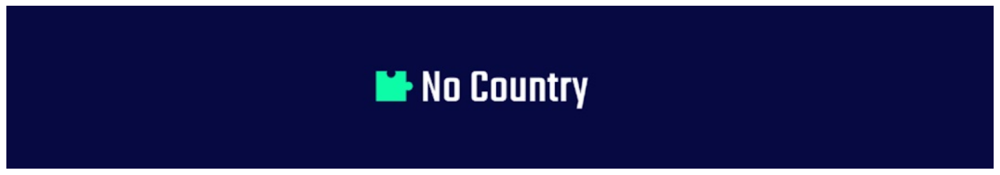

In [ ]:
# Imagen("/content/drive/MyDrive/No Country Proyecto/Data/banner nocountry.jpg", (20,10))

# Importaciones e Instancia de Datos

In [11]:
!pip install missingno -q

In [10]:
# Modulos a utilizar
import os
import pandas as pd
import numpy as np
import pyarrow as pa
import pyarrow.parquet as pq
import missingno as msno
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
from google.colab import drive # En el caso de trabajar en el entorno de Google Colab, debemos importar algunas dependencias.
#import funciones  # en el caso de trabajar modularizando las funciones con respecto al cuaderno, creando un script que las contenga y que actue como libreria para su importación
import warnings
warnings.filterwarnings(action= 'ignore')


In [ ]:
# Montamos el repositorio drive para trabajar los archivos que contiene (de ser necesario)
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# instanciamos el fichero con la data
df= pd.read_parquet('/content/drive/MyDrive/No Country Proyecto/Data/Clean/Icfes2023.parquet')

In [ ]:
# Reiniciamos su indice
df= df.drop_duplicates().reset_index(drop= True)

# Funciones

In [12]:
def Imagen(path_relativo: str, size: tuple[int,int], path_absoluto:  None|str= None):

    """
    Esta funcion recibe un path relativo referente a una imagen (o un path absoluto), y el tamaño/dimensiones que
    debe tener en forma de tupla (width, height)

    devuelve la imagen pasada con las dimensiones obtenidas

    parameters: path_relativo (str), size (tuple[int,int]), path_absoluto(None,str)

    returns: None
    """

    import matplotlib.pyplot as plt
    import matplotlib.image as mpimg

    # if path_absoluto == None:
        # Load image
        # image = mpimg.imread("/lakehouse/default/" + path_relativo)
    # else:

    # Load image
    image = mpimg.imread(path_relativo)
    # Let the axes disappear
    plt.figure(figsize= size)
    plt.axis('off')
    # Plot image in the output
    image_plot = plt.imshow(image)

### Para Informe preliminar

In [13]:
def verificar_tipo_datos(df):

    mi_dict = {"nombre_campo": [], "tipo_datos": [], "no_nulos_%": [], "nulos_%": [], "nulos": []}

    for columna in df.columns:
        porcentaje_no_nulos = (df[columna].count() / len(df)) * 100
        mi_dict["nombre_campo"].append(columna)
        mi_dict["tipo_datos"].append(df[columna].apply(type).unique())
        mi_dict["no_nulos_%"].append(round(porcentaje_no_nulos, 2))
        mi_dict["nulos_%"].append(round(100-porcentaje_no_nulos, 2))
        mi_dict["nulos"].append(df[columna].isnull().sum())

    df_info = pd.DataFrame(mi_dict)
    pd.set_option('display.max_rows', None)

    return df_info

In [14]:
def informe_dataframe(dataframe: pd.DataFrame) -> None:

    df = dataframe

    print('INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:\n')
    print(f'--Dimensiones del DataFrame--\nFilas: {df.shape[0]}\nColumnas: {df.shape[1]}\n')
    print(f'--Numero de datos--\n{df[df.isna() == False].count().sum()}\n')
    print(f'--Filas y Columnas--\nFilas: muestra de indices-------> {list(df.index)[0:5]}  -----> Desde {list(df.index)[0]}  Hasta {list(df.index)[-1]}\nColumnas: {list(df.columns)}\n')
    print(f'--Tipo de columnas--\n{df.dtypes}\n')
    columnas= df.columns

    if 'hours' in columnas and 'attributes' not in columnas:
        print(f'--Cantidad de registros duplicados--\n{df.drop(columns=["hours"]).duplicated().sum()}\n')
    elif 'hours' not in columnas and 'attributes' in columnas:
        print(f'--Cantidad de registros duplicados--\n{df.drop(columns=["attributes"]).duplicated().sum()}\n')
    elif 'hours' in columnas and 'attributes' in columnas:
        print(f'--Cantidad de registros duplicados--\n{df.drop(columns=["hours","attributes"]).duplicated().sum()}\n')
    else:
        print(f'--Cantidad de registros duplicados--\n{df.duplicated().sum()}\n')


    # print(f'--Estadisticos preliminares generales--\n{df.describe()}\n')

    return ('~'*50)+'oo'+('~'*50)

In [15]:
def informe_columna(df: None|pd.DataFrame, columna: None|str) -> None:

    data = df[columna]

    def valores_atipicos(muestra):
        import numpy as np

        if muestra.dtype != 'datetime64[ns]' and muestra.dtype != 'object':
            Q1= muestra.quantile(0.25)
            Q3= muestra.quantile(0.75)
            mediana= muestra.median()
            IQR= Q3-Q1

            print(f'Rango intercuartilico: {IQR}')

            limit_sup= Q3 + 1.5*IQR
            limit_inf= Q1 - 1.5*IQR
            print(f'Limite superior de la caja: {limit_sup}\n')
            # print(limit_inf)

            ## buscamos los valores atipicos
            superior= muestra >= (Q3 + 1.5*IQR)
            inferior=  muestra <= (Q1 - 1.5*IQR)

            print(f'Indices donde el valor excede el valor excede el limite superior de la caja:\n {np.where(superior)}\n')
            print(f'Indices donde el valor excede el valor excede el limite inferior de la caja:\n {np.where(inferior)}\n')
        else:
            pass

    # print(f'Informe preliminar sobre la columna/feature {columna}:\n')
    print(f'INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE {columna}:\n')
    if data.dtype == 'object':
        print(f'--Numero de datos nulos--\n{data.isna().sum()}\n')
        print(f'--Cantidad de valores unicos en la columna--\n{data.describe()[1]}\n')

        if len(data.unique()) > 5:
            print(f'--Valores unicos en la columna (Primeros 5 valores)--\n{data.unique()[0:5]}\n')
        else:
            print(f'--Valores unicos en la columna--\n{data.unique()}\n')

        print(f'--Moda de la columna especificada--\nValor modal -----> {data.describe()[2]}\nFrecuencia acumulada ------> {data.describe()[3]}\n')
        print(f'--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--\n {data.value_counts().nlargest(3)}\n')
        print('-'*120)
        print('-'*120)
    elif data.dtype == 'datetime64[ns]':
        print(f'--Numero de datos nulos--\n{data.isna().sum()}\n')
        print(f'--Cantidad de valores unicos en la columna--\n{data.describe()[1]}\n')
        ## En el print siguinte, realizamos un formateo de los valores de la columna, ya que la salida predeterminada (el output) agrega otros valores que hacen la intrepretacion mas dificil e incomoda
        print(f'--Valores unicos en la columna--\nEj: {data.dt.strftime("%Y-%m-%d").unique()[0:3]}  -----> Desde {list(data.dt.strftime("%Y-%m-%d").unique())[0]}  Hasta {list(data.dt.strftime("%Y-%m-%d").unique())[-1]}\n')
        print(f'--Moda de la columna especificada--\nValor modal -----> {data.describe()[2]}\nFrecuencia acumulada ------> {data.describe()[3]}\n')
        print(f'--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--\n {data.value_counts().nlargest(3)}\n')
        print(f'--Valor maximo y minimo--\nMaximo: {data.max()}\nMinimo: {data.min()}\n')
        print('-'*120)
        print('-'*120)
    else:
        print(f'--Numero de datos nulos--\n{data.isna().sum()}\n')
        print(f'--Valores unicos en la columna--\nEj: {data.unique()[0:5]}  -----> Desde {list(data.unique())[0]}  Hasta {list(data.unique())[-1]}\n')
        print(f'--Estadisticos Principales de la columna--\nMedia: {round(data.mean(),2)}\nDesviacion Estandar: {round(data.std(),2)}\nPrimer cuartil: {data.quantile(0.25)}\nMediana: {data.median()}\nTercer cuartil: {data.quantile(0.75)}\n')
        print(f'--Valores extremos--\nValor maximo: {data.max()}\nValor minimo: {data.min()}\n')
        print(f'--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--\n {data.value_counts().nlargest(3)}\n')
        print(f'--Valor maximo y minimo--\nMaximo: {data.max()}\nMinimo: {data.min()}\n')
        valores_atipicos(data)
        print('-'*120)
        print('-'*120)
    return

In [16]:
def visualizar_nulos(df):
    # fig, axes = plt.subplots(2, 2, figsize=(40, 40))

    # msno.matrix(df, ax=axes[0, 0])
    # msno.bar(df, ax=axes[0, 1])
    # msno.heatmap(df, ax=axes[1, 0])
    # msno.dendrogram(df, ax=axes[1, 1])

    # axes[0, 0].set_title('Matrix Plot')
    # axes[0, 1].set_title('Bar Plot')
    # axes[1, 0].set_title('Heatmap')
    # axes[1, 1].set_title('Dendrogram')
    plt.figure(figsize= (30,30))

    msno.matrix(df)
    plt.title('Matrix Plot')

    msno.bar(df)
    plt.title('Bar Plot')

    msno.heatmap(df)
    plt.title('Heatmap')

    msno.dendrogram(df)
    plt.title('Dendrogram')

    plt.tight_layout()
    plt.show()

In [17]:
def analisis_frecuencia_palabras(dataframe: pd.DataFrame|None, ax=None):

    columnas_cualitativas = dataframe.select_dtypes(include=['object']).columns.tolist()

    if not columnas_cualitativas:
        return 'No existen columnas de tipo str en el dataframe'
    for columna in columnas_cualitativas:
        dataframe[columna] = dataframe[columna].astype(str)
    for columna in columnas_cualitativas:
        texto_columna = dataframe[columna].str.lower().str.replace(r'[^a-zA-Z\s]', '').str.split()
        palabras_columna = [word for sublist in texto_columna for word in sublist]
        frecuencia_palabras = Counter(palabras_columna)
        palabras_mas_frecuentes = frecuencia_palabras.most_common(20)
        plt.figure(figsize=(10, 6))
        plt.bar(*zip(*palabras_mas_frecuentes))
        plt.xticks(rotation=45)
        plt.xlabel('Palabra')
        plt.ylabel('Frecuencia')
        plt.title(f'Palabras más frecuentes en la columna {columna}')
        plt.show()

In [18]:
def boxplots_numericas(dataframe):
    df_numericas = dataframe.select_dtypes(include=['number'])
    if df_numericas.empty:
        return 'No existen columnas de tipo numericas en el dataframe'
    for columna in df_numericas.columns:
        sns.boxplot(x=dataframe[columna])
        plt.title(f'Diagrama de caja para {columna}')
        plt.show()

In [ ]:
# def graficos_multiples(dataframe: pd.DataFrame) -> None:

#     fig, axs = plt.subplots(2, 1, figsize=(20, 10))

#     analisis_frecuencia_palabras(dataframe, ax=axs[0])
#     boxplots_numericas(dataframe, ax=axs[1])

#     plt.tight_layout()
#     plt.show()

####################arreglar#########################################

In [19]:
def hist_duplicados(dataframe: str|pd.DataFrame):

    columnas= dataframe.columns

    if 'hours' in columnas and 'attributes' not in columnas:
        df_duplicates= dataframe.drop(columns=["hours"]).duplicated().value_counts()
    elif 'hours' not in columnas and 'attributes' in columnas:
        df_duplicates= dataframe.drop(columns=["attributes"]).duplicated().value_counts()
    elif 'hours' in columnas and 'attributes' in columnas:
        df_duplicates= dataframe.drop(columns=["hours","attributes"]).duplicated().value_counts()
    else:
        df_duplicates= dataframe.duplicated().value_counts()

    df_duplicates = pd.DataFrame({'Duplicados': df_duplicates.index, 'Frecuencia': df_duplicates.values})
    if not df_duplicates.empty:
        sns.barplot(x='Duplicados', y='Frecuencia', data=df_duplicates)
        plt.title('Conteo de Frecuencias de Registros Duplicados')
        plt.xlabel('Duplicados')
        plt.ylabel('Frecuencia')
        plt.xticks([0, 1], ['No Duplicados', 'Duplicados'])
        plt.show()
    else:
        print("No se encontraron registros duplicados.")

### Para Análisis


In [20]:
def descripcion_distribucion(df: pd.DataFrame):
    '''
    Crea una serie de gráficos de barras y de torta que muestran la distribución de los valores de la feature/columna.

    También imprime una serie de valores y métricas básicas en referencia a los valores y distribución de valores de la columna/feature

    Parameters:
        df (pandas.DataFrame): El DataFrame que contiene los datos de la recopilación de features de ICFES.

    Returns:
        None
    '''

    columnas = df.columns

    for columna in columnas:
        muestra = df[columna].value_counts().nlargest(10)

        plt.figure(figsize=(20, 10))

        if df[columna].dtype == 'object':
            # Gráfico de barras
            plt.subplot(1, 2, 1)
            ax = sns.barplot(x=muestra.index, y=muestra.values, data=muestra.to_frame().reset_index())
            ax.set_title(f'Gráfico de distribución de frecuencias (primeros 5 valores) {columna}')
            ax.set_xlabel(columna)
            ax.set_ylabel('Cantidad de frecuencias')
            plt.xticks(rotation=45)

            # Gráfico de torta para las proporciones representativas de los datos
            plt.subplot(1, 2, 2)
            try:
                plt.pie(x=muestra, labels=muestra.index, shadow=True, autopct='%1.1f%%')
            except ValueError:
                muestra = muestra[:5]  # Tomar solo las 5 categorías principales
                plt.pie(x=muestra, labels=muestra.index, shadow=True, autopct='%1.1f%%')
            plt.title('Distribución Relativa de Valores')
            plt.xlabel(columna)
            plt.xticks(rotation=45)
            plt.grid()

        else:
            # Diagrama de caja para columnas numéricas
            plt.subplot(1, 2, 1)
            sns.boxplot(x=df[columna])
            plt.title(f'Diagrama de caja para {columna}')

            # Gráfico de torta para las proporciones representativas de los datos
            plt.subplot(1, 2, 2)
            try:
                plt.pie(x=muestra, labels=muestra.index, shadow=True, autopct='%1.1f%%')
            except ValueError:
                muestra = muestra[:5]  # Tomar solo las 5 categorías principales
                plt.pie(x=muestra, labels=muestra.index, shadow=True, autopct='%1.1f%%')
            plt.title('Distribución Relativa de Valores')
            plt.xlabel(columna)
            plt.xticks(rotation=45)
            plt.grid()


        # Mostrar el gráfico
        plt.show()

        # Mostrar algunas estadísticas básicas
        print('\n')
        print('Estadísticas Básicas')
        print('\n')
        print(df[columna].describe())
        print('-' * 160)
        print('-' * 160)
        print('\n')



<h1 align= 'center><u>**Análisis**</u></h1>

In [21]:
def grouped_bar_plot(df, x_column, y_column, hue_column):
    plt.figure(figsize=(15, 10))
    sns.barplot(data=df, x=x_column, y=y_column, hue=hue_column, palette='Set2')
    plt.title(f'Grafico de barras agrupadas de {x_column} y {y_column} con {hue_column} como hue')
    plt.xlabel(x_column)
    plt.ylabel(y_column)
    plt.show()

## Para Preguntas del analisis

In [33]:
def pregunta_1(data):
    """
    Crea un gráfico de barras que muestra la comparación de rendimiento académico por jornada.

    Args:
    data (DataFrame): El DataFrame que contiene los datos.

    Returns:
    None
    """
    # Crear el gráfico de barras utilizando Seaborn
    plt.figure(figsize=(10, 6))
    sns.barplot(x='COLE_JORNADA', y='PUNT_GLOBAL', hue='COLE_JORNADA', data=data, palette='tab10', legend=False)

    # Título y etiquetas de los ejes
    plt.title('Comparación de Rendimiento Académico por Jornada')
    plt.xlabel('Jornada')
    plt.ylabel('Promedio de Puntaje Global')

    plt.show()

In [37]:
def pregunta_2(data):
    """
    Crea un gráfico de barras que muestra el promedio de calificaciones en diferentes áreas del examen.

    Args:
    data (DataFrame): El DataFrame que contiene los datos.

    Returns:
    None
    """
    # Lista de las diferentes áreas del examen
    areas_examen = ['DESEMP_LECTURA_CRITICA', 'DESEMP_MATEMATICAS', 'DESEMP_C_NATURALES', 'DESEMP_SOCIALES_CIUDADANAS']

    # Crear un gráfico de barras para cada área del examen
    plt.figure(figsize=(12, 8))

    for area in areas_examen:
        plt.bar(area, data[area].mean(), alpha=0.5, label=area)

    # Título y etiquetas de los ejes
    plt.title('Promedio de Calificaciones en Diferentes Áreas del Examen')
    plt.xlabel('Área del Examen')
    plt.ylabel('Promedio de Calificaciones')
    plt.xticks(rotation=45, ha='right')
    plt.legend()
    plt.show()


In [35]:
def pregunta_3(data):
    """
    Crea un gráfico de barras que muestra las diferencias de rendimiento entre géneros.

    Args:
    data (DataFrame): El DataFrame que contiene los datos.

    Returns:
    None
    """
    # Calcular el promedio del rendimiento académico para cada género
    gender_performance = data.groupby('ESTU_GENERO')['PUNT_GLOBAL'].mean()

    # Crear el gráfico de barras
    gender_performance.plot(kind='bar')

    # Título y etiquetas de los ejes
    plt.title('Diferencias de rendimiento entre géneros')
    plt.xlabel('Género')
    plt.ylabel('Promedio puntaje global')

    # Cambiar los colores de las barras
    plt.gca().get_children()[0].set_color('blue')
    plt.gca().get_children()[1].set_color('green')

    plt.show()


In [41]:
def pregunta_4(data):
    """
    Crea un gráfico de barras que muestra el promedio de puntaje global según el estrato de la vivienda.

    Args:
    data (DataFrame): El DataFrame que contiene los datos.

    Returns:
    None
    """
    # Calcular el promedio del puntaje global para cada estrato de la vivienda
    mean_scores = data.groupby('FAMI_ESTRATOVIVIENDA')['PUNT_GLOBAL'].mean()

    # Crear el gráfico de barras
    plt.figure(figsize=(10, 6))
    mean_scores.plot(kind='bar', color=['blue', 'green', 'red', 'orange', 'purple'])

    # Título y etiquetas de los ejes
    plt.title('Impacto del acceso a recursos educativos adicionales')
    plt.xlabel('Estrato de la vivienda')
    plt.ylabel('Promedio puntaje global')

    plt.show()


In [44]:
def pregunta_5(data):
    """
    Crea un gráfico de barras que muestra el rendimiento académico promedio por número de personas en el hogar.

    Args:
    data (DataFrame): El DataFrame que contiene los datos.

    Returns:
    None
    """
    # Calcular el promedio del rendimiento académico para cada número de personas en el hogar
    promedio_por_personas = data.groupby('FAMI_PERSONASHOGAR')['PUNT_GLOBAL'].mean()

    # Ordenar los valores en orden descendente
    promedio_por_personas = promedio_por_personas.sort_values(ascending=False)

    # Crear el gráfico de barras
    plt.figure(figsize=(10, 6))
    promedio_por_personas.plot(kind='bar', color='skyblue')
    plt.title('Rendimiento Académico Promedio por Número de Personas en el Hogar')
    plt.xlabel('Número de Personas en el Hogar')
    plt.ylabel('Rendimiento Académico Promedio')
    plt.xticks(rotation=0)

    # Mostrar la cantidad de población en cada categoría del número de personas en el hogar
    for i, promedio in enumerate(promedio_por_personas):
        cantidad = data['FAMI_PERSONASHOGAR'].value_counts()[promedio_por_personas.index[i]]
        plt.text(i, promedio + 10, str(cantidad), ha='center', va='bottom', fontsize=9, color='red')

    plt.show()


In [48]:
def pregunta_6(data):
    """
    Crea un gráfico combinado que compara el rendimiento académico entre regiones urbanas y rurales.

    Args:
    data (DataFrame): El DataFrame que contiene los datos.

    Returns:
    None
    """
    # Filtrar los datos por región
    urbanos = data[data['COLE_AREA_UBICACION'] == 'URBANO']
    rurales = data[data['COLE_AREA_UBICACION'] == 'RURAL']

    # Calcular estadísticas de resumen
    estadisticas_urbanas = urbanos['PUNT_GLOBAL'].describe()
    estadisticas_rurales = rurales['PUNT_GLOBAL'].describe()

    # Crear el gráfico combinado
    fig, ax = plt.subplots(nrows=2, figsize=(8,10))

    # Gráfico de barras comparando las medias de rendimiento entre regiones urbanas y rurales
    ax[0].bar(['Urbanas', 'Rurales'], [estadisticas_urbanas['mean'], estadisticas_rurales['mean']], color=['blue', 'green'])
    ax[0].set_title('Comparación de Rendimiento entre Regiones Urbanas y Rurales')
    ax[0].set_xlabel('Región')
    ax[0].set_ylabel('Rendimiento Académico (Media)')

    # Diagrama de caja comparando la distribución del rendimiento entre regiones urbanas y rurales
    ax[1].boxplot([urbanos['PUNT_GLOBAL'], rurales['PUNT_GLOBAL']], labels=['Urbanas', 'Rurales'])
    ax[1].set_title('Distribución de Rendimiento entre Regiones Urbanas y Rurales')
    ax[1].set_ylabel('Rendimiento Académico')

    plt.tight_layout()
    plt.show()


In [53]:
def pregunta_7(icfes):
    # Calcular el promedio del rendimiento académico para cada nivel educativo del padre
    promedio_por_nivel_padre = icfes.groupby('FAMI_EDUCACIONPADRE')['PUNT_GLOBAL'].mean()
    promedio_por_nivel_padre = promedio_por_nivel_padre.sort_values(ascending=False)
    cantidad_por_nivel_padre = icfes['FAMI_EDUCACIONPADRE'].value_counts().loc[promedio_por_nivel_padre.index]

    # Calcular el promedio del rendimiento académico para cada nivel educativo de la madre
    promedio_por_nivel_madre = icfes.groupby('FAMI_EDUCACIONMADRE')['PUNT_GLOBAL'].mean()
    promedio_por_nivel_madre = promedio_por_nivel_madre.sort_values(ascending=False)
    cantidad_por_nivel_madre = icfes['FAMI_EDUCACIONMADRE'].value_counts().loc[promedio_por_nivel_madre.index]

    # Crear la figura y los ejes
    fig, ax = plt.subplots(nrows=2, figsize=(8,10))

    # Graficar el rendimiento académico promedio por nivel educativo del padre
    promedio_por_nivel_padre.plot(kind='barh', color='skyblue', ax=ax[0])
    ax[0].set_title('Rendimiento Académico Promedio por Nivel Educativo del Padre')
    ax[0].set_xlabel('Rendimiento Académico Promedio')
    ax[0].set_ylabel('Nivel Educativo del Padre')
    ax[0].grid(axis='x')

    # Agregar etiquetas de texto con la cantidad de observaciones en cada barra para el nivel educativo del padre
    for i, cantidad in enumerate(cantidad_por_nivel_padre):
        ax[0].text(promedio_por_nivel_padre.iloc[i], i, str(cantidad), ha='left', va='center', fontsize=9)

    # Graficar el rendimiento académico promedio por nivel educativo de la madre
    promedio_por_nivel_madre.plot(kind='barh', color='lightgreen', ax=ax[1])
    ax[1].set_title('Rendimiento Académico Promedio por Nivel Educativo de la Madre')
    ax[1].set_xlabel('Rendimiento Académico Promedio')
    ax[1].set_ylabel('Nivel Educativo de la Madre')
    ax[1].grid(axis='x')

    # Agregar etiquetas de texto con la cantidad de observaciones en cada barra para el nivel educativo de la madre
    for i, cantidad in enumerate(cantidad_por_nivel_madre):
        ax[1].text(promedio_por_nivel_madre.iloc[i], i, str(cantidad), ha='left', va='center', fontsize=9)

    plt.tight_layout()
    plt.show()



In [56]:
def pregunta_8(icfes):
    # Calcular el promedio del rendimiento académico para cada cantidad de horas de lectura diaria
    promedio_por_horas_lectura = icfes.groupby('ESTU_DEDICACIONLECTURADIARIA')['PUNT_GLOBAL'].mean()
    promedio_por_horas_lectura = promedio_por_horas_lectura.sort_values(ascending=False)

    # Calcular el promedio del rendimiento académico para cada cantidad de horas de dedicación a Internet
    promedio_por_horas_internet = icfes.groupby('ESTU_DEDICACIONINTERNET')['PUNT_GLOBAL'].mean()
    promedio_por_horas_internet = promedio_por_horas_internet.sort_values(ascending=False)

    # Crear la figura y los subplots
    plt.figure(figsize=(12, 6))

    # Subplot 1: Rendimiento académico promedio por cantidad de horas de lectura diaria
    plt.subplot(1, 2, 1)  # 1 fila, 2 columnas, primer subplot
    promedio_por_horas_lectura.plot(kind='bar', color='skyblue')
    plt.title('Rendimiento Académico Promedio por Lectura Diaria')
    plt.xlabel('Lectura Diaria')
    plt.ylabel('Rendimiento Académico Promedio')
    plt.xticks(rotation=45)
    plt.grid(axis='y')

    # Subplot 2: Rendimiento académico promedio por horas de dedicación a Internet
    plt.subplot(1, 2, 2)  # 1 fila, 2 columnas, segundo subplot
    promedio_por_horas_internet.plot(kind='bar', color='salmon')
    plt.title('Rendimiento Académico Promedio por Horas de Internet')
    plt.xlabel('Horas de Internet')
    plt.ylabel('Rendimiento Académico Promedio')
    plt.xticks(rotation=45)
    plt.grid(axis='y')

    # Ajustar el espacio entre los subplots
    plt.tight_layout()

    # Mostrar los gráficos
    plt.show()



In [60]:
def pregunta_9(icfes):
    # Calcular el promedio del rendimiento académico para cada período
    promedio_por_periodo = icfes.groupby('PERIODO')['PUNT_GLOBAL'].mean()

    # Crear el gráfico de barras
    plt.figure(figsize=(8, 6))
    promedio_por_periodo.plot(kind='bar', color=['skyblue', 'lightgreen'])
    plt.title('Rendimiento Académico Promedio por Período')
    plt.xlabel('Período')
    plt.ylabel('Rendimiento Académico Promedio')
    plt.xticks(rotation=0)
    plt.grid(axis='y')
    plt.show()



In [68]:
def pregunta_10(icfes):
    # Graficar el promedio del rendimiento académico por caracter del colegio
    icfes.groupby('COLE_NATURALEZA')['PUNT_GLOBAL'].mean().plot(kind='bar', color=['blue', 'green'])
    plt.title('Efectividad de la educación pública versus privada')
    plt.xlabel('Caracter del colegio')
    plt.ylabel('Promedio puntaje global')
    plt.show()

def pregunta10_1(icfes):
    # Calcular el promedio del rendimiento académico para cada período
    promedio_por_periodo = icfes.groupby('COLE_NOMBRE_SEDE')['PUNT_GLOBAL'].mean()

    # Ordenar los valores en orden descendente y seleccionar los diez mejores
    top_5_promedio_por_periodo = promedio_por_periodo.sort_values(ascending=False).head(5)

    # Crear el gráfico de barras horizontal
    plt.figure(figsize=(8,6))
    top_5_promedio_por_periodo.sort_values().plot(kind='barh', color='skyblue')
    plt.title('Los 5 Mejores Rendimientos Académicos por Institución Educativa')
    plt.xlabel('Rendimiento Académico Promedio')
    plt.ylabel('Nombre del Período')
    plt.grid(axis='x')
    plt.show()



In [ ]:
def pregunta_11(df):

    '''
    Genera un gráfico de la distribución de la edad de las víctimas por rol.

    Parameters:
        df (pandas.DataFrame): El DataFrame que se va a analizar.

    Returns:
        None
    '''

    plt.figure(figsize=(20, 10))
    plt.subplot(1,2,1)
    sns.boxplot(y='PUNT_GLOBAL', x='ESTU_NSE_INDIVIDUAL',data=df)
    plt.title('Puntaje Global según Nivel SocioEconomico')


    plt.subplot(1,2,2)
    sns.boxplot(y='PUNT_GLOBAL', x='ESTU_NSE_INDIVIDUAL',hue = 'COLE_NATURALEZA', data=df)
    plt.title('Puntaje Global en relacion al Nivel SocioEconomico\n(según la naturaleza del colegio)')


    plt.show()

In [ ]:
def correlaciones_pregunta_11():

  """

  """

  sns.heatmap(df[['PUNT_GLOBAL', 'ESTU_NSE_INDIVIDUAL']].corr(), annot=True, cmap='coolwarm', linecolor='white', linewidths=1, cbar= True)
  plt.title('Correlación entre PUNT_GLOBAL y ESTU_NSE_INDIVIDUAL')
  plt.xlabel('PUNT_GLOBAL')
  plt.ylabel('ESTU_NSE_INDIVIDUAL')

In [ ]:
def pregunta_12(df):

    '''
    Genera un gráfico de la distribución de la edad de las víctimas por rol.

    Parameters:
        df (pandas.DataFrame): El DataFrame que se va a analizar.

    Returns:
        None
    '''

    plt.figure(figsize=(20, 10))
    plt.subplot(1,2,1)
    sns.boxplot(y='PUNT_GLOBAL', x='ESTU_HORASSEMANATRABAJA',data=df)
    plt.title('Distribucion Puntaje Global según Situacion Laboral')
    plt.grid()

    plt.subplot(1,2,2)
    sns.violinplot(data=df, x='ESTU_HORASSEMANATRABAJA', y='PUNT_GLOBAL')
    plt.title('Densidad Puntaje Global según Situacion Laboral')
    plt.grid()

    plt.show()

In [ ]:
def pregunta_13():

  plt.figure(figsize= (20,10))
  plt.subplot(2,2,1)
  sns.boxplot(y= 'PUNT_LECTURA_CRITICA', x= 'ESTU_DEDICACIONLECTURADIARIA', data= df)
  plt.title('Distribucion Puntuacion en Lectura critica en relacion\na la Dedicacion diaria de lectura')
  plt.grid()

  plt.subplot(2,2,2)
  sns.violinplot(data=df, x= 'ESTU_DEDICACIONLECTURADIARIA', y='PUNT_LECTURA_CRITICA')
  plt.title('Densidad Puntuacion en Lectura critica en relacion\na la Dedicacion diaria de lectura')
  plt.grid()

  plt.subplot(2,2,3)
  sns.barplot(data=df, x='ESTU_DEDICACIONLECTURADIARIA', y='PUNT_LECTURA_CRITICA', estimator=np.mean)
  plt.title('Grafico Puntuacion en Lectura critica en relacion\na la Dedicacion diaria de lectura')
  plt.grid()

  plt.subplot(2,2,4)
  sns.lineplot(data=df, x='ESTU_DEDICACIONLECTURADIARIA', y='PUNT_LECTURA_CRITICA', estimator=np.mean)
  plt.title('Grafico de lineas Puntuacion en Lectura critica vs Dedicacion diaria de lectura')
  plt.grid()

  plt.tight_layout(h_pad=2.0, w_pad=2.0)
  plt.show()

In [ ]:
def pregunta_14():

    import matplotlib.lines as mlines
    # Filtrar el DataFrame para obtener los estudiantes con NSE1 y el resto
    df_nse1 = df[df['ESTU_NSE_INDIVIDUAL'] == 1.0]
    df_resto = df[df['ESTU_NSE_INDIVIDUAL'] != 1.0]

    plt.figure(figsize=(20, 10))

    # Gráfico 1: Boxplot
    plt.subplot(2, 2, 1)
    sns.boxplot(y='PUNT_GLOBAL', x='ESTU_NSE_INDIVIDUAL', data=df_nse1, color='blue')
    sns.boxplot(y='PUNT_GLOBAL', x='ESTU_NSE_INDIVIDUAL', data=df_resto, color='orange')
    plt.title('Distribucion Puntuacion Total en relacion\nal acceso a Internet')
    plt.grid()
    plt.legend('Acceso a internet')

    # Crear leyendas
    handles = [mlines.Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=10, label='Sin Internet'),
               mlines.Line2D([0], [0], marker='o', color='w', markerfacecolor='orange', markersize=10, label='Con Internet')]
    plt.legend(handles=handles)

    # Gráfico 2: Violinplot
    plt.subplot(2, 2, 2)
    sns.violinplot(x='ESTU_NSE_INDIVIDUAL', y='PUNT_GLOBAL', data=df_nse1, color='blue', label='Sin Internet')
    sns.violinplot(x='ESTU_NSE_INDIVIDUAL', y='PUNT_GLOBAL', data=df_resto, color='orange', label='Con Internet')
    plt.title('Densidad Puntuacion Total en relacion\nal acceso a Internet')
    plt.grid()
    plt.legend('Acceso a internet')

    # Crear leyendas
    handles = [mlines.Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=10, label='Sin Internet'),
               mlines.Line2D([0], [0], marker='o', color='w', markerfacecolor='orange', markersize=10, label='Con Internet')]
    plt.legend(handles=handles)

    # Gráfico 3: Barplot
    plt.subplot(2, 2, 3)
    sns.barplot(x='ESTU_NSE_INDIVIDUAL', y='PUNT_GLOBAL', data=df_nse1, color='blue', label='Sin Internet')
    sns.barplot(x='ESTU_NSE_INDIVIDUAL', y='PUNT_GLOBAL', data=df_resto, color='orange', label='Con Internet')
    plt.title('Grafico Puntuacion Total en relacion\nal acceso a Internet')
    plt.grid()
    plt.legend('Acceso a internet')

    # Crear leyendas
    handles = [mlines.Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=10, label='Sin Internet'),
               mlines.Line2D([0], [0], marker='o', color='w', markerfacecolor='orange', markersize=10, label='Con Internet')]
    plt.legend(handles=handles)

    # Gráfico 4: Lineplot
    plt.subplot(2, 2, 4)
    sns.scatterplot(x='ESTU_NSE_INDIVIDUAL', y='PUNT_GLOBAL', data=df_nse1, color='blue', label='Sin Internet', marker= 'o')
    sns.scatterplot(x='ESTU_NSE_INDIVIDUAL', y='PUNT_GLOBAL', data=df_resto, color='orange', label='Con Internet')
    plt.title('Grafico de lineas Puntuacion Total VS Acceso a Internet')
    plt.grid()
    plt.legend('Acceso a internet')

    # Crear leyendas
    handles = [mlines.Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=10, label='Sin Internet'),
               mlines.Line2D([0], [0], marker='o', color='w', markerfacecolor='orange', markersize=10, label='Con Internet')]
    plt.legend(handles=handles)


    plt.tight_layout(h_pad=2.0, w_pad=2.0)
    plt.show()

In [ ]:
def pregunta_15():

  plt.figure(figsize= (20,10))
  plt.subplot(2,2,1)
  sns.boxplot(y= 'PUNT_GLOBAL', x= 'FAMI_NUMLIBROS', data= df)
  plt.title('Distribucion Puntuacion total en relacion\na la Cantidad de libros en el hogar')
  plt.grid()

  plt.subplot(2,2,2)
  sns.violinplot(data=df, x= 'FAMI_NUMLIBROS', y='PUNT_GLOBAL')
  plt.title('Densidad Puntuacion total en relacion\na la Cantidad de libros en el hogar')
  plt.grid()

  plt.subplot(2,2,3)
  sns.barplot(data=df, x='FAMI_NUMLIBROS', y='PUNT_GLOBAL', estimator=np.mean)
  plt.title('Grafico Puntuacion total en relacion\na la Cantidad de libros en el hogar')
  plt.grid()

  plt.subplot(2,2,4)
  sns.lineplot(data=df, x='FAMI_NUMLIBROS', y='PUNT_GLOBAL', estimator=np.mean)
  plt.title('Grafico de lineas Puntuacion total Vs la Cantidad de libros en el hogar')
  plt.grid()

  plt.tight_layout(h_pad=2.0, w_pad=2.0)
  plt.show()

In [ ]:
def correlaciones_pregunta_15():

  """

  """

  sns.heatmap(df[['PUNT_GLOBAL', 'FAMI_NUMLIBROS']].corr(), annot=True, cmap='coolwarm', linecolor='white', linewidths=1, cbar= True)
  plt.title('Correlación entre PUNT_GLOBAL y FAMI_NUMLIBROS')
  plt.xlabel('PUNT_GLOBAL')
  plt.ylabel('FAMI_NUMLIBROS')

In [ ]:
def pregunta_16():

    import matplotlib.lines as mlines
    # Reestructuramos los datos para poder realizar una comparacion dentro del mismo grafico sobre los valores de educacion de los padres en relacion al puntaje total
    df_madre = df[['PUNT_GLOBAL', 'FAMI_EDUCACIONMADRE']].rename(columns={'FAMI_EDUCACIONMADRE': 'Nivel_Educacion', 'PUNT_GLOBAL': 'Puntaje'})
    df_madre['Padre_Madre'] = 'Madre'

    df_padre = df[['PUNT_GLOBAL', 'FAMI_EDUCACIONPADRE']].rename(columns={'FAMI_EDUCACIONPADRE': 'Nivel_Educacion', 'PUNT_GLOBAL': 'Puntaje'})
    df_padre['Padre_Madre'] = 'Padre'

    df_concat = pd.concat([df_madre, df_padre])

    plt.figure(figsize=(20, 10))

    # Gráfico 1: Boxplot
    plt.subplot(1, 2, 1)
    sns.boxplot(y='Puntaje', x='Nivel_Educacion', hue= 'Padre_Madre', data=df_concat)
    # sns.boxplot(y='PUNT_GLOBAL', x='FAMI_EDUCACIONPADRE', data=df, color='orange')
    plt.title('Distribucion Puntuacion Total en relacion\nal Nivel de educacion de padre y madre')
    plt.xticks(rotation= 90)
    plt.xlabel('Nivel_Educacion')
    plt.ylabel('Puntaje')
    plt.grid()

    # Crear leyendas
    handles = [mlines.Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=10, label='Nivel_madre'),
               mlines.Line2D([0], [0], marker='o', color='w', markerfacecolor='orange', markersize=10, label='Nivel_padre')]
    plt.legend(handles=handles)

    # Gráfico 2: Boxplot
    plt.subplot(1, 2, 2)
    sns.boxplot(y='PUNT_GLOBAL', x='COLE_CARACTER', data=df)
    # sns.boxplot(y='PUNT_GLOBAL', x='FAMI_EDUCACIONPADRE', data=df, color='orange')
    plt.title('Distribucion Puntuacion Total en relacion\nal Nivel de Institucion')
    plt.xticks(rotation= 90)
    plt.xlabel('Nivel_Institucion')
    plt.ylabel('Puntaje')
    plt.legend()
    plt.grid()


    # Crear leyendas
    handles = [mlines.Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=10, label='Nivel_madre'),
               mlines.Line2D([0], [0], marker='o', color='w', markerfacecolor='orange', markersize=10, label='Nivel_padre')]
    plt.legend(handles=handles)

    plt.tight_layout(h_pad=2.0, w_pad=2.0)
    plt.show

    # Gráfico 3: Barplot
    plt.figure(figsize= (20,10))
    plt.subplot(1, 2, 1)
    sns.barplot(x='Nivel_Educacion', y='Puntaje', hue= 'Padre_Madre', data=df_concat)
    # sns.barplot(x='FAMI_EDUCACIONPADRE', y='PUNT_GLOBAL', data=df, color='orange', label='Nivel_padre')
    plt.title('Grafico Puntuacion Total en relacion\nal Nivel de educacion de padre y madre')
    plt.xlabel('Nivel_Educacion')
    plt.ylabel('Puntaje')
    plt.xticks(rotation= 90)
    plt.grid()


    # Crear leyendas
    handles = [mlines.Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=10, label='Nivel_madre'),
               mlines.Line2D([0], [0], marker='o', color='w', markerfacecolor='orange', markersize=10, label='Nivel_padre')]
    plt.legend(handles=handles)

    # Gráfico 4: Barplot
    plt.subplot(1, 2, 2)
    sns.barplot(x='COLE_CARACTER', y='PUNT_GLOBAL', data=df)
    plt.title('Grafico Puntuacion Total en relacion\nal Nivel de Institucion')
    plt.xlabel('Nivel_Institucion')
    plt.ylabel('Puntaje')
    plt.xticks(rotation= 90)
    plt.grid()


    plt.tight_layout(h_pad=2.0, w_pad=2.0)
    plt.show()

In [ ]:
def pregunta_16_conjunta():

    import matplotlib.lines as mlines
    # Reestructuramos los datos para poder realizar una comparacion dentro del mismo grafico sobre los valores de educacion de los padres en relacion al puntaje total
    df_madre = df[['PUNT_GLOBAL', 'FAMI_EDUCACIONMADRE', 'COLE_CARACTER']].rename(columns={'FAMI_EDUCACIONMADRE': 'Nivel_Educacion', 'PUNT_GLOBAL': 'Puntaje'})
    df_padre = df[['PUNT_GLOBAL', 'FAMI_EDUCACIONPADRE', 'COLE_CARACTER']].rename(columns={'FAMI_EDUCACIONPADRE': 'Nivel_Educacion', 'PUNT_GLOBAL': 'Puntaje'})

    df_concat = pd.concat([df_madre, df_padre])

    plt.figure(figsize=(20, 10))

    # Gráfico 1: Boxplot
    plt.subplot(1, 2, 1)
    sns.boxplot(y='Puntaje', x='Nivel_Educacion', hue= 'COLE_CARACTER', data=df_concat)
    plt.title('Distribucion Puntuacion Total en relacion\nal Nivel de educacion de padre y madre\n(segun el nivel de institucion)')
    plt.xticks(rotation= 90)
    plt.xlabel('Nivel_Educacion')
    plt.ylabel('Puntaje')
    plt.legend()
    plt.grid()


    # Gráfico 2: Barplot
    plt.subplot(1, 2, 2)
    sns.barplot(x='Nivel_Educacion', y='Puntaje', hue= 'COLE_CARACTER', data=df_concat)
    plt.title('Grafico Puntuacion Total en relacion\nal Nivel de educacion de padre y madre\(segun el nivel de institucion)')
    plt.xlabel('Nivel_Educacion')
    plt.ylabel('Puntaje')
    plt.xticks(rotation= 90)
    plt.legend()
    plt.grid()


    plt.tight_layout(h_pad=2.0, w_pad=2.0)
    plt.show()

In [ ]:
def pregunta_17():


    '''

    '''

    plt.figure(figsize=(20, 10))
    plt.subplot(1,2,1)
    sns.boxplot(y='PUNT_GLOBAL', x='DESEMP_INGLES',data=df)
    plt.title('Puntaje Global según Nivel de Desempeño en Ingles')


    plt.subplot(1,2,2)
    sns.scatterplot (y='PUNT_GLOBAL', x='PUNT_INGLES',hue = 'DESEMP_INGLES', data=df)
    plt.title('Puntaje Global en relacion al Puntaje en ingles\n(según el Desempeño en Ingles)')


    plt.show()

In [ ]:
def pregunta_18():


    '''

    '''

    plt.figure(figsize=(20, 10))
    plt.subplot(1,2,1)
    sns.boxplot(y='PUNT_GLOBAL', x='COLE_AREA_UBICACION', hue= 'ESTU_NSE_INDIVIDUAL', data=df)
    plt.title('Rendimiento Académico en relacion a Áreas Urbanas-Rurales\(según estratificación socioeconómica)')


    plt.subplot(1,2,2)
    sns.barplot (y='PUNT_GLOBAL', x='COLE_AREA_UBICACION',hue = 'ESTU_NSE_INDIVIDUAL', data=df)
    plt.title('Rendimiento Académico Vs Áreas Urbanas-Rurales\(según estratificación socioeconómica)')


    plt.show()

In [ ]:
def pregunta_19():

  """

  """
  plt.figure(figsize= (20,10))

  plt.subplot(1,2,1)
  sns.heatmap(df[['ESTU_NSE_INDIVIDUAL', 'ESTU_NSE_ESTABLECIMIENTO']].corr(), annot=True, cmap='coolwarm', linecolor='white', linewidths=1, cbar= True)
  plt.title('Correlación entre Nivel Socioeconomico del examinado y\nNivel socioeconomico de Instituto')

  plt.subplot(1,2,2)
  sns.lineplot(x='ESTU_NSE_ESTABLECIMIENTO', y= 'ESTU_NSE_INDIVIDUAL', data= df, marker= 'o')
  plt.title('Grafico entre Nivel Socioeconomico del examinado y\nNivel socioeconomico de Instituto')
  plt.xlabel('Nivel Socioeeconomico Institucion')
  plt.ylabel('Nivel Socioeeconomico Examinado')
  plt.grid()

  plt.show()

# <h1 align= 'center'>Informe de Análisis Exploratorio de Datos sobre el Rendimiento Académico en las Pruebas ICFES</h1>


*   Introducción

El presente informe detalla el análisis exploratorio de datos realizado sobre el rendimiento académico de los estudiantes en las pruebas ICFES. El objetivo es comprender la distribución, tendencias y posibles factores asociados al desempeño de los estudiantes en estas evaluaciones.

*   Objetivo del Análisis

El objetivo de este informe es analizar el rendimiento académico de los estudiantes en las pruebas ICFES para identificar tendencias, patrones y posibles factores asociados con el rendimiento.

*   Datos Utilizados

El conjunto de datos utilizado en este análisis contiene información sobre el rendimiento académico de los estudiantes en las pruebas ICFES del año 2023, así como datos demográficos y socioeconómicos de los estudiantes y características de las instituciones educativas.

# <h1 align= 'center'><u>**Desarrollo**</u></h1>

In [ ]:
# Configura Pandas para mostrar todas las columnas
pd.set_option('display.max_columns', None)

# veamos nuestro dataframe
df.head(5)

,ESTU_TIPODOCUMENTO,ESTU_GENERO,PERIODO,ESTU_DEPTO_RESIDE,ESTU_MCPIO_RESIDE,ESTU_PRESENTACIONSABADO,FAMI_ESTRATOVIVIENDA,FAMI_PERSONASHOGAR,FAMI_CUARTOSHOGAR,FAMI_EDUCACIONPADRE,FAMI_EDUCACIONMADRE,FAMI_TRABAJOLABORPADRE,FAMI_TRABAJOLABORMADRE,FAMI_NUMLIBROS,FAMI_COMELECHEDERIVADOS,FAMI_COMECARNEPESCADOHUEVO,FAMI_COMECEREALFRUTOSLEGUMBRE,ESTU_DEDICACIONLECTURADIARIA,ESTU_DEDICACIONINTERNET,ESTU_HORASSEMANATRABAJA,COLE_NOMBRE_ESTABLECIMIENTO,COLE_NATURALEZA,COLE_BILINGUE,COLE_CARACTER,COLE_NOMBRE_SEDE,COLE_SEDE_PRINCIPAL,COLE_AREA_UBICACION,COLE_JORNADA,COLE_MCPIO_UBICACION,ESTU_MCPIO_PRESENTACION,PUNT_LECTURA_CRITICA,PERCENTIL_LECTURA_CRITICA,DESEMP_LECTURA_CRITICA,PUNT_MATEMATICAS,PERCENTIL_MATEMATICAS,DESEMP_MATEMATICAS,PUNT_C_NATURALES,PERCENTIL_C_NATURALES,DESEMP_C_NATURALES,PUNT_SOCIALES_CIUDADANAS,PERCENTIL_SOCIALES_CIUDADANAS,DESEMP_SOCIALES_CIUDADANAS,PUNT_INGLES,PERCENTIL_INGLES,DESEMP_INGLES,PUNT_GLOBAL,PERCENTIL_GLOBAL,ESTU_INSE_INDIVIDUAL,ESTU_NSE_INDIVIDUAL,ESTU_NSE_ESTABLECIMIENTO
0,TI,F,1,CUNDINAMARCA,CHÍA,No,3,5 a 6,4.0,Educación profesional completa,Educación profesional completa,1,4,1,1,1,1,1,1,1,COLEGIO BILINGUE JOSE MAX LEON ...,NO OFICIAL,N,ACADÉMICO,COL JOSE MAX LEON,S,RURAL,COMPLETA,COTA,ZIPAQUIRÁ,100,100,4,83,100,4,77,99,4,77,97,4,87.0,94.0,B+,422,100.0,67.532814,4.0,4.0
1,CC,F,1,VALLE,CALI,No,3,3 a 4,4.0,Ninguno,Primaria incompleta,4,5,3,2,3,1,3,4,2,INST LA CAMPIÑA,NO OFICIAL,N,ACADÉMICO,INST LA CAMPIÑA,S,URBANO,MAÑANA,CALI,CALI,45,16,2,41,16,2,41,19,2,27,1,1,58.0,43.0,A2,200,12.0,41.863163,2.0,3.0
2,TI,F,1,VALLE,CALI,No,2,1 a 2,2.0,Secundaria (Bachillerato) incompleta,Secundaria (Bachillerato) completa,5,5,3,2,1,2,1,1,1,COLEGIO LOS ANDES,NO OFICIAL,N,ACADÉMICO,COLEGIO LOS ANDES,S,URBANO,MAÑANA,CALI,CALI,53,32,3,55,45,3,41,17,2,56,52,3,69.0,57.0,B1,263,39.0,51.223795,3.0,3.0
3,TI,F,1,VALLE,CAICEDONIA,No,1,3 a 4,2.0,Primaria incompleta,Primaria incompleta,5,4,3,4,4,4,4,1,1,COLEGIO BAUTISTA,NO OFICIAL,N,TÉCNICO,COLEGIO BAUTISTA,S,URBANO,MAÑANA,CALI,CALI,69,78,4,60,55,3,59,60,3,51,42,2,50.0,29.0,A1,295,54.0,39.984838,1.0,3.0
4,TI,M,1,VALLE,JAMUNDÍ,No,1,5 a 6,2.0,Técnica o tecnológica completa,Técnica o tecnológica incompleta,7,4,4,3,2,2,4,4,1,COL COMFANDI TERRANOVA,NO OFICIAL,N,TÉCNICO,COL COMFANDI TERRANOVA,S,URBANO,COMPLETA,JAMUNDÍ,CALI,57,41,3,68,75,3,74,95,4,61,64,3,52.0,34.0,A1,320,66.0,50.613232,2.0,3.0


## <h2 align= 'center'><u>Informe Preliminar</u></h2>

### <h3 align= 'center'><u>General</u></h3>

In [22]:
informe_dataframe(df)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 405869
Columnas: 50

--Numero de datos--
20293450

--Filas y Columnas--
Filas: muestra de indices-------> [0, 1, 2, 3, 4]  -----> Desde 0  Hasta 405868
Columnas: ['ESTU_TIPODOCUMENTO', 'ESTU_GENERO', 'PERIODO', 'ESTU_DEPTO_RESIDE', 'ESTU_MCPIO_RESIDE', 'ESTU_PRESENTACIONSABADO', 'FAMI_ESTRATOVIVIENDA', 'FAMI_PERSONASHOGAR', 'FAMI_CUARTOSHOGAR', 'FAMI_EDUCACIONPADRE', 'FAMI_EDUCACIONMADRE', 'FAMI_TRABAJOLABORPADRE', 'FAMI_TRABAJOLABORMADRE', 'FAMI_NUMLIBROS', 'FAMI_COMELECHEDERIVADOS', 'FAMI_COMECARNEPESCADOHUEVO', 'FAMI_COMECEREALFRUTOSLEGUMBRE', 'ESTU_DEDICACIONLECTURADIARIA', 'ESTU_DEDICACIONINTERNET', 'ESTU_HORASSEMANATRABAJA', 'COLE_NOMBRE_ESTABLECIMIENTO', 'COLE_NATURALEZA', 'COLE_BILINGUE', 'COLE_CARACTER', 'COLE_NOMBRE_SEDE', 'COLE_SEDE_PRINCIPAL', 'COLE_AREA_UBICACION', 'COLE_JORNADA', 'COLE_MCPIO_UBICACION', 'ESTU_MCPIO_PRESENTACION', 'PUNT_LECTURA_CRITICA', 'PERCENTIL_LECTURA_CRITICA',

'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [23]:
verificar_tipo_datos(df)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,ESTU_TIPODOCUMENTO,[<class 'str'>],100.0,0.0,0
1,ESTU_GENERO,[<class 'str'>],100.0,0.0,0
2,PERIODO,[<class 'int'>],100.0,0.0,0
3,ESTU_DEPTO_RESIDE,[<class 'str'>],100.0,0.0,0
4,ESTU_MCPIO_RESIDE,[<class 'str'>],100.0,0.0,0
5,ESTU_PRESENTACIONSABADO,[<class 'str'>],100.0,0.0,0
6,FAMI_ESTRATOVIVIENDA,[<class 'int'>],100.0,0.0,0
7,FAMI_PERSONASHOGAR,[<class 'str'>],100.0,0.0,0
8,FAMI_CUARTOSHOGAR,[<class 'float'>],100.0,0.0,0
9,FAMI_EDUCACIONPADRE,[<class 'str'>],100.0,0.0,0


### <h3 align= 'center'><u>Particular</u></h3>

In [24]:
for columna in df.columns:
    informe_columna(df, columna)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE ESTU_TIPODOCUMENTO:

--Numero de datos nulos--
0

--Cantidad de valores unicos en la columna--
2

--Valores unicos en la columna--
['TI' 'CC']

--Moda de la columna especificada--
Valor modal -----> TI
Frecuencia acumulada ------> 358212

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 ESTU_TIPODOCUMENTO
TI    358212
CC     47657
Name: count, dtype: int64

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE ESTU_GENERO:

--Numero de datos nulos--
0

--Cantidad de valores unicos en la columna--
2

--Valores unicos en la columna--
['F' 'M']

--Moda de la columna especificada--
Valor modal -----> F
Frecuencia acumulada ------> 220145

--Distribucion de frecuencias (primeros valo

### <h3 size= 22 align= 'center'><u>Gráficos</u></h3>

<Figure size 3000x3000 with 0 Axes>

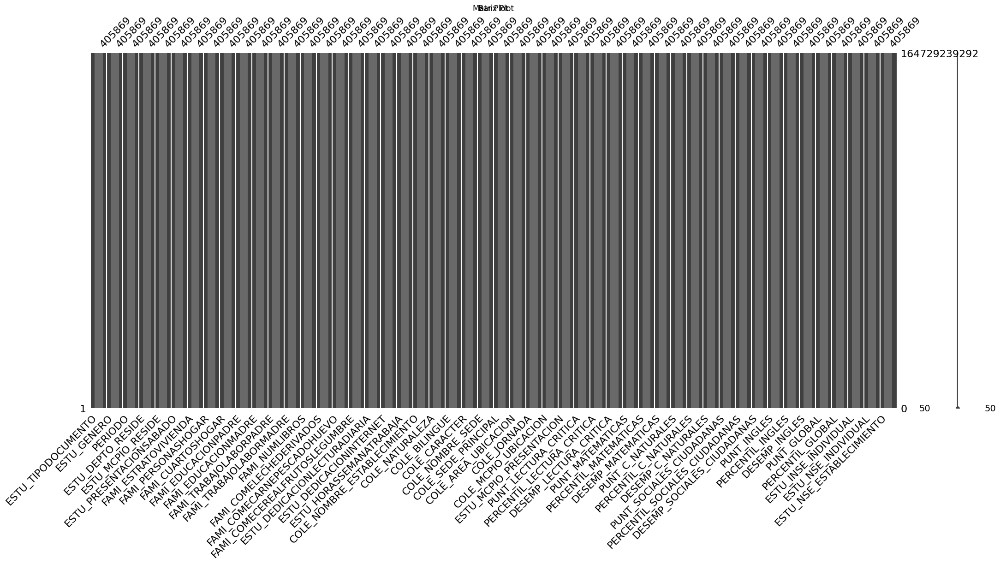

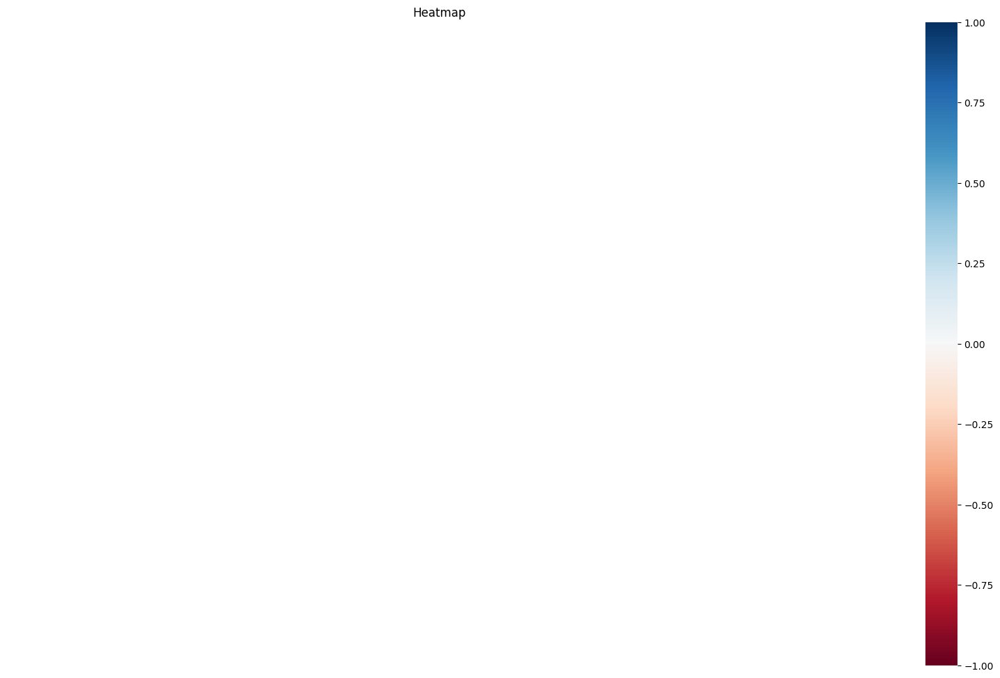

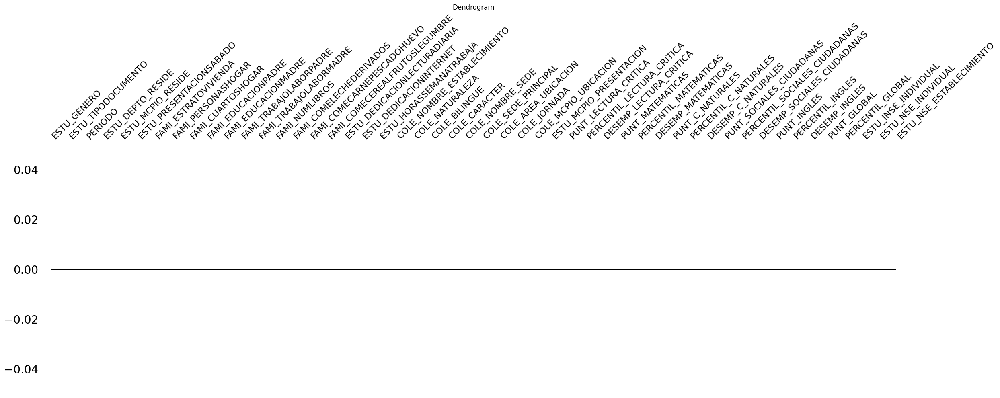

In [25]:
visualizar_nulos(df)

In [26]:
# graficos_multiples(df)

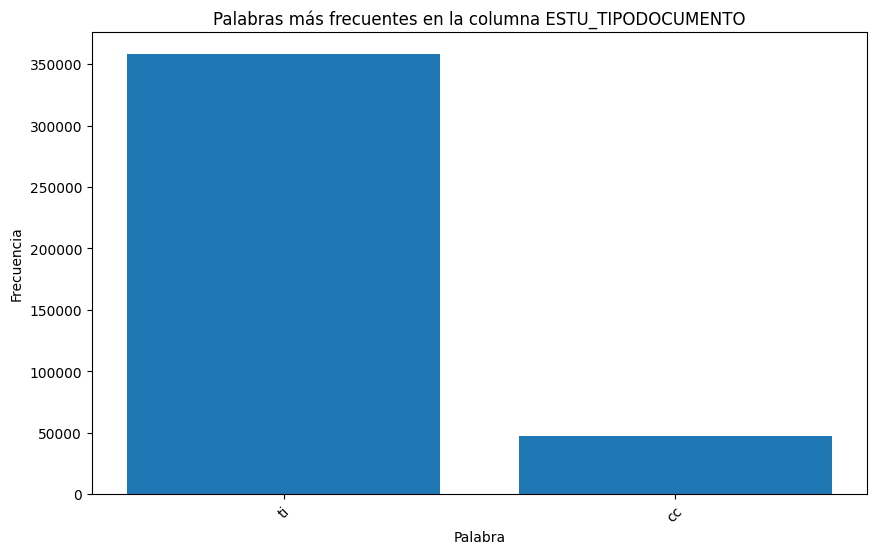

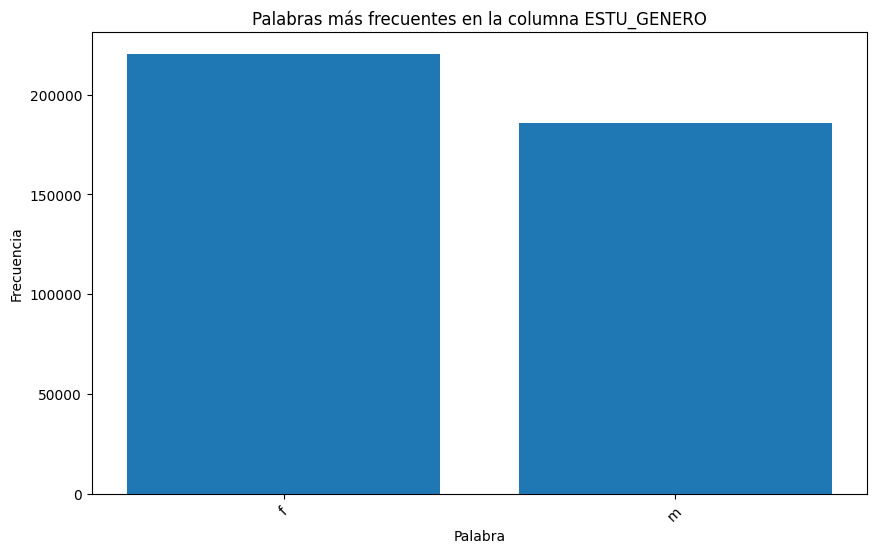

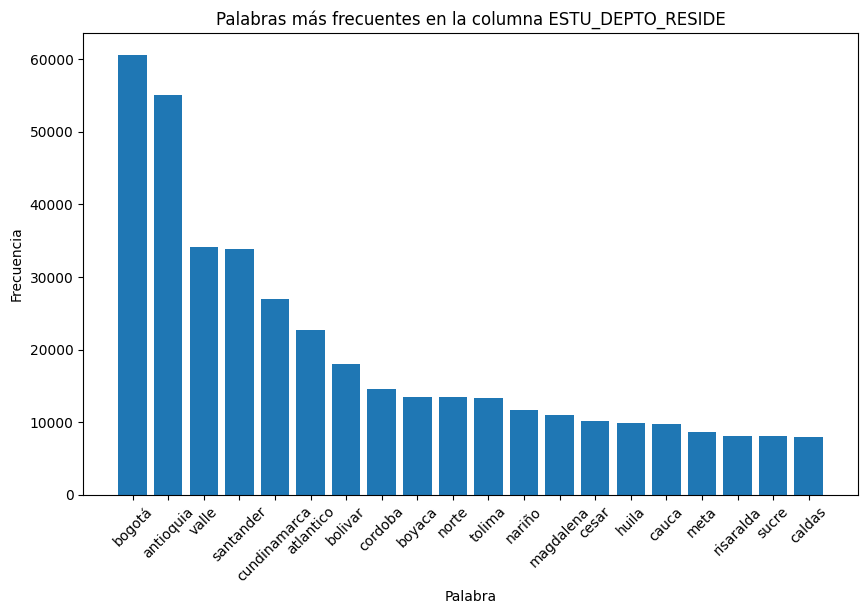

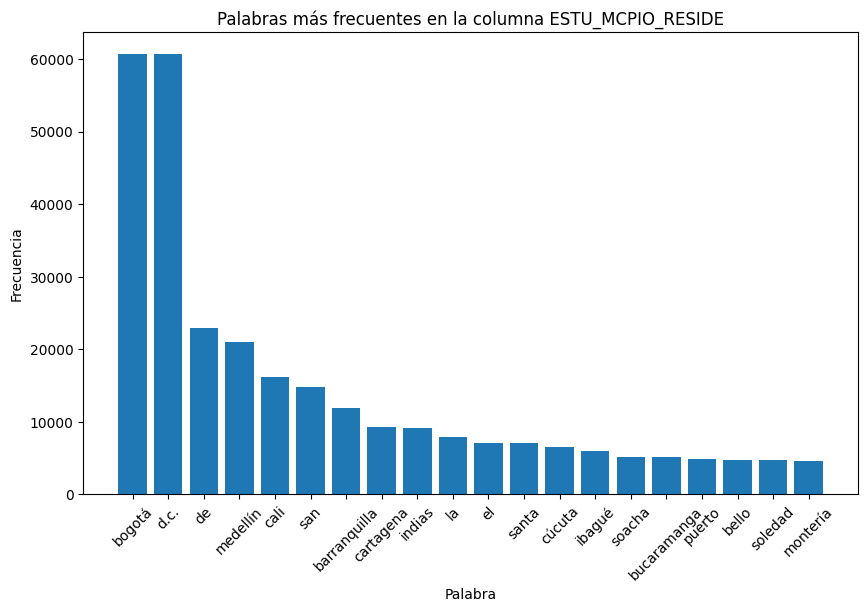

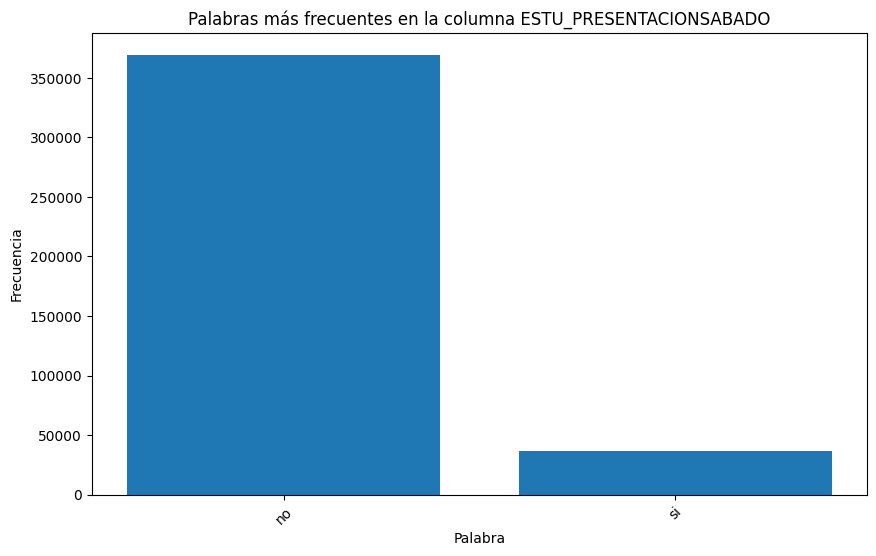

...

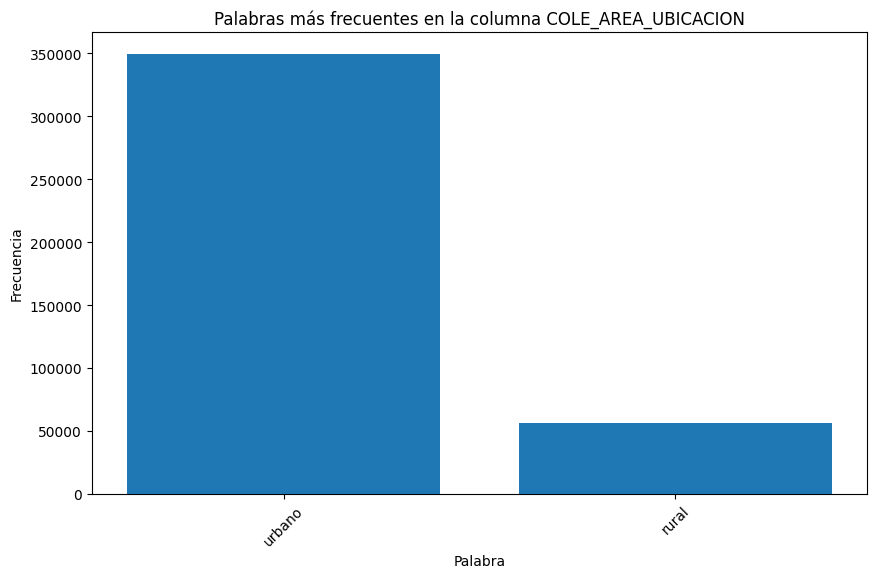

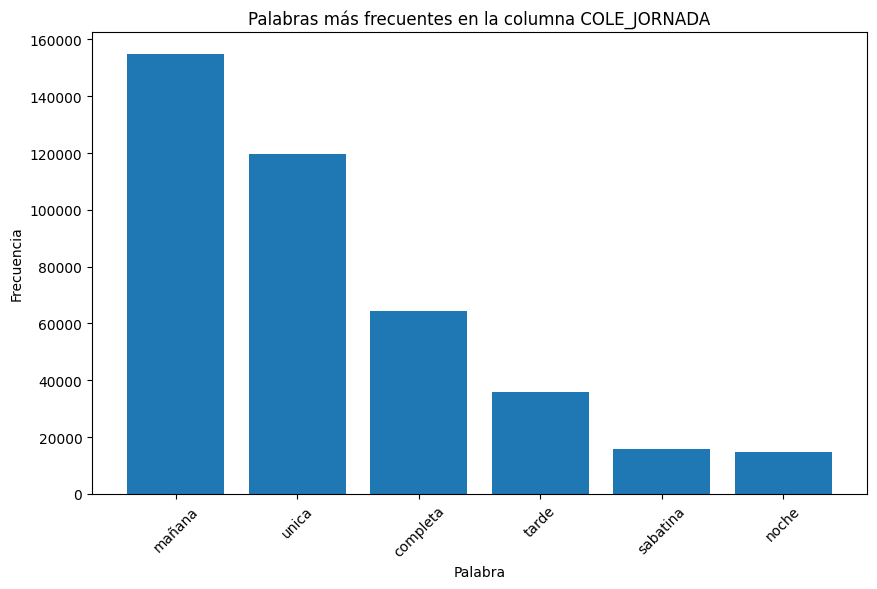

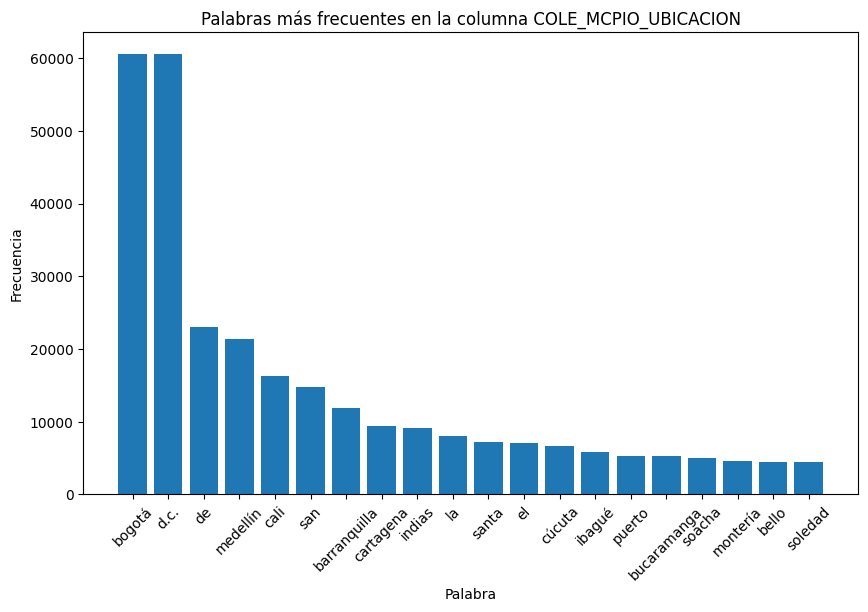

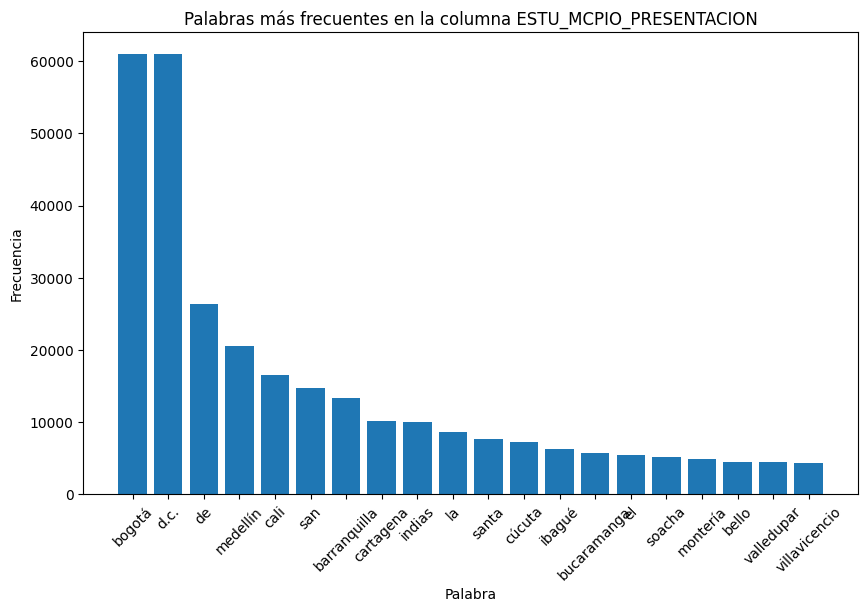

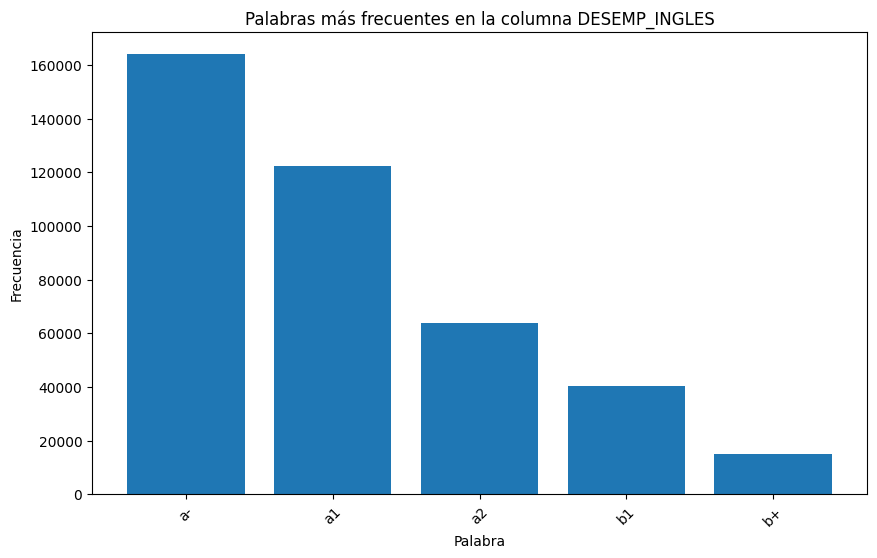

In [27]:
analisis_frecuencia_palabras(df)

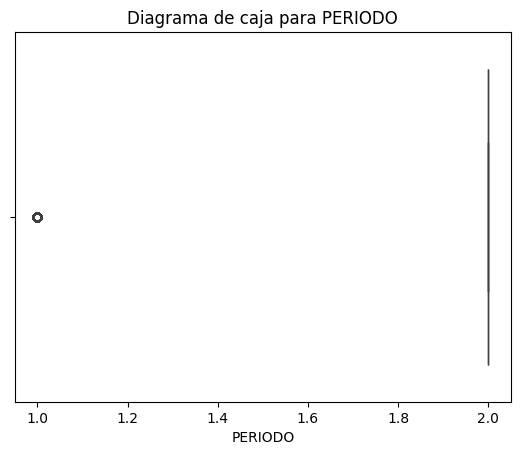

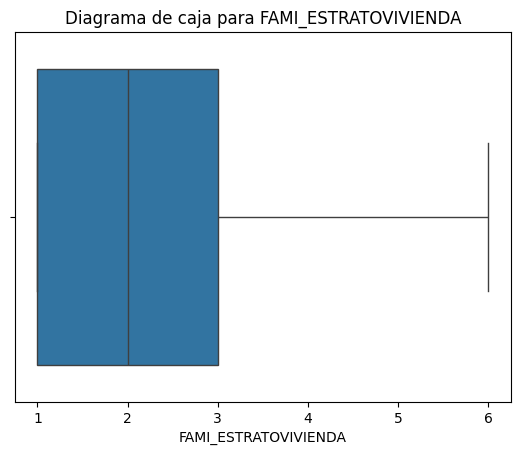

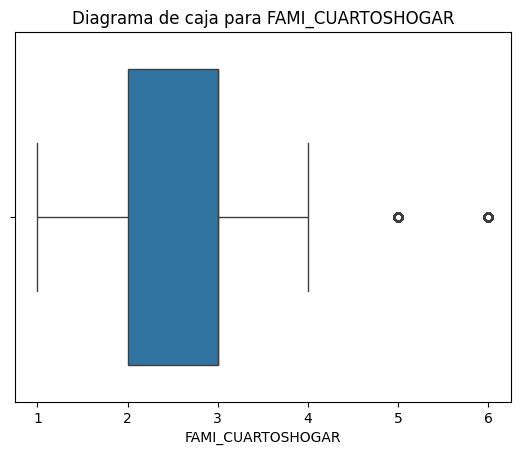

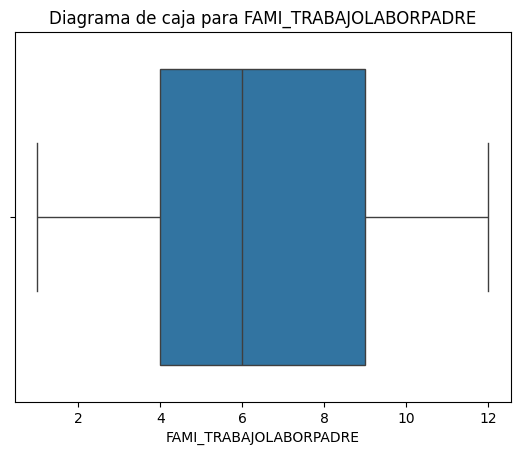

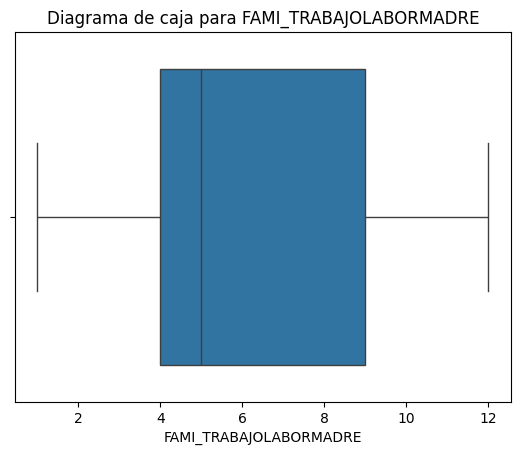

...

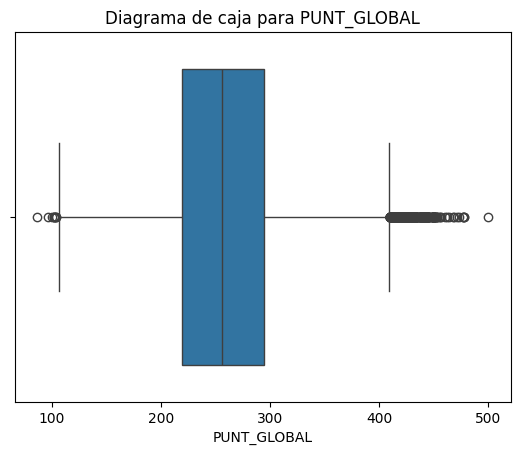

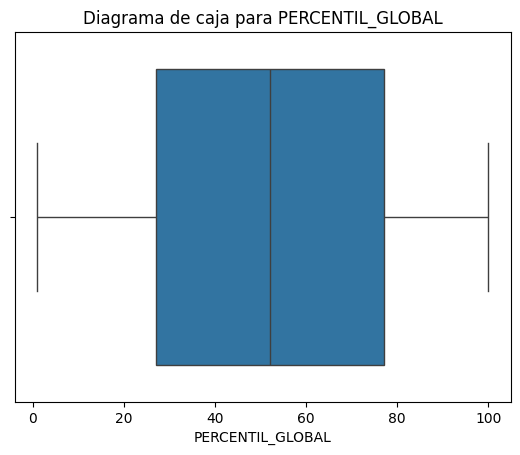

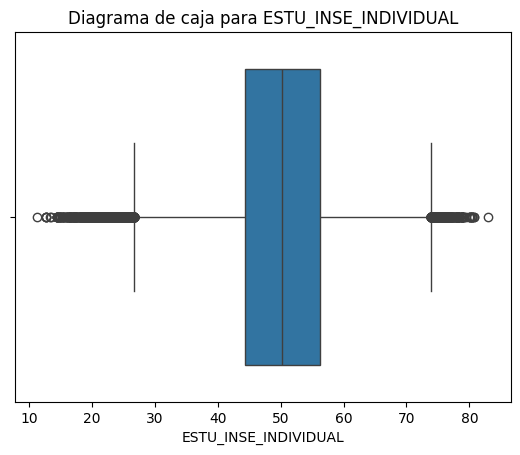

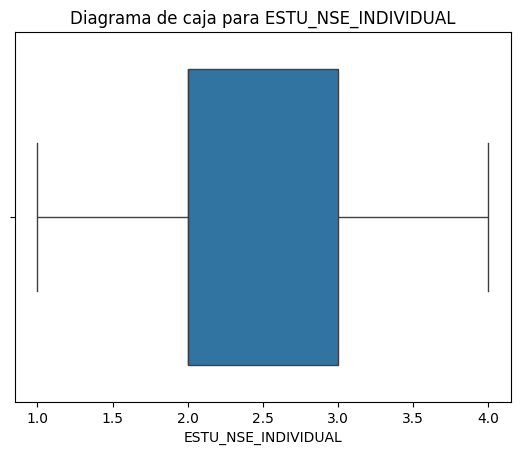

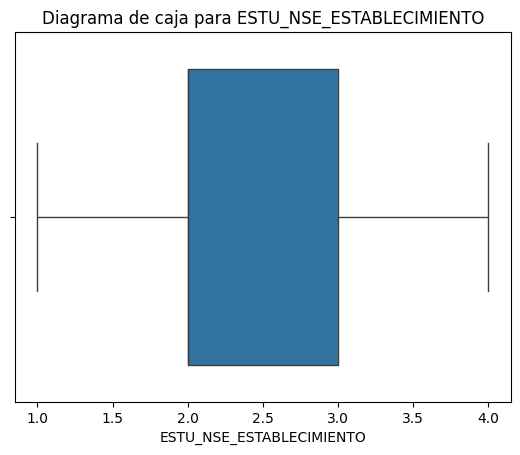

In [28]:
boxplots_numericas(df)

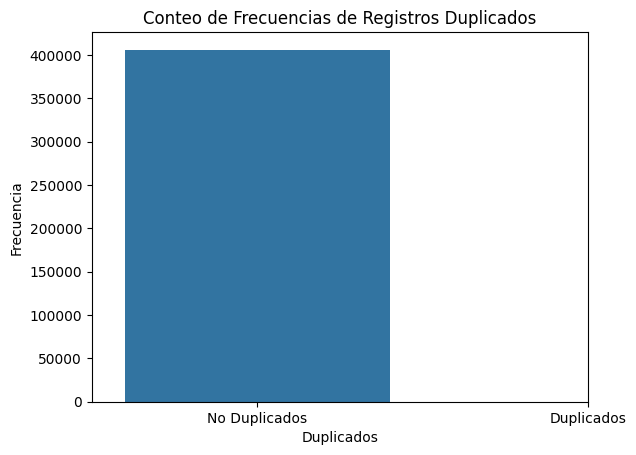

In [29]:
hist_duplicados(df)

## <h2 align= 'center'><u>Análisis Descriptivo</u></h2>

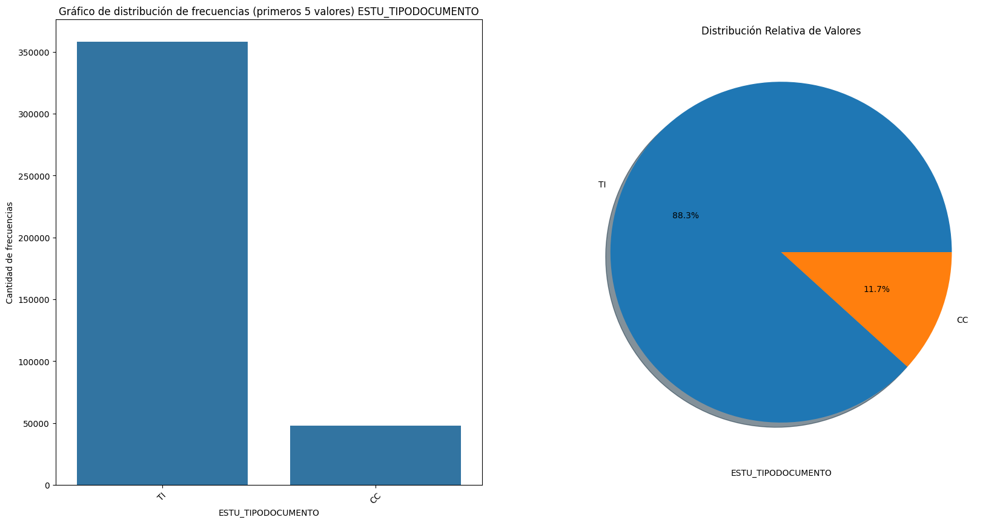



Estadísticas Básicas


count     405869
unique         2
top           TI
freq      358212
Name: ESTU_TIPODOCUMENTO, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




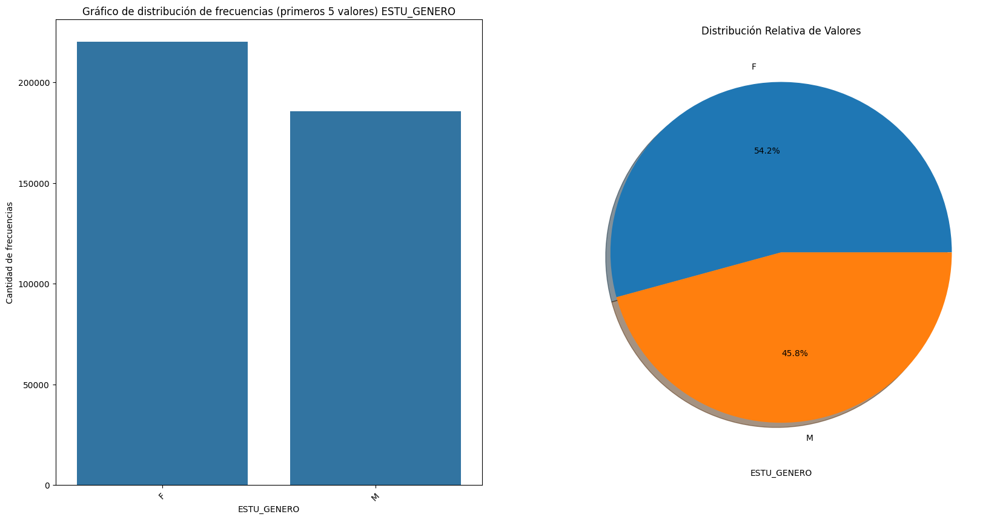



Estadísticas Básicas


count     405869
unique         2
top            F
freq      220145
Name: ESTU_GENERO, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




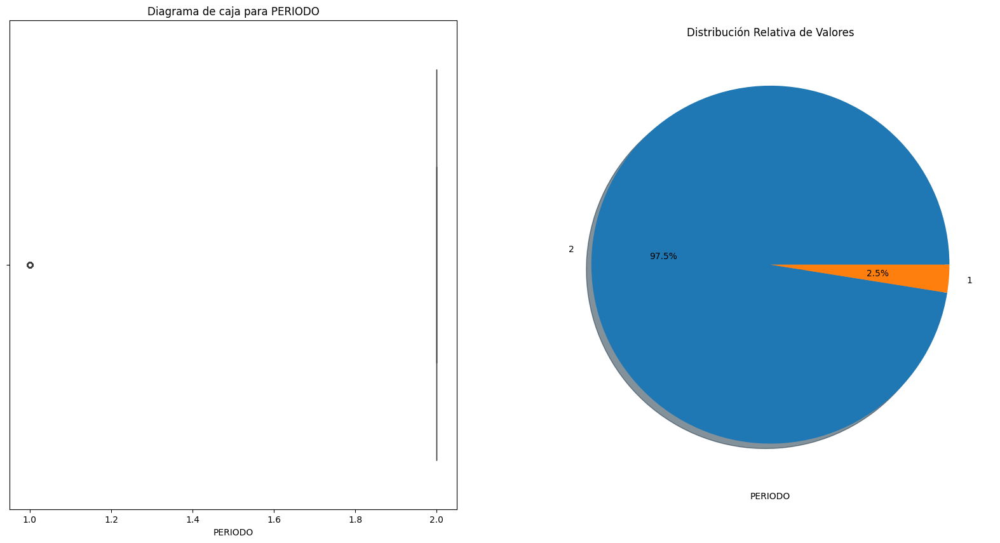



Estadísticas Básicas


count    405869.000000
mean          1.974864
std           0.156539
min           1.000000
25%           2.000000
50%           2.000000
75%           2.000000
max           2.000000
Name: PERIODO, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




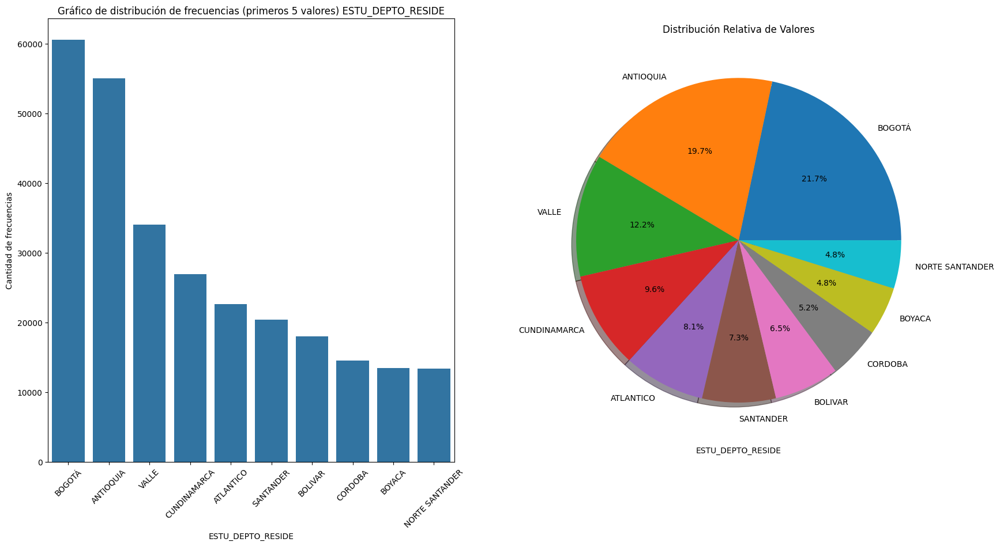



Estadísticas Básicas


count     405869
unique        34
top       BOGOTÁ
freq       60611
Name: ESTU_DEPTO_RESIDE, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




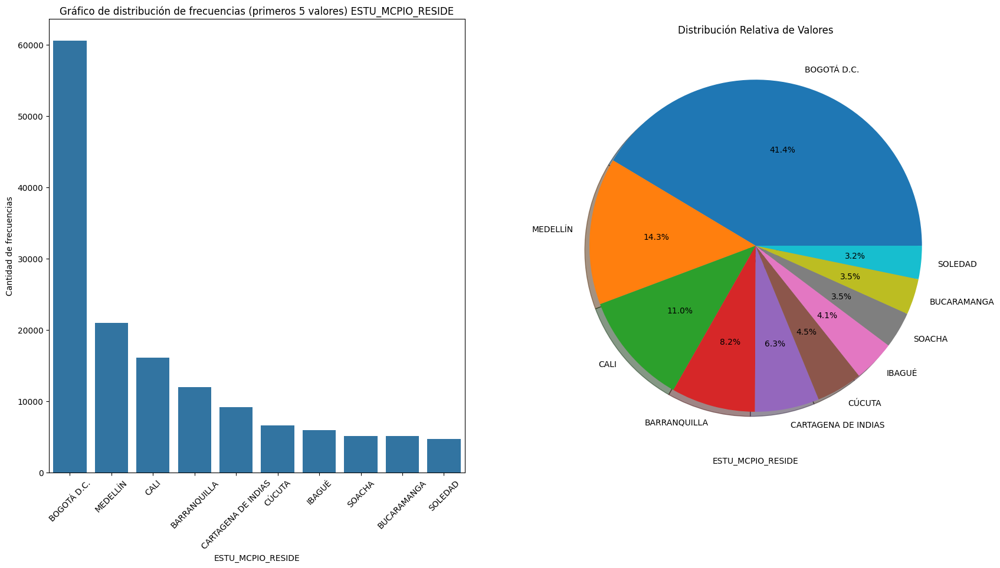



Estadísticas Básicas


count          405869
unique           1030
top       BOGOTÁ D.C.
freq            60611
Name: ESTU_MCPIO_RESIDE, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




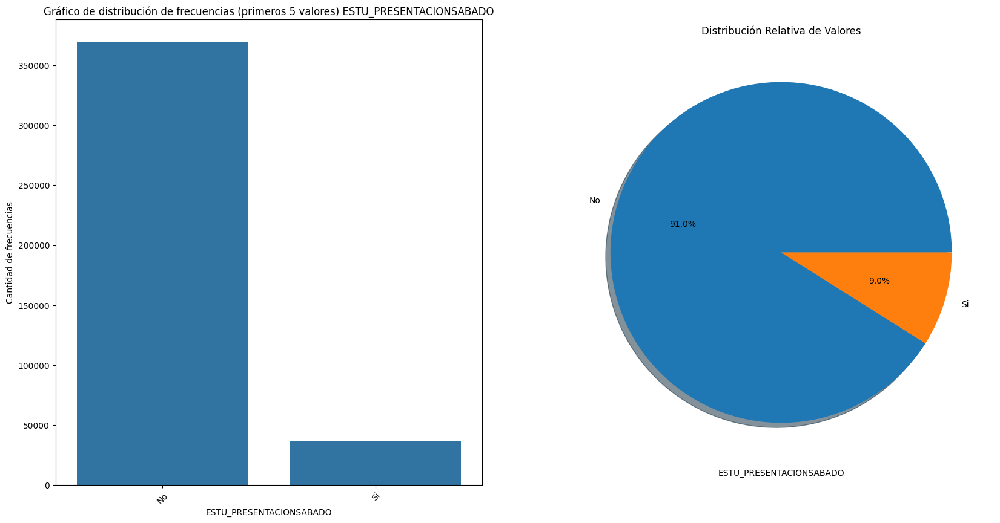



Estadísticas Básicas


count     405869
unique         2
top           No
freq      369501
Name: ESTU_PRESENTACIONSABADO, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




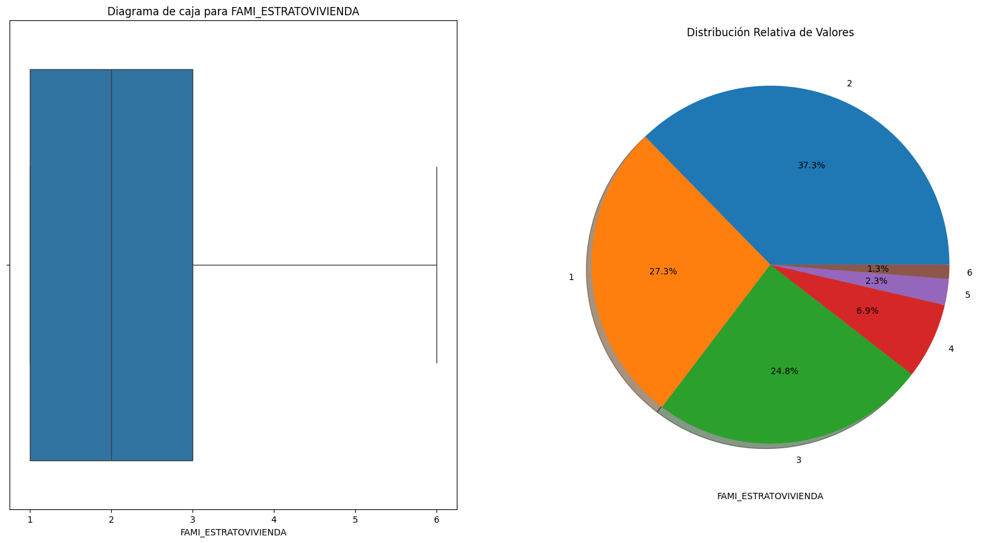



Estadísticas Básicas


count    405869.000000
mean          2.233970
std           1.076012
min           1.000000
25%           1.000000
50%           2.000000
75%           3.000000
max           6.000000
Name: FAMI_ESTRATOVIVIENDA, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




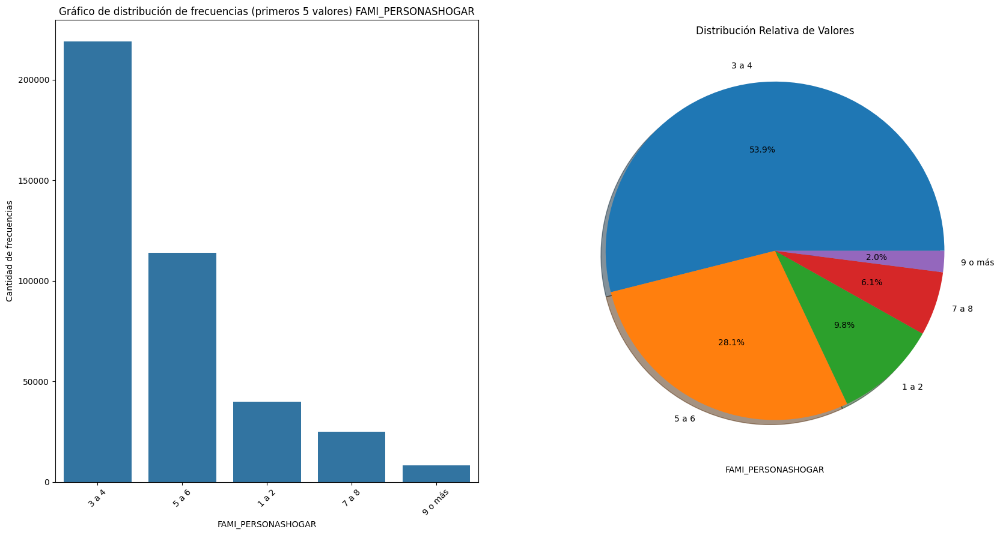



Estadísticas Básicas


count     405869
unique         5
top        3 a 4
freq      218908
Name: FAMI_PERSONASHOGAR, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




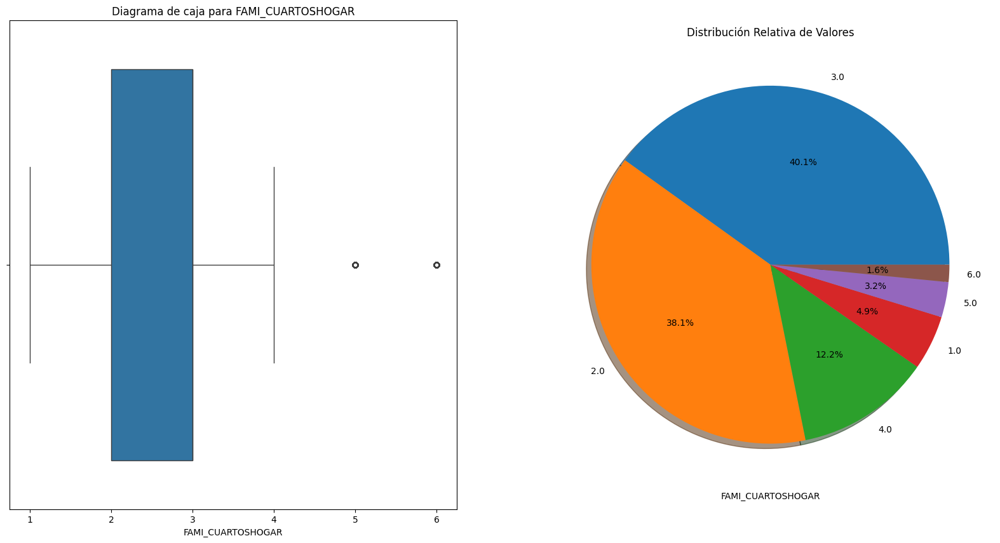



Estadísticas Básicas


count    405869.000000
mean          2.752634
std           0.951952
min           1.000000
25%           2.000000
50%           3.000000
75%           3.000000
max           6.000000
Name: FAMI_CUARTOSHOGAR, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




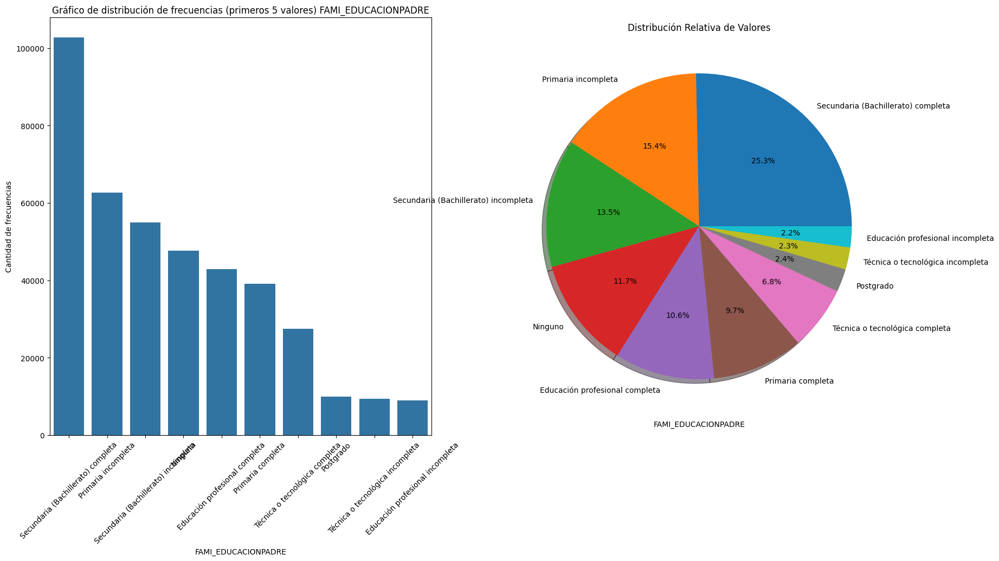



Estadísticas Básicas


count                                 405869
unique                                    10
top       Secundaria (Bachillerato) completa
freq                                  102776
Name: FAMI_EDUCACIONPADRE, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




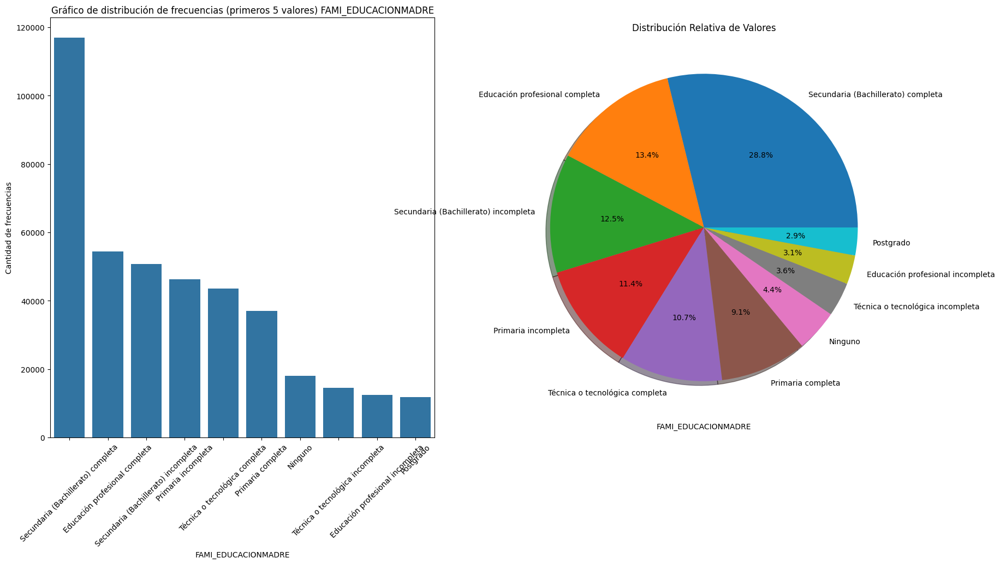



Estadísticas Básicas


count                                 405869
unique                                    10
top       Secundaria (Bachillerato) completa
freq                                  117029
Name: FAMI_EDUCACIONMADRE, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




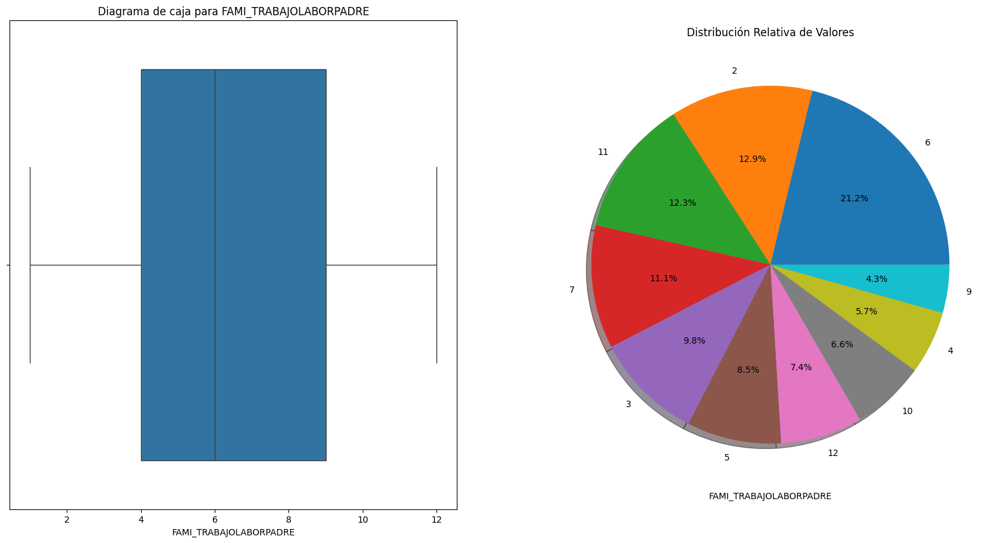



Estadísticas Básicas


count    405869.000000
mean          6.431220
std           3.259646
min           1.000000
25%           4.000000
50%           6.000000
75%           9.000000
max          12.000000
Name: FAMI_TRABAJOLABORPADRE, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




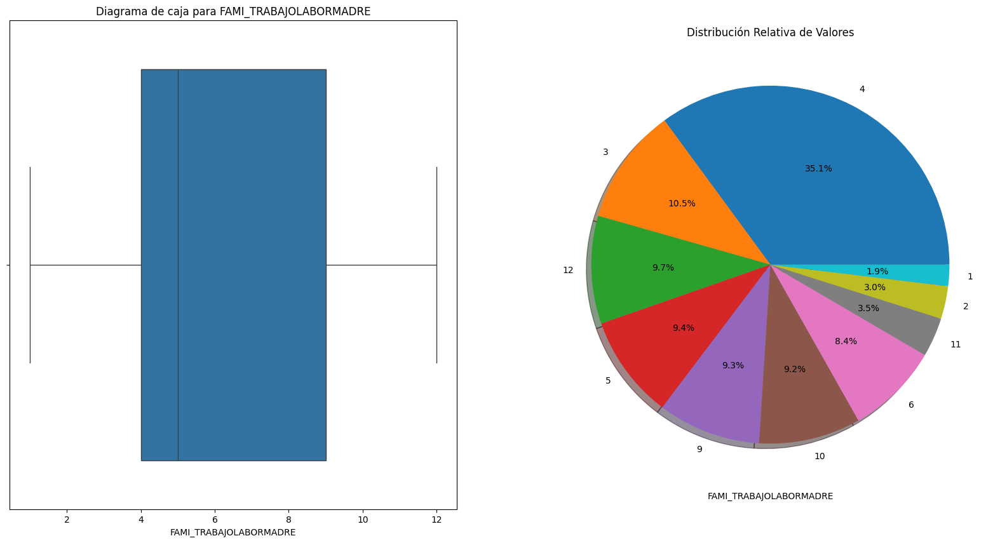



Estadísticas Básicas


count    405869.000000
mean          6.107542
std           3.150086
min           1.000000
25%           4.000000
50%           5.000000
75%           9.000000
max          12.000000
Name: FAMI_TRABAJOLABORMADRE, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




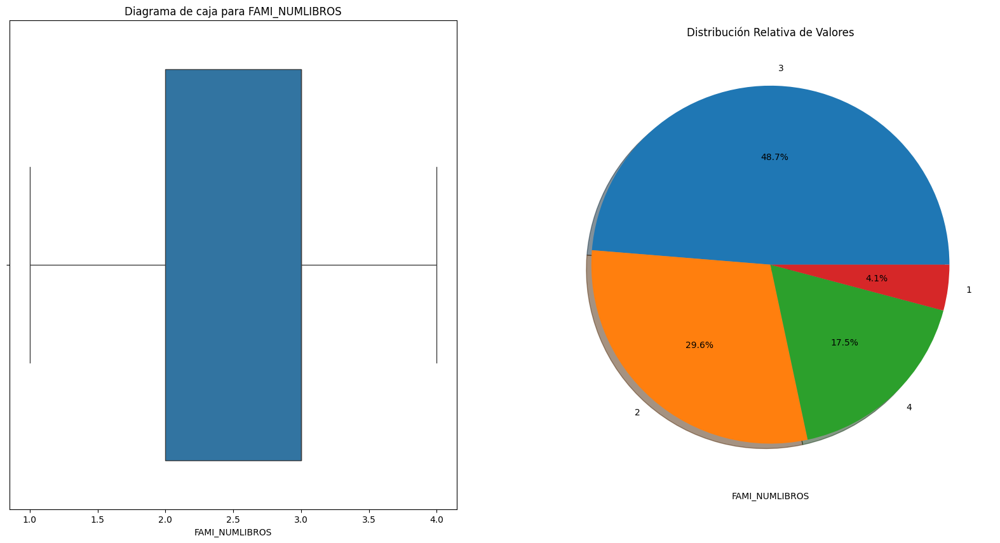



Estadísticas Básicas


count    405869.000000
mean          2.796420
std           0.771558
min           1.000000
25%           2.000000
50%           3.000000
75%           3.000000
max           4.000000
Name: FAMI_NUMLIBROS, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




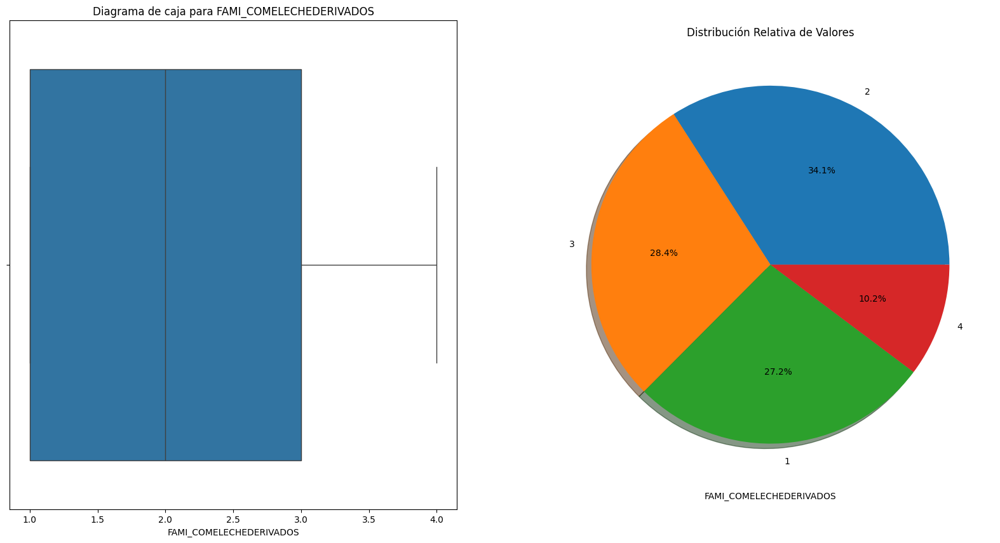



Estadísticas Básicas


count    405869.000000
mean          2.217176
std           0.958780
min           1.000000
25%           1.000000
50%           2.000000
75%           3.000000
max           4.000000
Name: FAMI_COMELECHEDERIVADOS, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




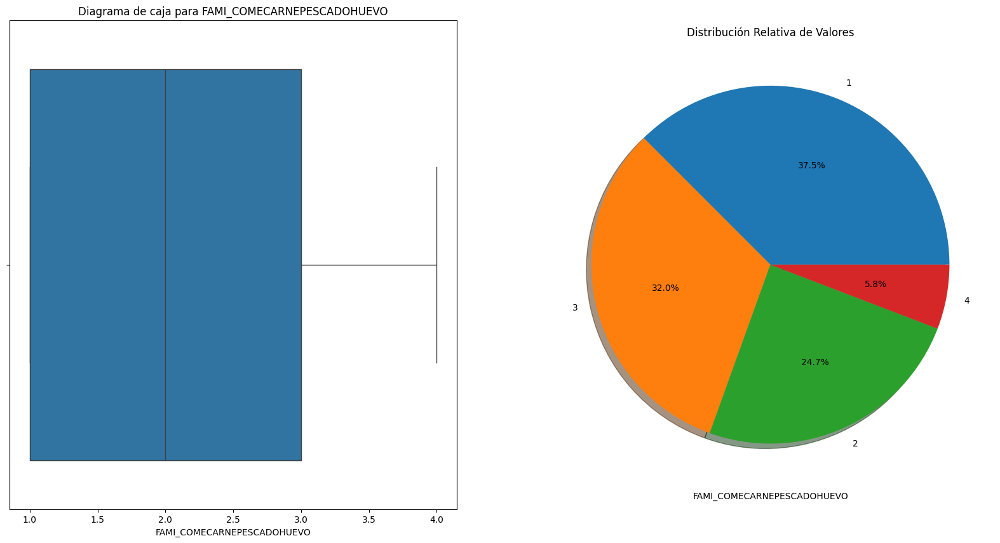



Estadísticas Básicas


count    405869.000000
mean          2.061480
std           0.961235
min           1.000000
25%           1.000000
50%           2.000000
75%           3.000000
max           4.000000
Name: FAMI_COMECARNEPESCADOHUEVO, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




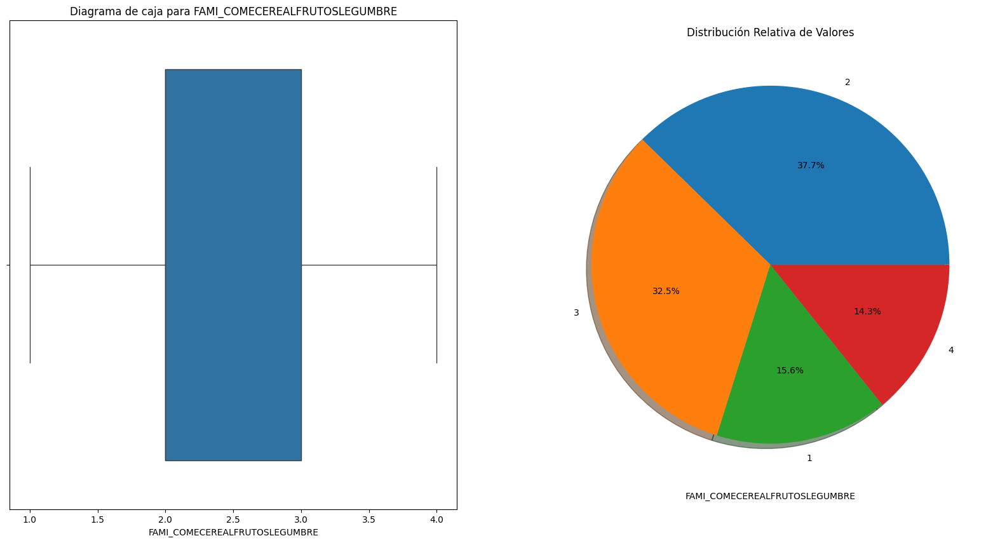



Estadísticas Básicas


count    405869.000000
mean          2.454775
std           0.918982
min           1.000000
25%           2.000000
50%           2.000000
75%           3.000000
max           4.000000
Name: FAMI_COMECEREALFRUTOSLEGUMBRE, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




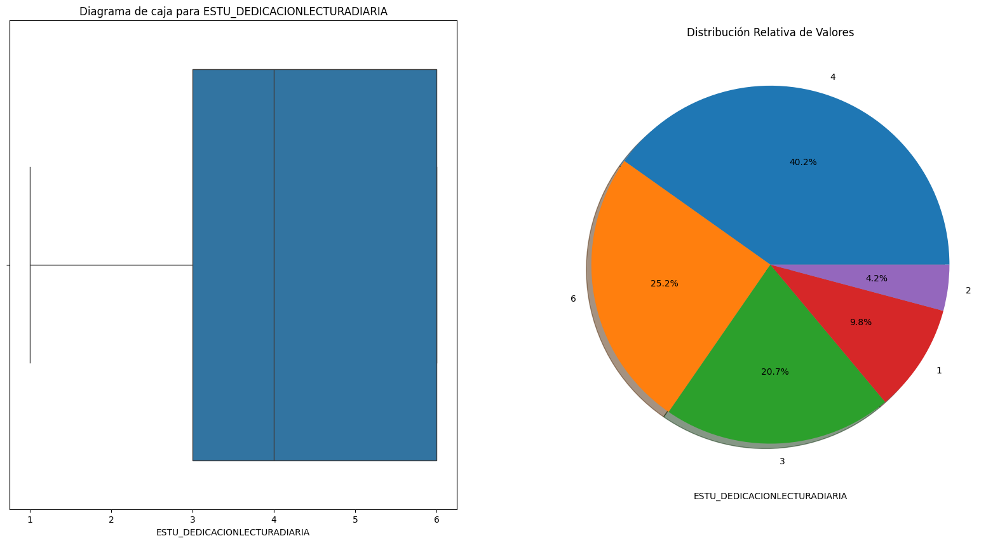



Estadísticas Básicas


count    405869.000000
mean          3.921120
std           1.501591
min           1.000000
25%           3.000000
50%           4.000000
75%           6.000000
max           6.000000
Name: ESTU_DEDICACIONLECTURADIARIA, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




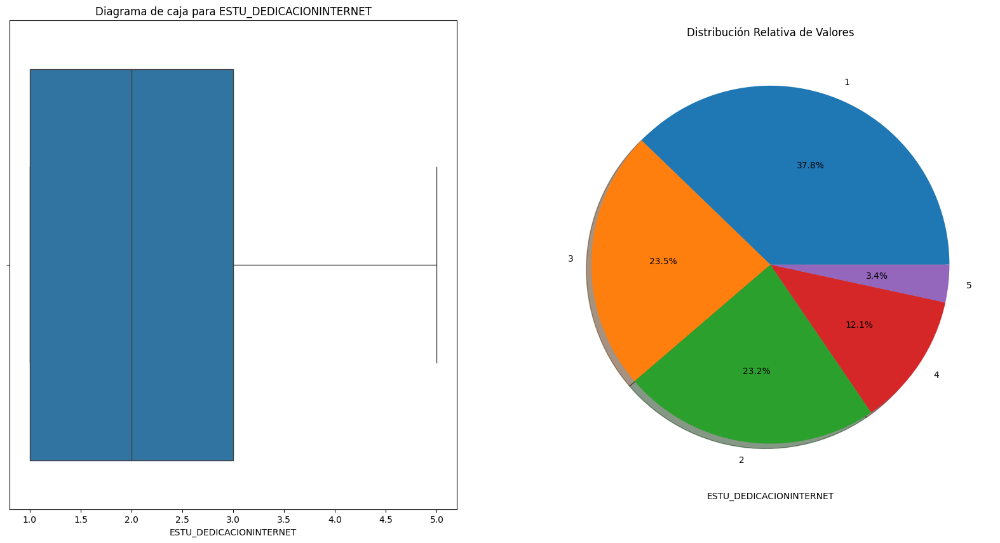



Estadísticas Básicas


count    405869.000000
mean          2.200683
std           1.166715
min           1.000000
25%           1.000000
50%           2.000000
75%           3.000000
max           5.000000
Name: ESTU_DEDICACIONINTERNET, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




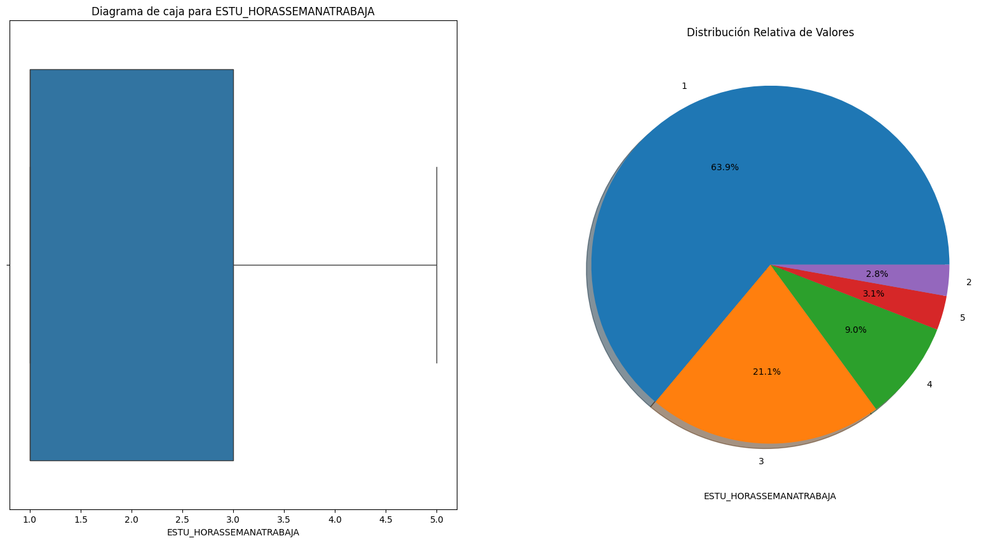



Estadísticas Básicas


count    405869.000000
mean          1.846009
std           1.211209
min           1.000000
25%           1.000000
50%           1.000000
75%           3.000000
max           5.000000
Name: ESTU_HORASSEMANATRABAJA, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




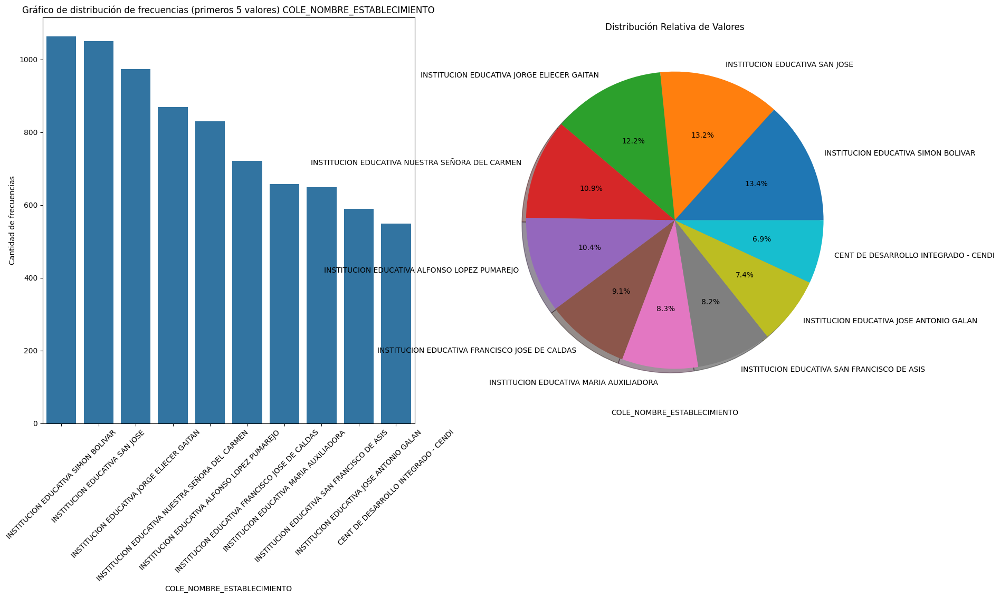



Estadísticas Básicas


count                                  405869
unique                                   7020
top       INSTITUCION EDUCATIVA SIMON BOLIVAR
freq                                     1063
Name: COLE_NOMBRE_ESTABLECIMIENTO, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




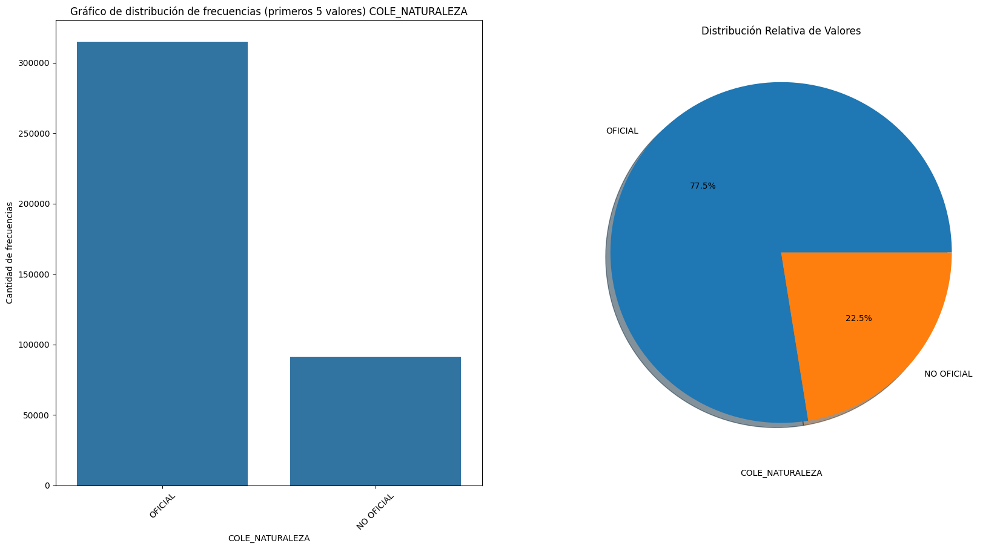



Estadísticas Básicas


count      405869
unique          2
top       OFICIAL
freq       314717
Name: COLE_NATURALEZA, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




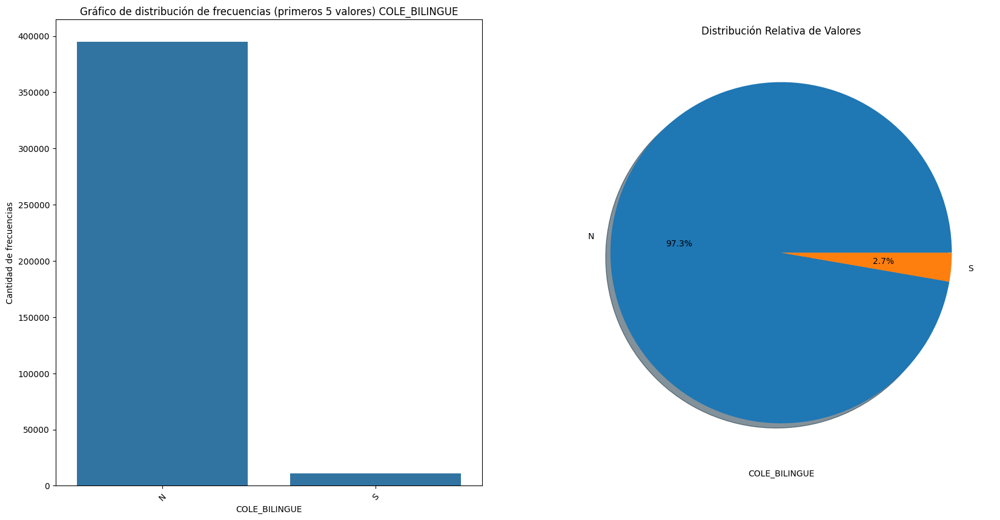



Estadísticas Básicas


count     405869
unique         2
top            N
freq      394840
Name: COLE_BILINGUE, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




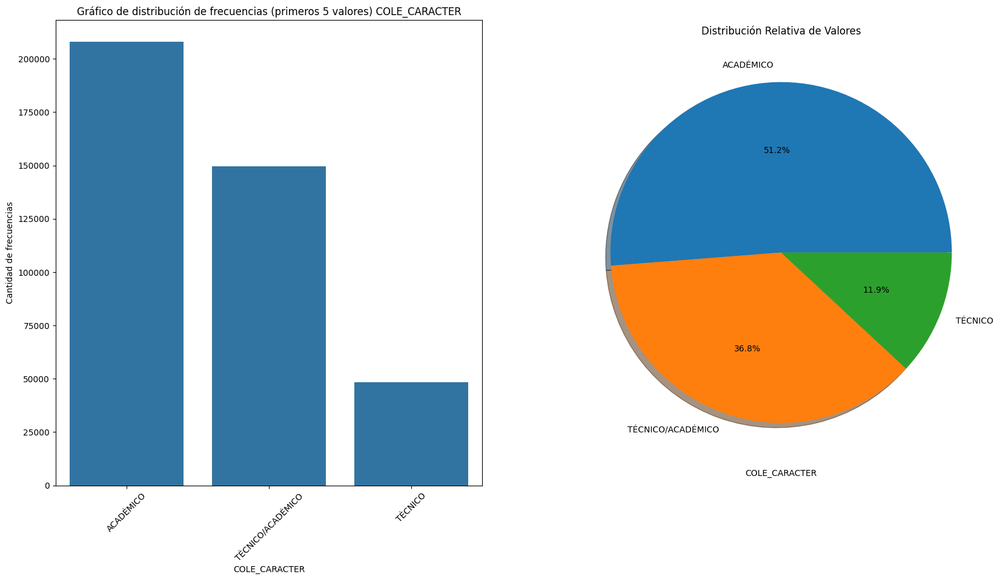



Estadísticas Básicas


count        405869
unique            3
top       ACADÉMICO
freq         207936
Name: COLE_CARACTER, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




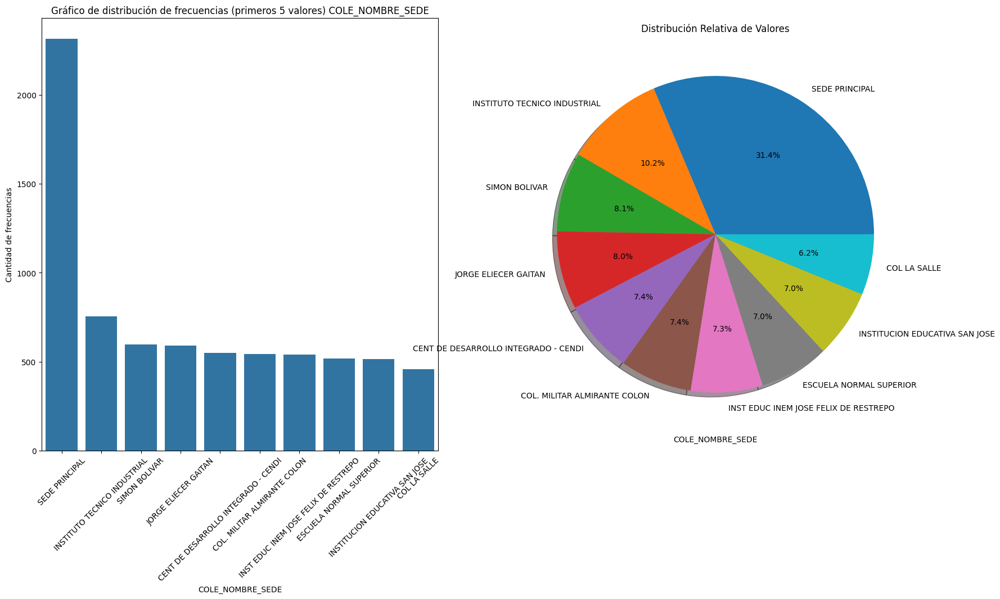



Estadísticas Básicas


count             405869
unique              7913
top       SEDE PRINCIPAL
freq                2316
Name: COLE_NOMBRE_SEDE, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




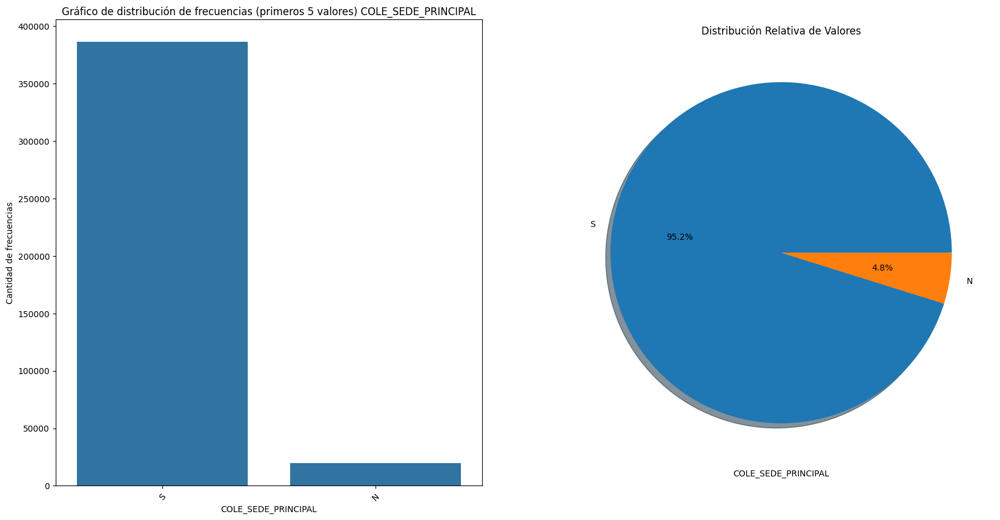



Estadísticas Básicas


count     405869
unique         2
top            S
freq      386285
Name: COLE_SEDE_PRINCIPAL, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




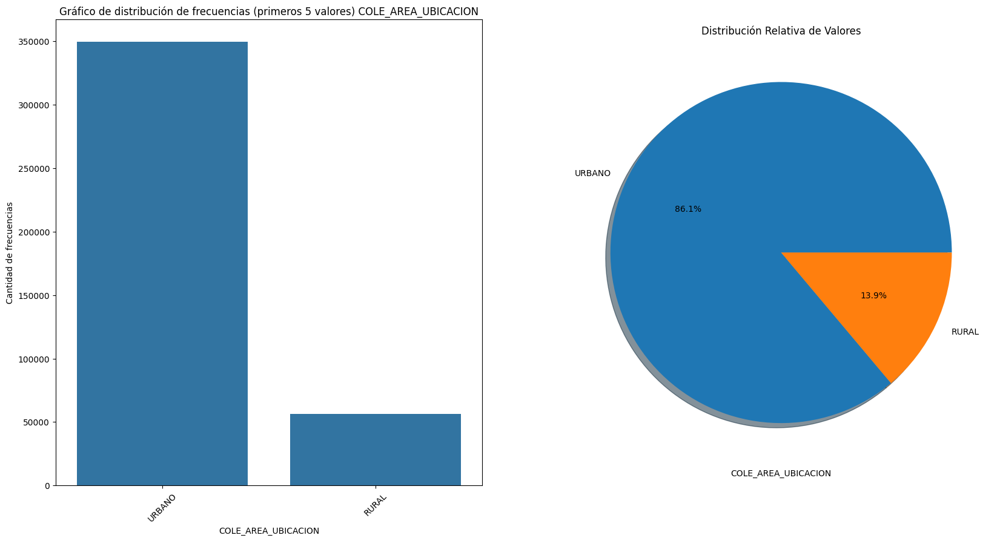



Estadísticas Básicas


count     405869
unique         2
top       URBANO
freq      349547
Name: COLE_AREA_UBICACION, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




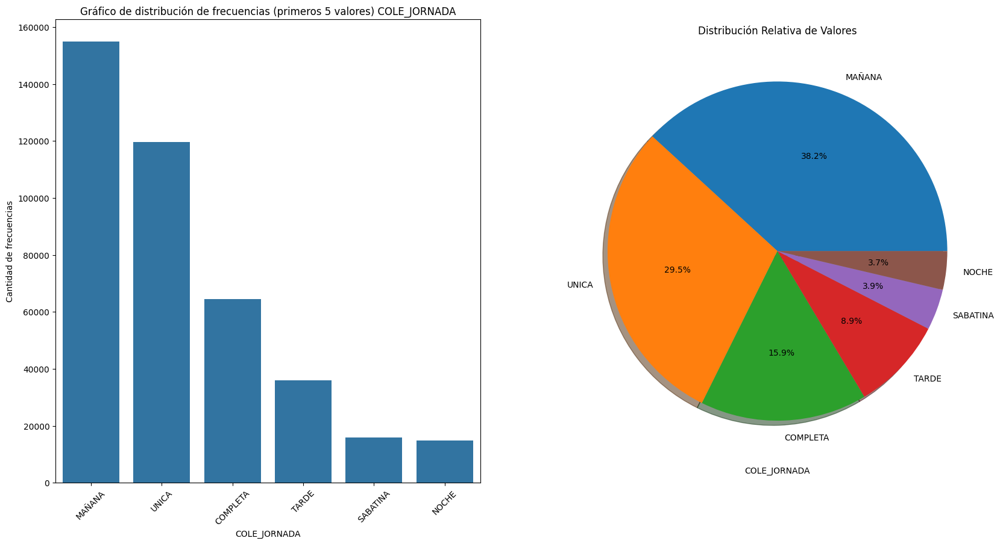



Estadísticas Básicas


count     405869
unique         6
top       MAÑANA
freq      154940
Name: COLE_JORNADA, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




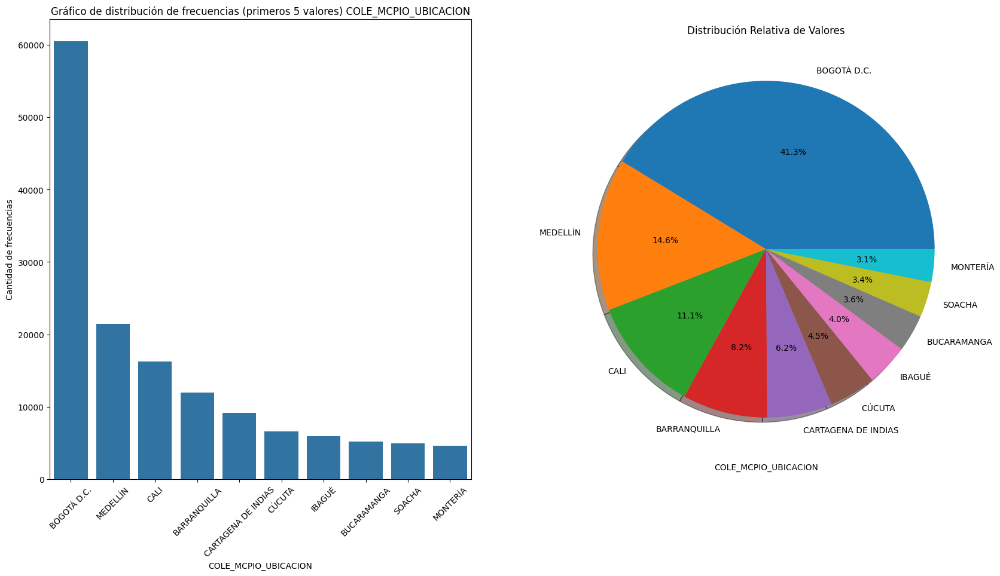



Estadísticas Básicas


count          405869
unique           1021
top       BOGOTÁ D.C.
freq            60505
Name: COLE_MCPIO_UBICACION, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




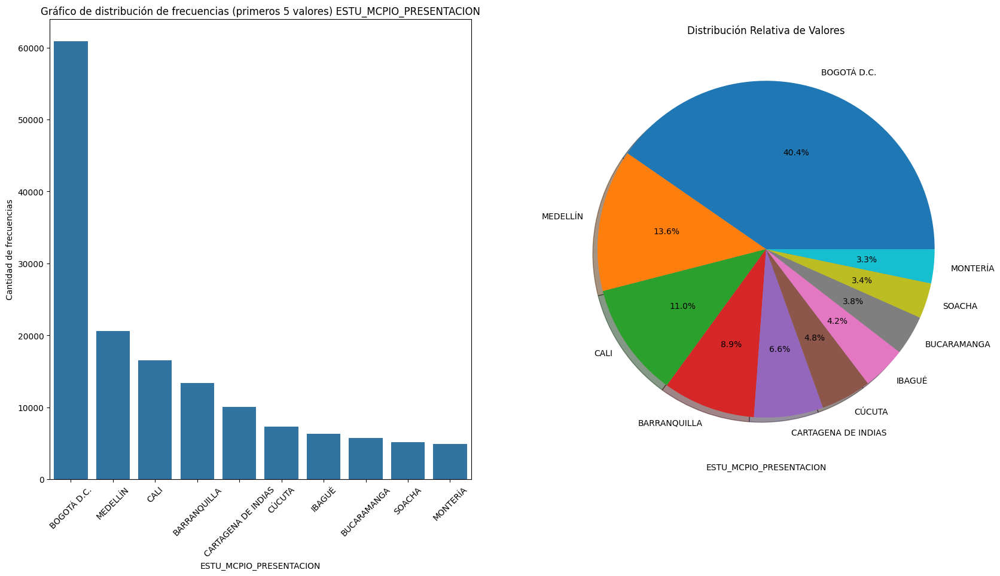



Estadísticas Básicas


count          405869
unique            503
top       BOGOTÁ D.C.
freq            60902
Name: ESTU_MCPIO_PRESENTACION, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




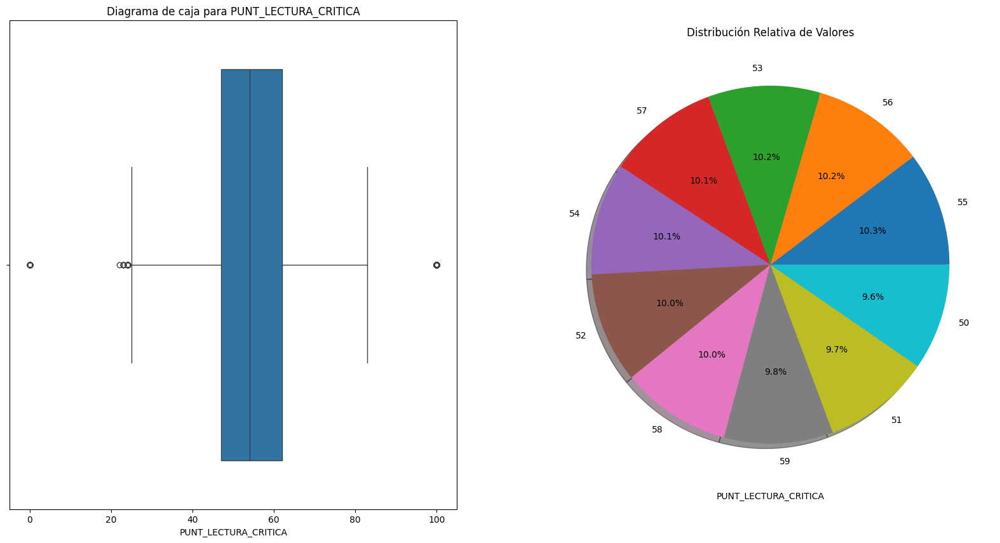



Estadísticas Básicas


count    405869.000000
mean         54.068586
std          10.427905
min           0.000000
25%          47.000000
50%          54.000000
75%          62.000000
max         100.000000
Name: PUNT_LECTURA_CRITICA, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




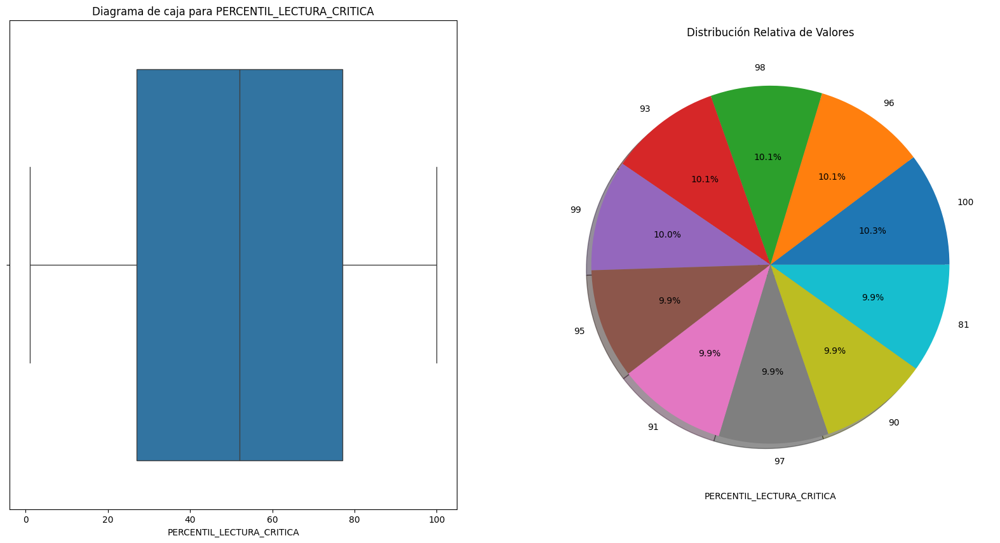



Estadísticas Básicas


count    405869.000000
mean         51.705644
std          28.769378
min           1.000000
25%          27.000000
50%          52.000000
75%          77.000000
max         100.000000
Name: PERCENTIL_LECTURA_CRITICA, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




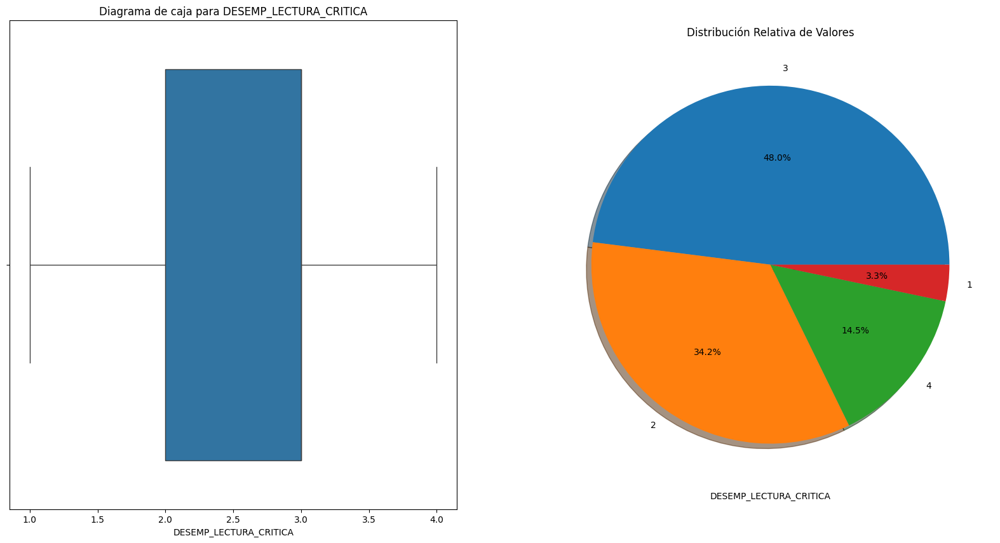



Estadísticas Básicas


count    405869.000000
mean          2.736565
std           0.741048
min           1.000000
25%           2.000000
50%           3.000000
75%           3.000000
max           4.000000
Name: DESEMP_LECTURA_CRITICA, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




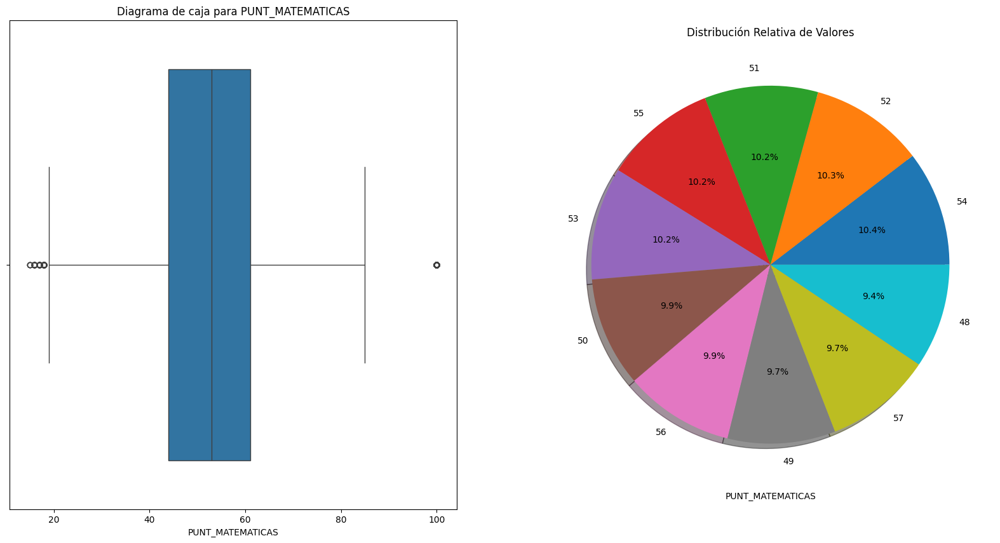



Estadísticas Básicas


count    405869.000000
mean         52.545691
std          12.404004
min          15.000000
25%          44.000000
50%          53.000000
75%          61.000000
max         100.000000
Name: PUNT_MATEMATICAS, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




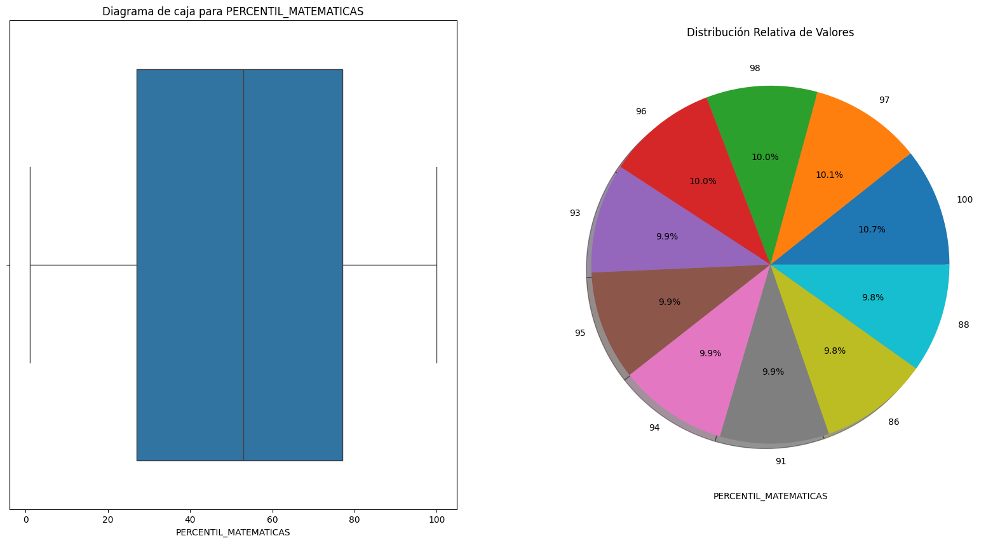



Estadísticas Básicas


count    405869.000000
mean         51.946236
std          28.763115
min           1.000000
25%          27.000000
50%          53.000000
75%          77.000000
max         100.000000
Name: PERCENTIL_MATEMATICAS, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




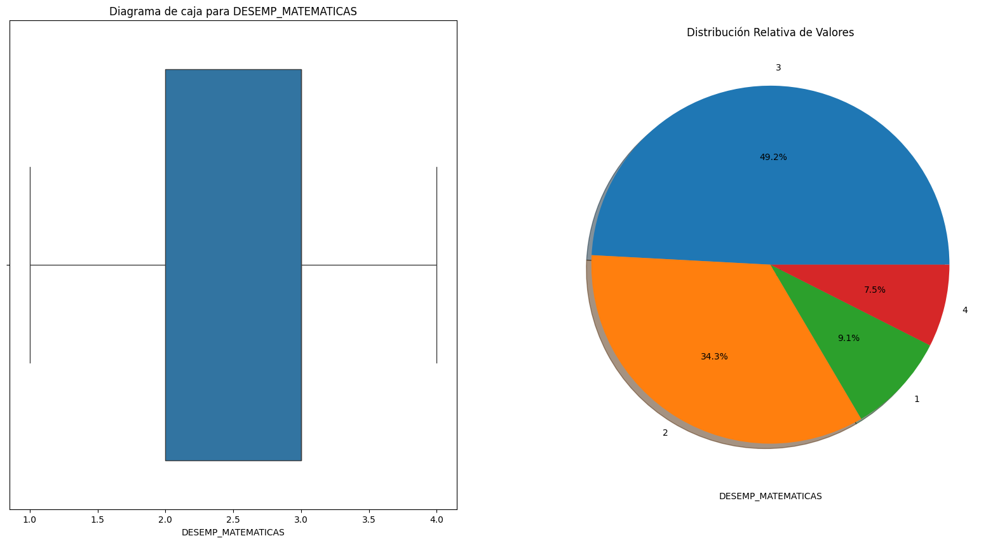



Estadísticas Básicas


count    405869.000000
mean          2.549828
std           0.760302
min           1.000000
25%           2.000000
50%           3.000000
75%           3.000000
max           4.000000
Name: DESEMP_MATEMATICAS, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




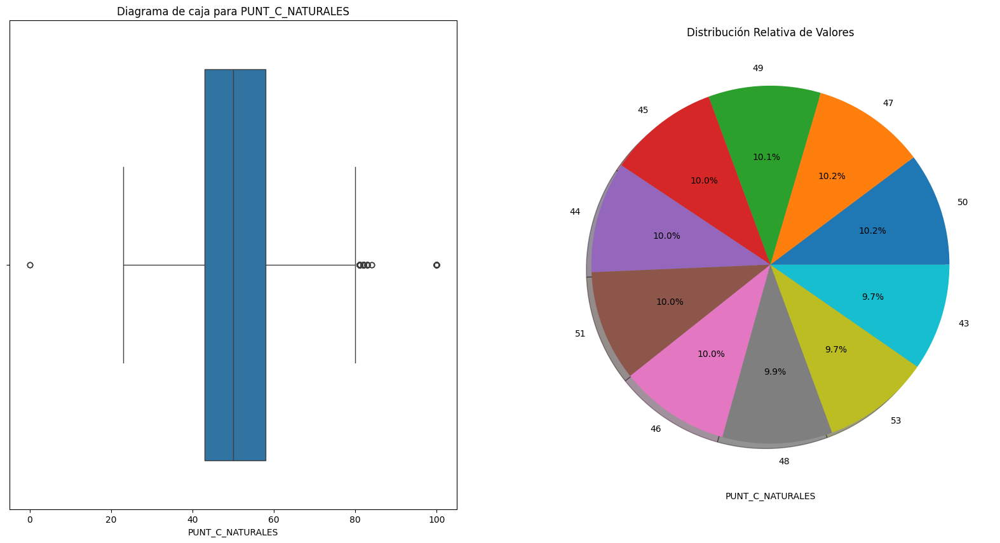



Estadísticas Básicas


count    405869.000000
mean         50.768206
std          10.557262
min           0.000000
25%          43.000000
50%          50.000000
75%          58.000000
max         100.000000
Name: PUNT_C_NATURALES, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




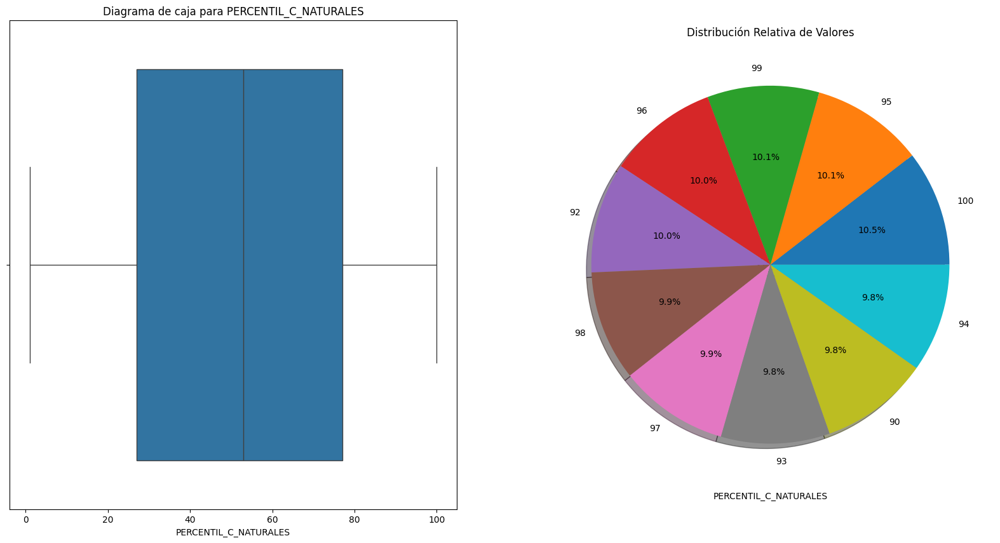



Estadísticas Básicas


count    405869.000000
mean         51.854379
std          28.799393
min           1.000000
25%          27.000000
50%          53.000000
75%          77.000000
max         100.000000
Name: PERCENTIL_C_NATURALES, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




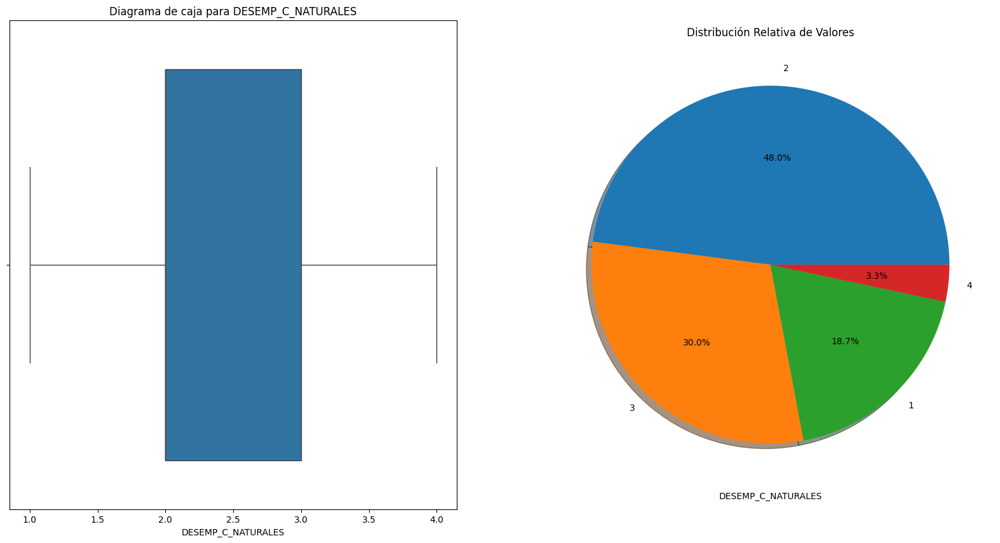



Estadísticas Básicas


count    405869.000000
mean          2.179765
std           0.766806
min           1.000000
25%           2.000000
50%           2.000000
75%           3.000000
max           4.000000
Name: DESEMP_C_NATURALES, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




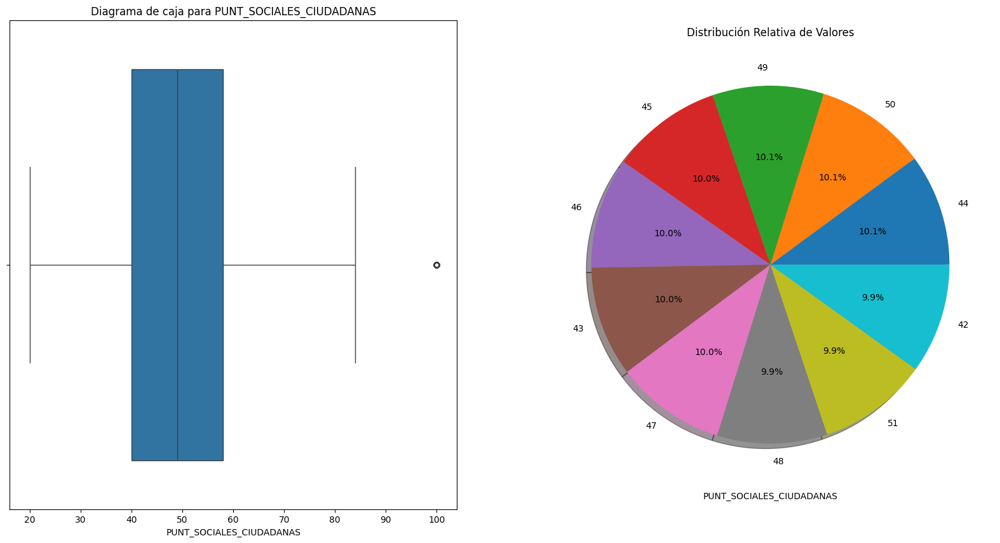



Estadísticas Básicas


count    405869.000000
mean         49.469309
std          11.939110
min          20.000000
25%          40.000000
50%          49.000000
75%          58.000000
max         100.000000
Name: PUNT_SOCIALES_CIUDADANAS, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




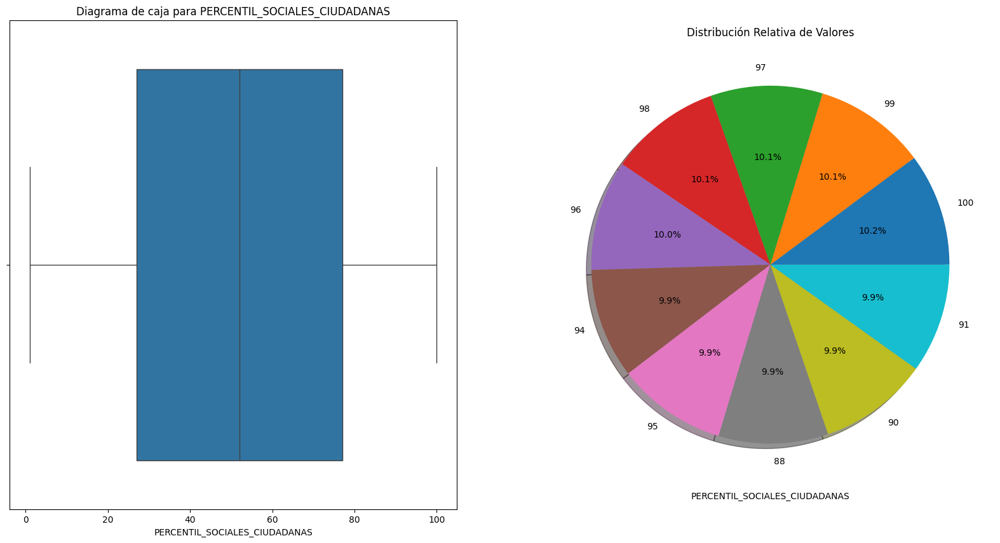



Estadísticas Básicas


count    405869.000000
mean         51.715829
std          28.839141
min           1.000000
25%          27.000000
50%          52.000000
75%          77.000000
max         100.000000
Name: PERCENTIL_SOCIALES_CIUDADANAS, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




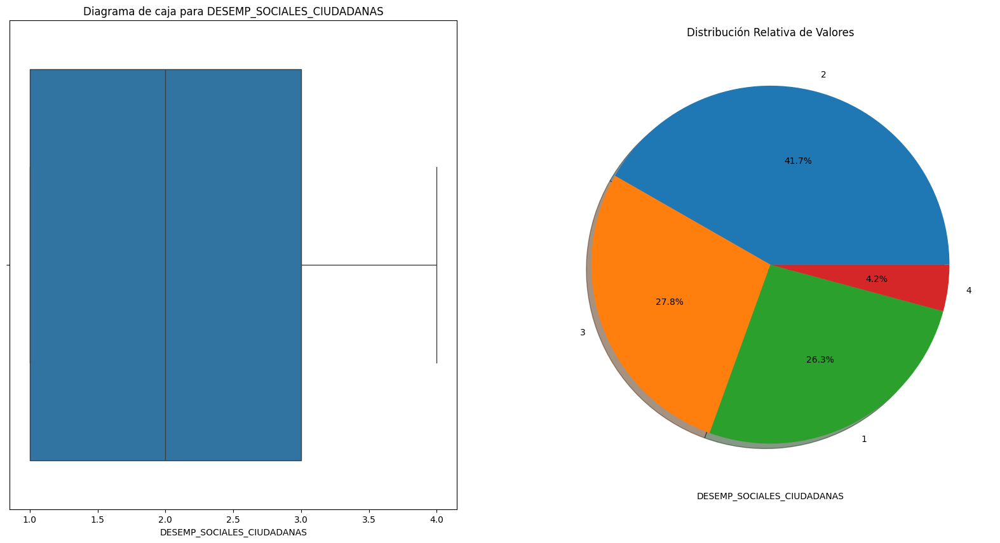



Estadísticas Básicas


count    405869.000000
mean          2.098167
std           0.835927
min           1.000000
25%           1.000000
50%           2.000000
75%           3.000000
max           4.000000
Name: DESEMP_SOCIALES_CIUDADANAS, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




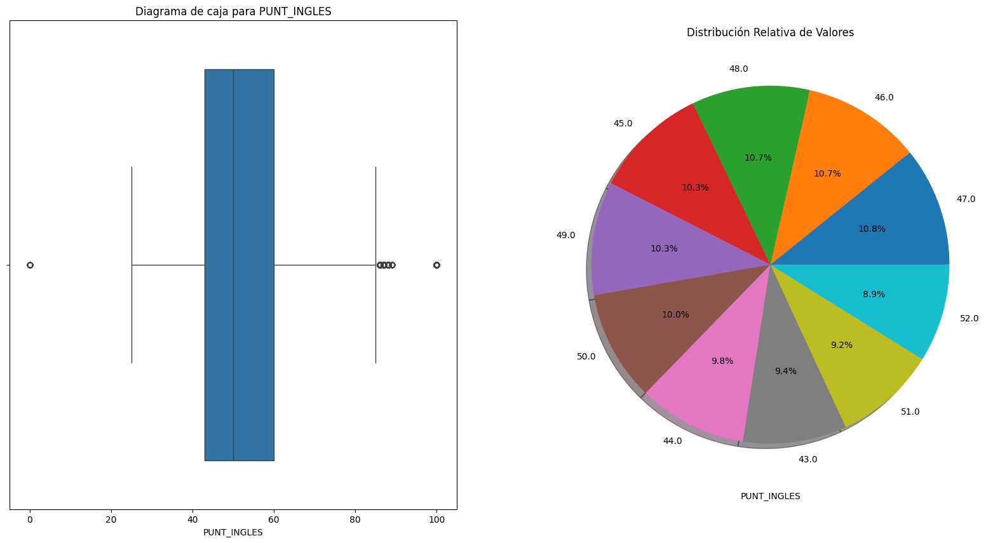



Estadísticas Básicas


count    405869.000000
mean         52.251234
std          12.912011
min           0.000000
25%          43.000000
50%          50.000000
75%          60.000000
max         100.000000
Name: PUNT_INGLES, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




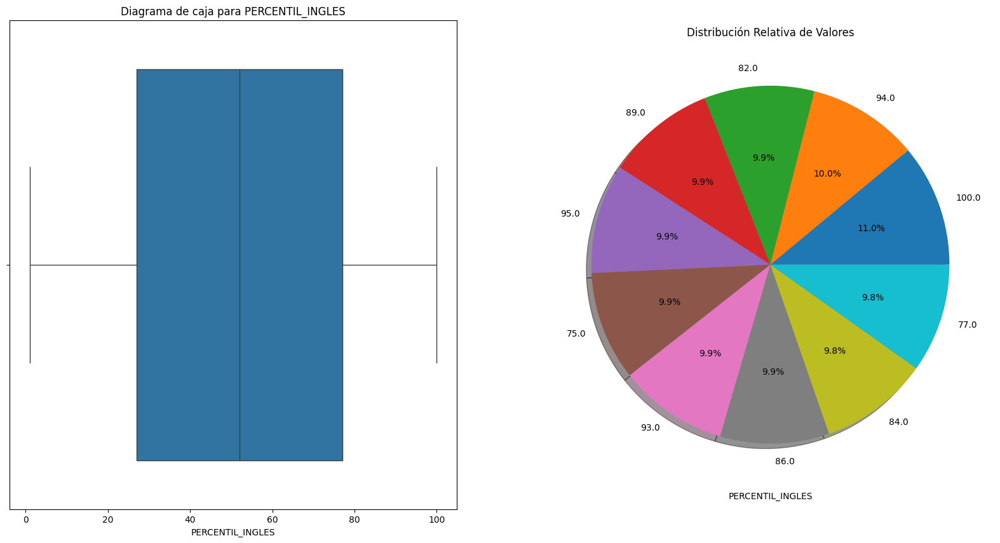



Estadísticas Básicas


count    405869.000000
mean         51.714970
std          28.701859
min           1.000000
25%          27.000000
50%          52.000000
75%          77.000000
max         100.000000
Name: PERCENTIL_INGLES, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




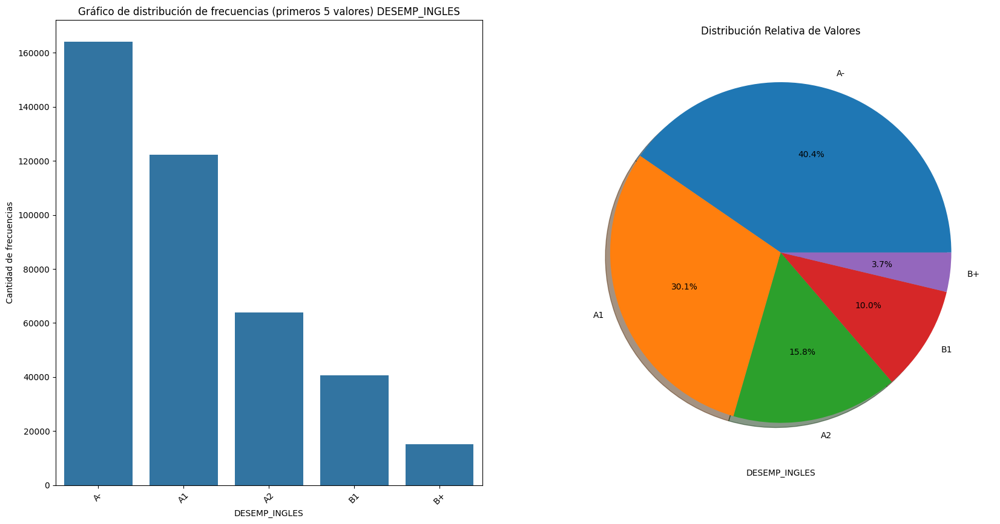



Estadísticas Básicas


count     405869
unique         5
top           A-
freq      163975
Name: DESEMP_INGLES, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




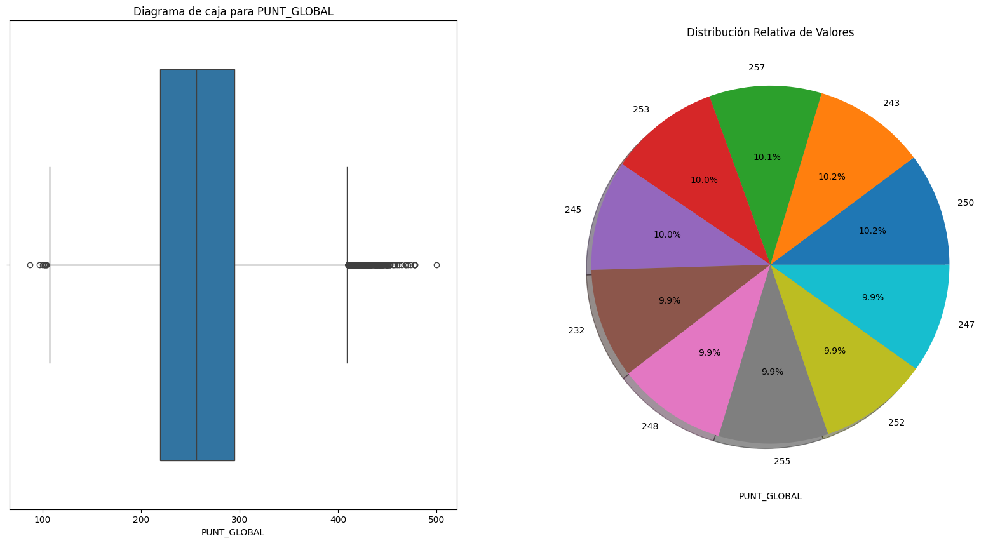



Estadísticas Básicas


count    405869.000000
mean        258.771273
std          51.720142
min          87.000000
25%         219.000000
50%         256.000000
75%         295.000000
max         500.000000
Name: PUNT_GLOBAL, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




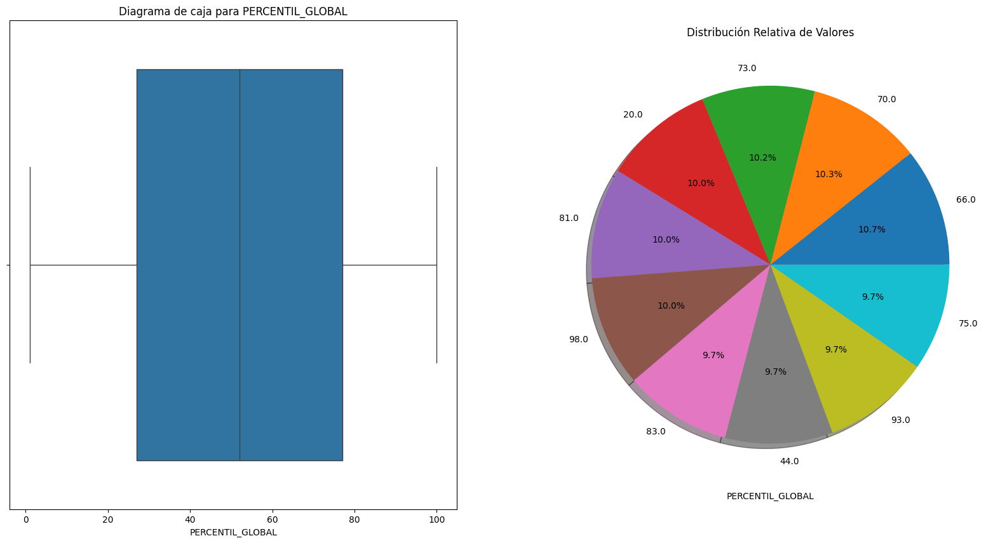



Estadísticas Básicas


count    405869.000000
mean         51.817796
std          28.760980
min           1.000000
25%          27.000000
50%          52.000000
75%          77.000000
max         100.000000
Name: PERCENTIL_GLOBAL, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




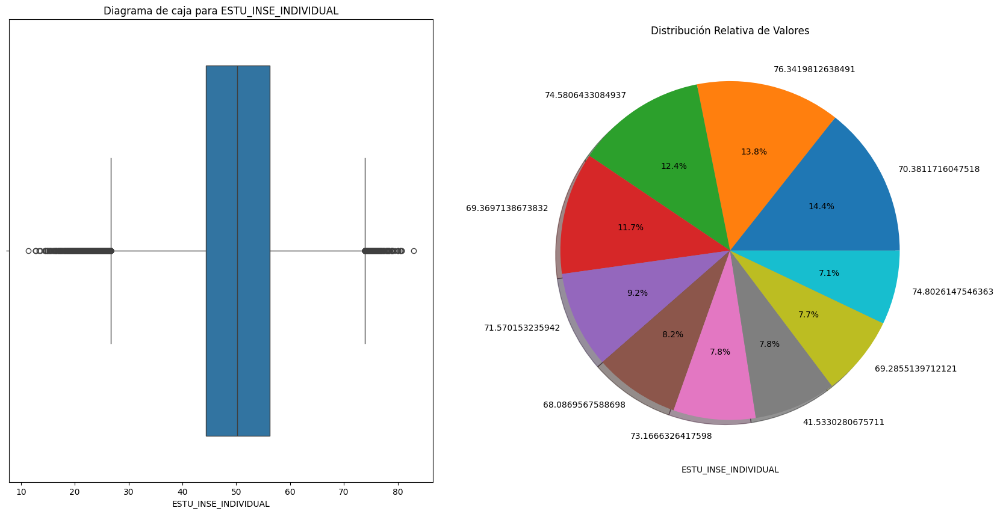



Estadísticas Básicas


count    405869.000000
mean         50.322277
std           8.804060
min          11.347243
25%          44.405296
50%          50.206417
75%          56.197166
max          83.007321
Name: ESTU_INSE_INDIVIDUAL, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




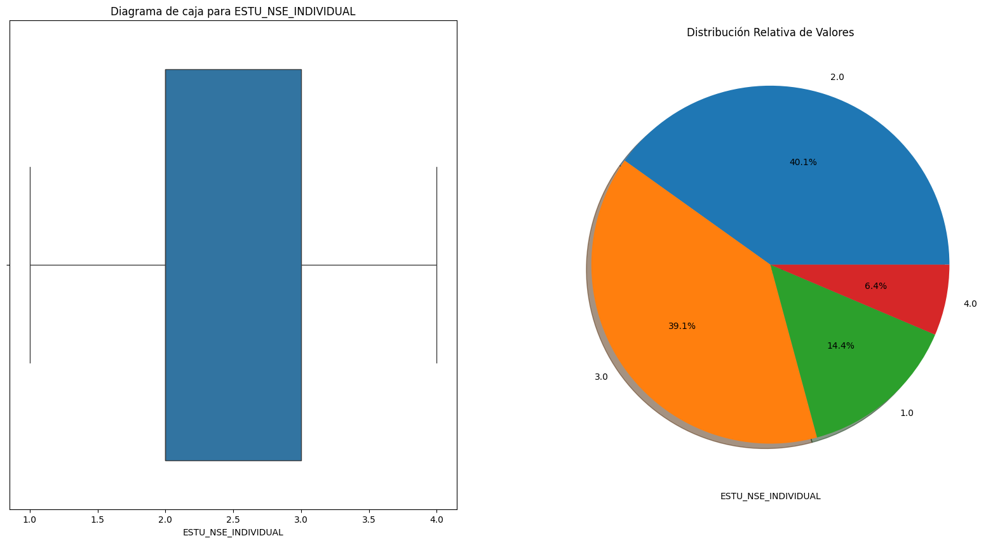



Estadísticas Básicas


count    405869.000000
mean          2.374695
std           0.806455
min           1.000000
25%           2.000000
50%           2.000000
75%           3.000000
max           4.000000
Name: ESTU_NSE_INDIVIDUAL, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




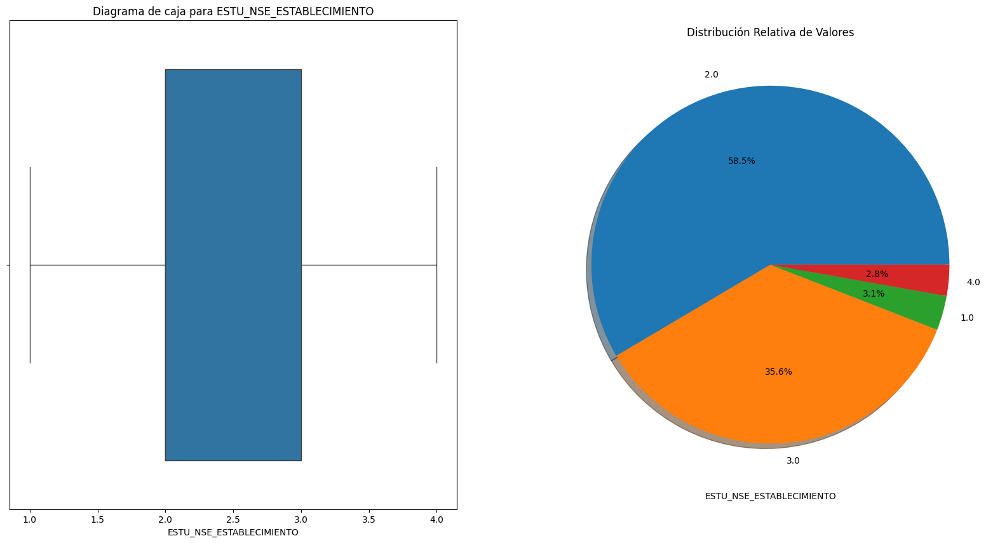



Estadísticas Básicas


count    405869.000000
mean          2.380827
std           0.595103
min           1.000000
25%           2.000000
50%           2.000000
75%           3.000000
max           4.000000
Name: ESTU_NSE_ESTABLECIMIENTO, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




In [30]:
descripcion_distribucion(df)

## <h2 align= 'center'><u>Análisis General</u></h2>

En ésta sección se realizará el análisis de las distintas features haciendo foco en su relacion, correlacion y trazando un entrecruzamiento entre ellas apuntando a un análisis profundo de sus relaciones

1-¿Cómo impacta la jornada a la que asiste con respecto al desempeño?


2-¿Cuál es la distribución de las calificaciones en las diferentes áreas del examen (lectura crítica, matemáticas, ciencias naturales, sociales y ciudadanas, inglés y global)?
Esto nos ayudará a entender cómo se desempeñan los estudiantes en cada área y dónde pueden necesitar más ayuda.

3-¿Cómo varía el rendimiento académico según el género de los estudiantes?
Esto nos permitirá identificar posibles disparidades de género en el rendimiento académico.

4-¿Hay alguna correlación entre el estrato de vivienda y el rendimiento académico?
Esto podría ayudarnos a entender si el nivel socioeconómico tiene algún impacto en el desempeño académico.

5-¿Existe alguna relación entre el número de personas en el hogar y el rendimiento académico?
Podría ser interesante ver si el tamaño del hogar tiene algún efecto en el desempeño académico de los estudiantes.

6-¿Qué diferencias existen en el rendimiento académico entre estudiantes de escuelas urbanas y rurales?
Esto podría arrojar luz sobre posibles disparidades en la calidad de la educación entre áreas urbanas y rurales.

7-¿Cómo se correlaciona el nivel educativo de los padres con el rendimiento académico de los estudiantes?
Esto podría indicar la importancia de la educación de los padres en el éxito académico de los estudiantes.

8-¿Hay alguna relación entre la cantidad de horas que los estudiantes dedican a estudiar y su rendimiento académico?
Esto nos ayudará a entender si el tiempo dedicado al estudio tiene un impacto en el desempeño académico.

9-¿Cuál es la distribución de las calificaciones a lo largo del tiempo (por períodos)?
Esto podría revelar tendencias en el rendimiento académico a lo largo de los períodos de tiempo.

10-¿Cómo se relaciona el rendimiento la educación privada vs la pública y cuales son las instituciones con mayor rendimiento académico.?

11-¿Cómo se correlaciona el nivel socioeconómico individual de los estudiantes con el rendimiento académico a nivel de establecimiento educativo?
Esto podría proporcionar información sobre la influencia del entorno socioeconómico del estudiante y el ambiente escolar en el rendimiento académico.

12-¿Hay alguna diferencia en el rendimiento académico entre estudiantes que trabajan y los que no lo hacen?
Esto podría ayudar a entender cómo el trabajo afecta el rendimiento académico de los estudiantes.

13-¿Cuál es la relación entre la dedicación diaria a la lectura y el rendimiento académico en lectura crítica?
Esto podría ayudar a determinar si la práctica regular de la lectura tiene un impacto positivo en el desempeño en esta área.

14-¿Existe alguna diferencia en el rendimiento académico entre estudiantes que tienen acceso a internet y los que no?
Esto podría proporcionar información sobre la importancia de la conectividad a internet en el aprendizaje y el rendimiento académico.

15-¿Hay alguna asociación entre el número de libros en el hogar y el rendimiento académico?
Esto podría indicar si la disponibilidad de material de lectura en el hogar está relacionada con el éxito académico de los estudiantes.

16-¿Cómo varía el rendimiento académico según el nivel de educación de los padres en comparación con el nivel de educación del establecimiento educativo?
Esto podría revelar diferencias en el impacto del nivel educativo de los padres versus el entorno escolar en el desempeño académico.

17-¿Cómo se correlaciona el rendimiento académico en inglés con el rendimiento global en el examen?
Esto podría revelar la importancia del dominio del inglés en el rendimiento general de los estudiantes.

18-¿Existe alguna diferencia en el rendimiento académico entre estudiantes que viven en áreas urbanas y aquellos que viven en áreas rurales en función de la estratificación socioeconómica?
Esto podría ayudar a comprender cómo se entrecruzan factores como la ubicación geográfica y el estatus socioeconómico en el rendimiento académico.

19-¿Cómo se correlaciona el nivel socioeconómico individual de los estudiantes con el nivel socioeconómico promedio del establecimiento educativo?
Esto podría proporcionar información sobre cómo la composición socioeconómica del estudiante en comparación con la del ambiente escolar afecta al rendimiento académico.



In [9]:
df.head(2)

,ESTU_TIPODOCUMENTO,ESTU_GENERO,PERIODO,ESTU_DEPTO_RESIDE,ESTU_MCPIO_RESIDE,ESTU_PRESENTACIONSABADO,FAMI_ESTRATOVIVIENDA,FAMI_PERSONASHOGAR,FAMI_CUARTOSHOGAR,FAMI_EDUCACIONPADRE,FAMI_EDUCACIONMADRE,FAMI_TRABAJOLABORPADRE,FAMI_TRABAJOLABORMADRE,FAMI_NUMLIBROS,FAMI_COMELECHEDERIVADOS,FAMI_COMECARNEPESCADOHUEVO,FAMI_COMECEREALFRUTOSLEGUMBRE,ESTU_DEDICACIONLECTURADIARIA,ESTU_DEDICACIONINTERNET,ESTU_HORASSEMANATRABAJA,COLE_NOMBRE_ESTABLECIMIENTO,COLE_NATURALEZA,COLE_BILINGUE,COLE_CARACTER,COLE_NOMBRE_SEDE,COLE_SEDE_PRINCIPAL,COLE_AREA_UBICACION,COLE_JORNADA,COLE_MCPIO_UBICACION,ESTU_MCPIO_PRESENTACION,PUNT_LECTURA_CRITICA,PERCENTIL_LECTURA_CRITICA,DESEMP_LECTURA_CRITICA,PUNT_MATEMATICAS,PERCENTIL_MATEMATICAS,DESEMP_MATEMATICAS,PUNT_C_NATURALES,PERCENTIL_C_NATURALES,DESEMP_C_NATURALES,PUNT_SOCIALES_CIUDADANAS,PERCENTIL_SOCIALES_CIUDADANAS,DESEMP_SOCIALES_CIUDADANAS,PUNT_INGLES,PERCENTIL_INGLES,DESEMP_INGLES,PUNT_GLOBAL,PERCENTIL_GLOBAL,ESTU_INSE_INDIVIDUAL,ESTU_NSE_INDIVIDUAL,ESTU_NSE_ESTABLECIMIENTO
0,TI,F,1,CUNDINAMARCA,CHÍA,No,3,5 a 6,4.0,Educación profesional completa,Educación profesional completa,1,4,1,1,1,1,1,1,1,COLEGIO BILINGUE JOSE MAX LEON ...,NO OFICIAL,N,ACADÉMICO,COL JOSE MAX LEON,S,RURAL,COMPLETA,COTA,ZIPAQUIRÁ,100,100,4,83,100,4,77,99,4,77,97,4,87.0,94.0,B+,422,100.0,67.532814,4.0,4.0
1,CC,F,1,VALLE,CALI,No,3,3 a 4,4.0,Ninguno,Primaria incompleta,4,5,3,2,3,1,3,4,2,INST LA CAMPIÑA,NO OFICIAL,N,ACADÉMICO,INST LA CAMPIÑA,S,URBANO,MAÑANA,CALI,CALI,45,16,2,41,16,2,41,19,2,27,1,1,58.0,43.0,A2,200,12.0,41.863163,2.0,3.0


##Gráfico impacto jornada con respecto al desempeño

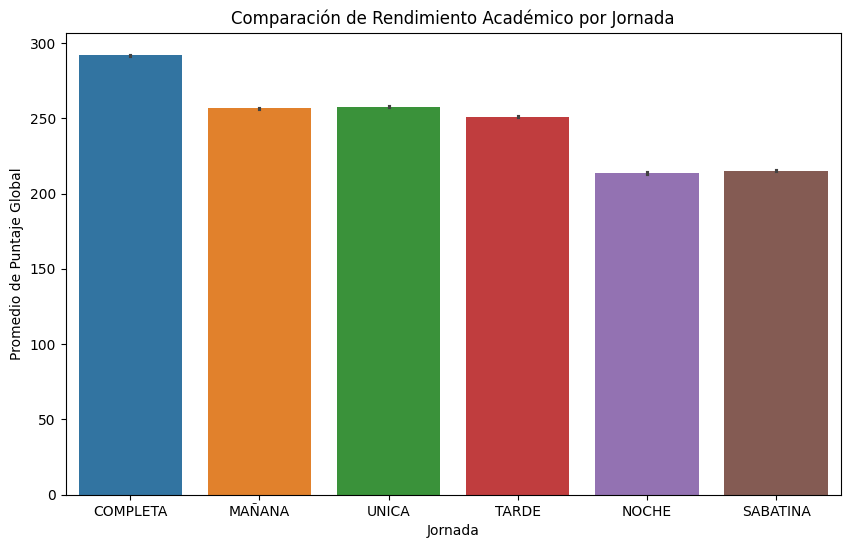

In [34]:
pregunta_1(df)

El análisis del rendimiento académico según las distintas jornadas revela que la jornada completa destaca con la puntuación más alta, seguida por las jornadas de mañana, única y tarde. En contraste, las jornadas sabatina y nocturna muestran puntajes más bajos. Estos hallazgos sugieren que la duración y el horario de las clases pueden desempeñar un papel crucial en el rendimiento estudiantil. Es posible que la jornada completa ofrezca más tiempo de aprendizaje efectivo, mientras que las jornadas matutina y vespertina podrían adaptarse mejor a los ritmos biológicos naturales de los estudiantes. Por otro lado, las jornadas sabatina y nocturna podrían verse afectadas por la fatiga acumulada durante la semana y la disponibilidad limitada de recursos educativos. En conjunto, estos resultados resaltan la importancia de considerar el diseño de horarios escolares para optimizar el rendimiento académico y asegurar un entorno propicio para el aprendizaje efectivo.



##Gráfico distribución de calificaciones diferentes áreas del examen

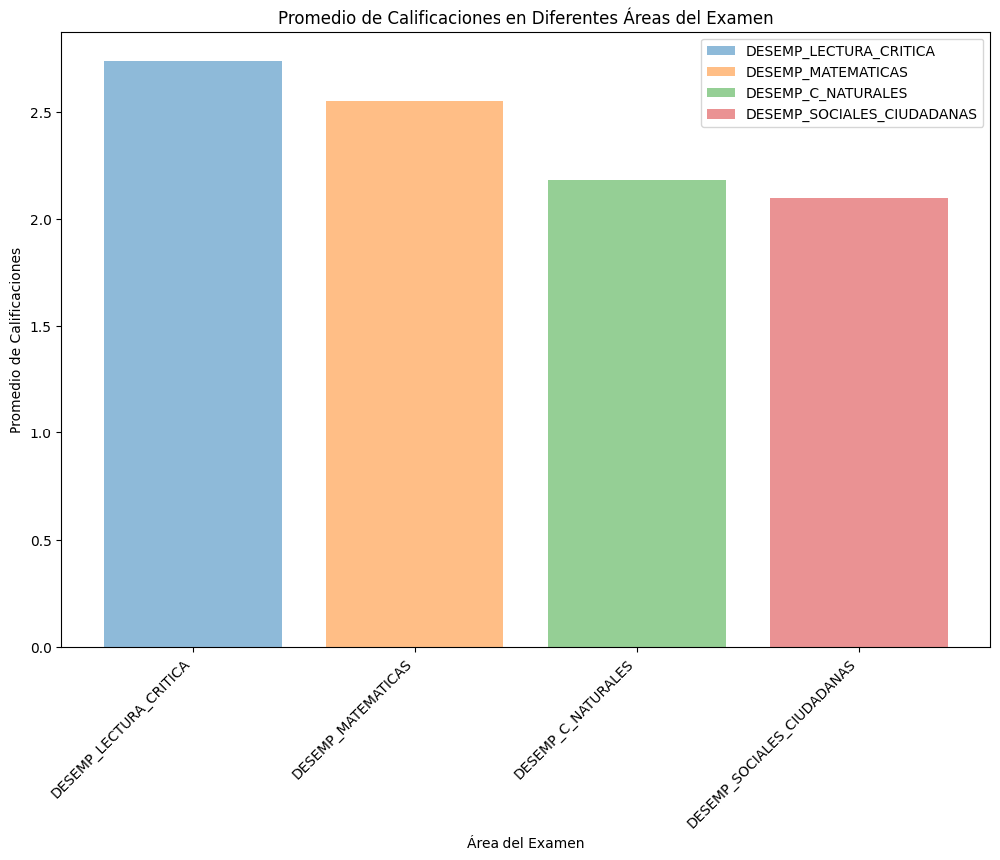

In [38]:
pregunta_2(df)


Al observar el gráfico, se destaca que el mejor desempeño se registró en el área de lectura crítica, seguida por matemáticas, ciencias naturales y ciencias sociales. Sin embargo, es importante señalar que hubo una disminución gradual en las puntuaciones a lo largo de las diferentes materias del examen. Esto sugiere que, aunque los estudiantes tuvieron un buen desempeño en lectura crítica, las calificaciones disminuyeron progresivamente en matemáticas, ciencias naturales y ciencias sociales. Este patrón puede indicar áreas específicas que requieren mayor atención y refuerzo para mejorar el rendimiento estudiantil de manera integral en todas las materias evaluadas.

##Gráfico rendimiento academico entre generos

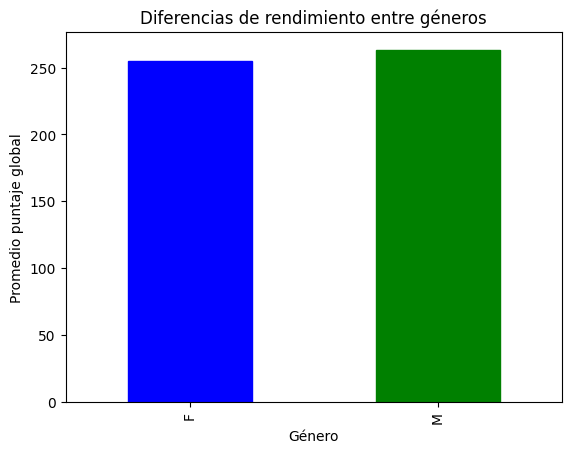

In [36]:
pregunta_3(df)


Al analizar la gráfica de barras que contrasta los promedios de puntaje global entre géneros, se aprecia que las barras correspondientes a cada género exhiben alturas notablemente similares. Esta paridad en los promedios de puntaje global insinúa una equiparación en el desempeño académico entre géneros en el marco de las pruebas ICFES. En otras palabras, tanto los estudiantes masculinos como femeninos muestran un rendimiento comparable en esta evaluación específica. Este hallazgo sugiere un equilibrio relativo en el desempeño académico, lo cual puede interpretarse como un indicador de equidad de género en el contexto de estas pruebas.

##Gráfico relación estrato de la vivienda y rendimiento académico

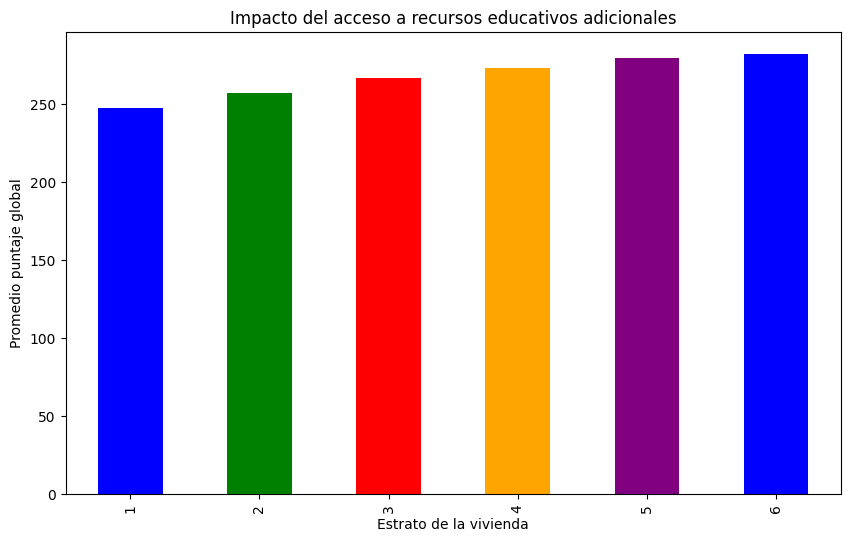

In [42]:
pregunta_4(df)

La gráfica muestra cómo el rendimiento académico varía según el estrato socioeconómico de los estudiantes. Se observa una tendencia ascendente: los estratos más altos tienden a tener puntajes promedio más altos. Esto sugiere que el acceso a recursos educativos adicionales puede influir en el rendimiento académico. Por otro lado, los estudiantes de estratos más bajos podrían enfrentar desafíos debido a un acceso limitado a tales recursos. Esta disparidad destaca la importancia de abordar las inequidades educativas para garantizar oportunidades equitativas para todos los estudiantes, independientemente de su origen socioeconómico.

##Gráfico relación entre el número de personas en el hogar y el rendimiento académico

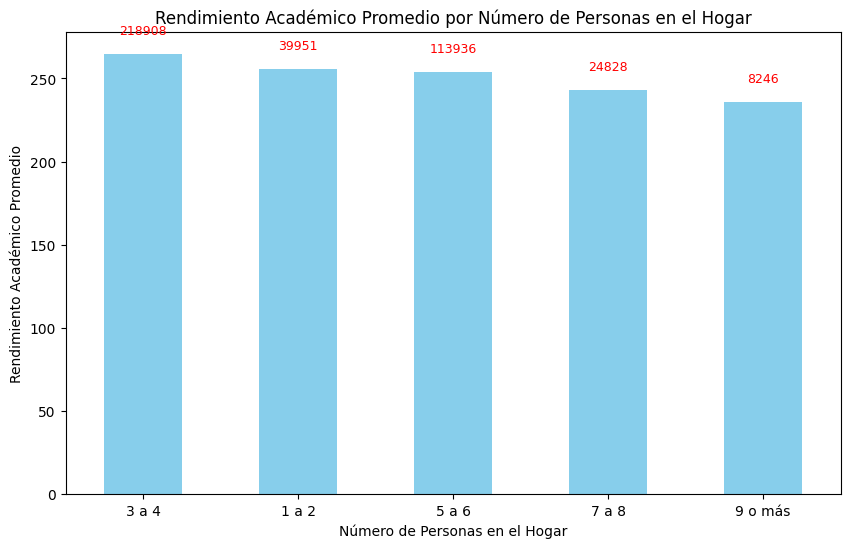

In [45]:
pregunta_5(df)

Después de analizar el gráfico, se destaca que los hogares con 3 a 4 personas muestran un mayor rendimiento académico promedio, mientras que aquellos con 9 o más personas tienen un rendimiento más bajo. Esto sugiere una posible influencia del tamaño del hogar en el rendimiento educativo, donde hogares más pequeños pueden proporcionar un entorno más propicio para el estudio y el aprendizaje. Sin embargo, es importante tener en cuenta que otros factores también pueden contribuir a estas diferencias, como el nivel socioeconómico, el acceso a recursos educativos y el apoyo familiar.

##Gráfico comparación rendimiento entre Instituciones Rurales y Urbanas

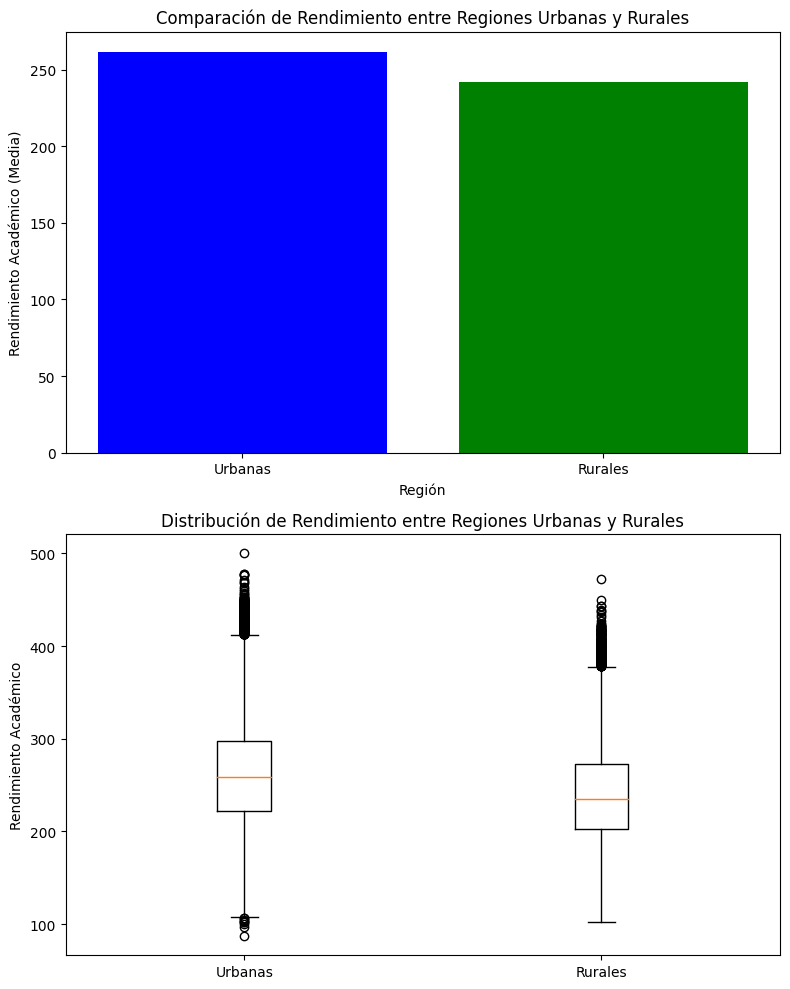

In [49]:
pregunta_6(df)


En resumen, los gráficos comparativos entre regiones urbanas y rurales muestran diferencias en el rendimiento académico. La barra de media y el diagrama de caja indican que el rendimiento promedio y la distribución de puntajes pueden variar entre estas poblaciones estudiantiles. Sin embargo, es crucial considerar la disparidad en el tamaño de las muestras: la muestra urbana es significativamente mayor que la rural. Esta diferencia puede afectar la precisión de las estimaciones y la generalización de los resultados. A pesar de las diferencias observadas, se requiere un análisis más profundo para comprender completamente cómo estas discrepancias pueden influir en la interpretación y aplicabilidad de los resultados a toda la población estudiantil.

##Gráfico nivel educativo de los padres

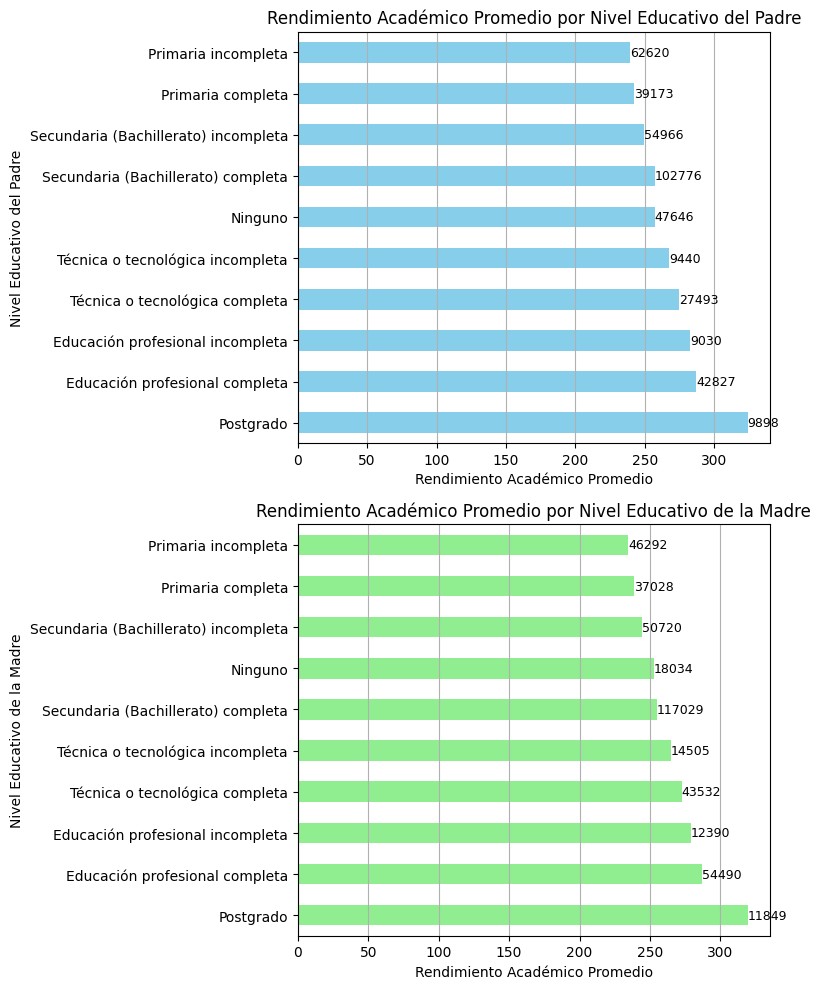

In [54]:
pregunta_7(df)

Los gráficos revelan una correlación notable entre el nivel educativo tanto del padre como de la madre y el desempeño académico de los estudiantes. Esta tendencia sugiere que a medida que los padres alcanzan niveles más altos de educación, los hijos tienden a tener un mejor rendimiento académico. Este fenómeno podría explicarse por la influencia positiva que ejercen los padres con mayor educación en el entorno familiar, proporcionando recursos educativos adicionales, fomentando la importancia del aprendizaje y brindando un mayor apoyo en el desarrollo académico de sus hijos. En resumen, los hallazgos resaltan la relevancia del rol parental y el ambiente educativo en el éxito académico de los estudiantes.

##Gráfico dedicación horas de estudio vs rendimiento académico

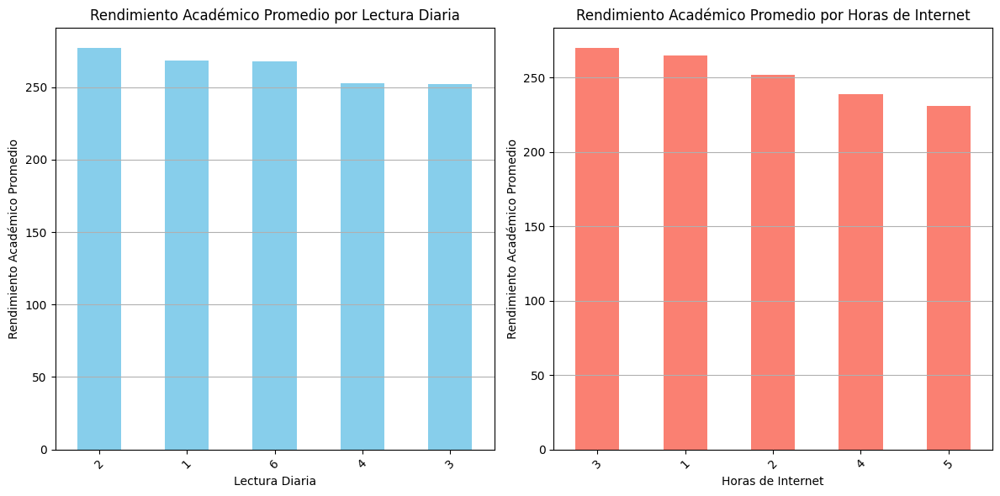

In [58]:
pregunta_8(df)

En los gráficos presentados, se examina la relación entre las horas dedicadas a la lectura diaria y el tiempo en Internet por parte de los estudiantes, con su rendimiento académico. En el primer gráfico, se observa que los estudiantes que dedicaron menos tiempo a la lectura diaria obtuvieron un rendimiento académico promedio más alto que aquellos que dedicaron más horas. Este hallazgo plantea interrogantes sobre la calidad frente a la cantidad de estudio, sugiriendo que el enfoque de estudio puede ser más determinante que la extensión temporal.

Por otro lado, en el segundo gráfico, se analiza la relación entre el tiempo dedicado a Internet y el rendimiento académico. Sorprendentemente, los estudiantes que pasaron menos tiempo en línea lograron un rendimiento académico promedio más alto en comparación con aquellos que dedicaron más horas a la navegación en Internet. Este resultado resalta la importancia de una gestión efectiva del tiempo en línea para el éxito académico y destaca la necesidad de considerar cómo se utiliza el tiempo fuera del estudio formal. Estos hallazgos subrayan la complejidad de los factores que influyen en el rendimiento académico y resaltan la importancia de explorar más a fondo estas dinámicas en futuras investigaciones.

##Gráfico rendimiento académico promedio por periodo

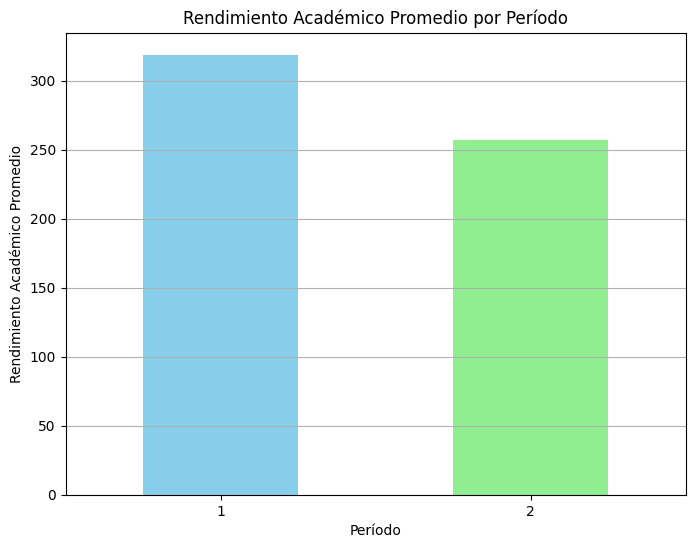

In [61]:
pregunta_9(df)

Al analizar el gráfico, se observa que el rendimiento académico promedio durante el período uno fue superior al rendimiento registrado en el período dos. Además, es notable la disparidad en el tamaño de la población entre ambos períodos, siendo considerablemente mayor en el segundo período. Estas discrepancias podrían indicar la influencia de diversos factores, tanto en el rendimiento académico como en la participación de los estudiantes en los exámenes durante esos períodos.

##Gráfico efectividaad de la educación púbica vs privada

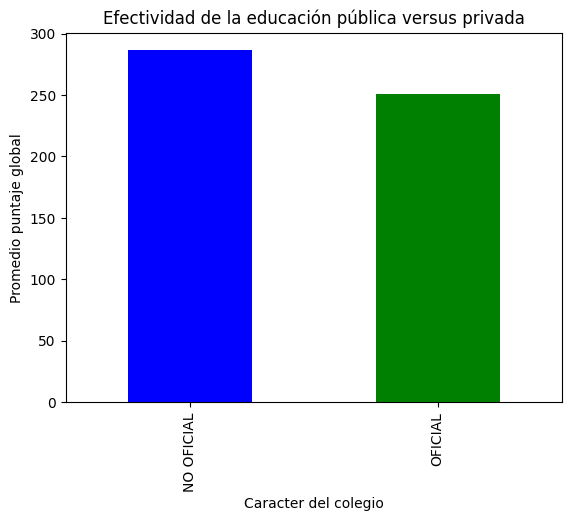

In [66]:
pregunta_10(df)

Al observar la gráfica de barras, se puede notar que las instituciones privadas (NO OFICIAL) tienen un mayor rendimiento académico en comparación con las públicas (OFICIAL). Es posible atribuir este fenómeno a una combinación de factores, como recursos educativos adicionales, un enfoque en la calidad educativa, una mayor inversión por estudiante y posiblemente una población estudiantil más selectiva. Sin embargo, es crucial considerar estos factores dentro del contexto más amplio de la equidad educativa y las disparidades socioeconómicas en la educación. Es importante no pasar por alto la influencia que pueden tener estas disparidades en los resultados académicos, y reflexionar sobre cómo abordarlas para garantizar un acceso equitativo a una educación de calidad para todos los estudiantes.

##Gráfico top 5 mejores rendimientos por institución educativa

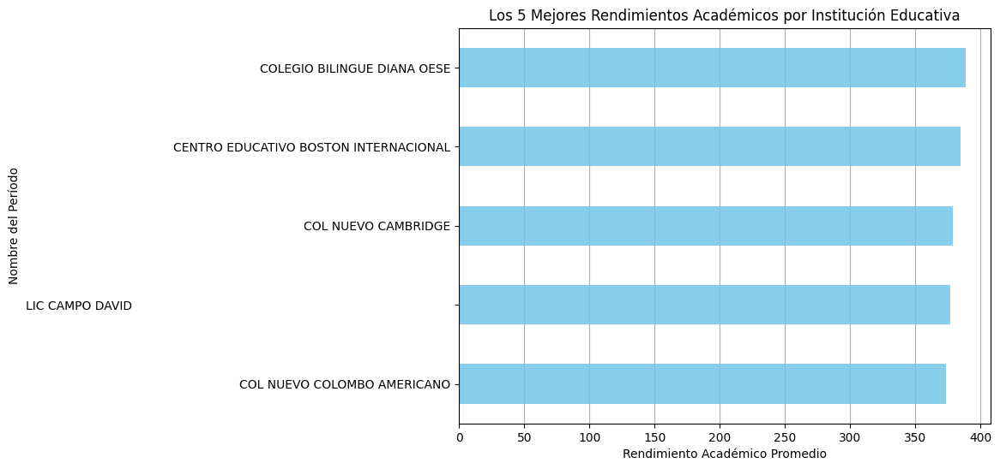

In [69]:
pregunta10_1(df)

Se destaca que los cinco colegios con el mejor rendimiento académico son de naturaleza privada y bilingüe, lo que sugiere una posible correlación entre estas características y un desempeño estudiantil superior. Este hallazgo puede atribuirse a varios factores, como una mayor inversión en recursos educativos, un enfoque centrado en la calidad de la enseñanza y posiblemente una población estudiantil más selectiva. Sin embargo, es importante reconocer que el análisis se basa únicamente en el rendimiento promedio y que otros aspectos, como la dedicación de los docentes, el entorno escolar y los recursos adicionales disponibles, también pueden influir en estos resultados

## Grafico relacion nivel socioeconómico individual de los estudiantes con el rendimiento académico a nivel de establecimiento educativo

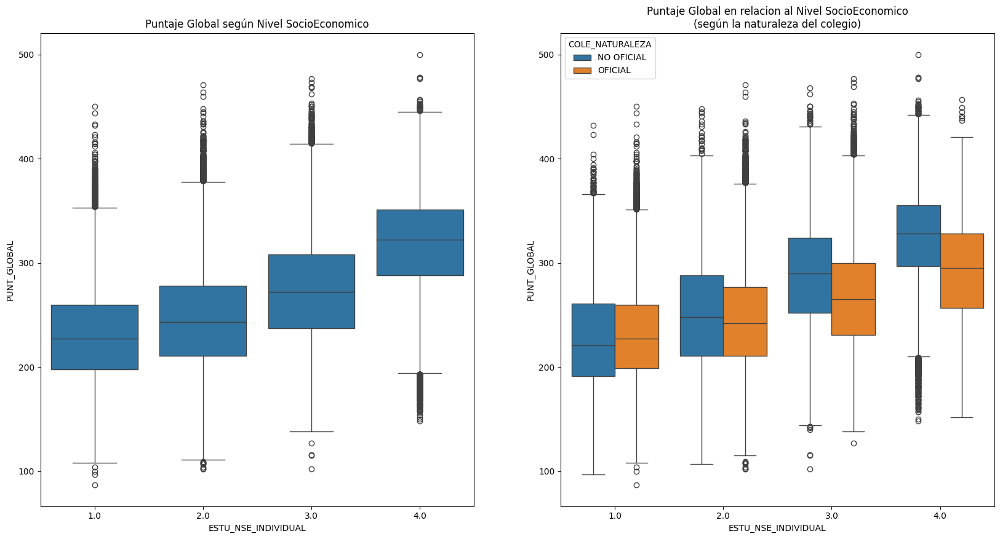

In [ ]:
pregunta_11(df)

Podemos observar que existe una clara relacion entre el nivel socioeconomico y el aumento el nivel de puntuacion global

En el primer grafico apuntamos a observar la dispersion de los valores observados en el puntaje global segun el valor en la escala de NSE (Nivel Socio Economico) que toma en este caso valores del 1 al 4 (que corresponden, desde el mas bajo al mas alto, a los valores de la escala: NSE1-NSE2-NSE3-NSE4)

como podemos observar cuanto mas alto es el valor de la escala NSE, el conjunto de puntajes tiende a ser mas alto en general y en particular (observamos que en ascendencia, las medianas y la posicion de la caja va en aumento con respecto al puntaje global)

esto nos marca una clara relacion entre las variables: el nivel socioeconomico del examinado inside directamente en su desempeño con respecto al puntaje global (a mas alto nivel socioeconomico, mayor puntaje global)

Con respecto al segundo grafico, se toma en cuenta tambien la naturaleza del colegio/institucion de donde es el alumno (OFICIAL (pública), NO OFICIAL (privada)).

podemos observar que en el conjunto de los estudiantes de nivel socioeconomico mas bajo, los que asisten a escuelas OFICIALES/públicas tienen en general una dispercion de puntaje mas amplio con una mediana un poco mas baja (quiere decir que los alumnos tienen puntajes mas variados que en las escuelas NO OFICIALES/privadas) y en general los alumnos de instituciones NO OFICIALES tienden a tener mayor puntaje en total (aunque su rango de valores resulta muy similar)

Esta tendencia tiende a revertirse cada vez más a medida que mejora el nivel socioeconomico del examinado: las escuelas oficiales tienden a tener valores mas altos, con una menor dispersion de las puntuaciones en sus alumnos en comparacion con las instituciones NO OFICIALES.

Podriamos corroborar estas conclusiones observando la medida de correlacion entre variables:

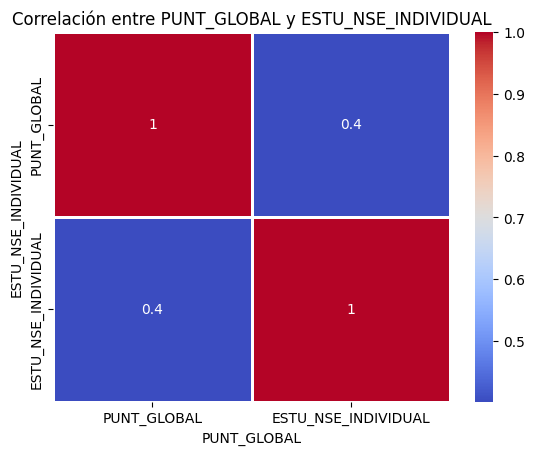

In [ ]:
correlaciones_pregunta_11()

## Grafico relacion rendimiento académico con su situacion laboral

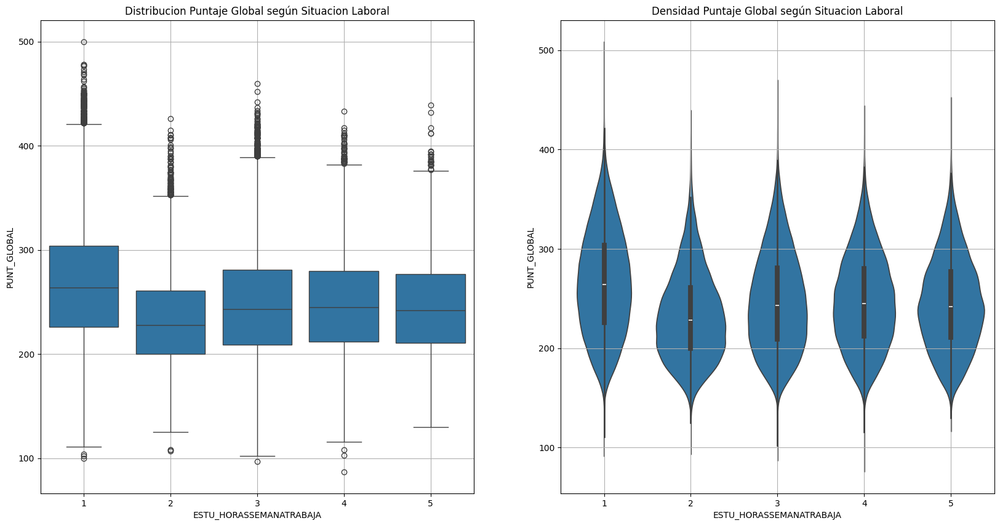

In [ ]:
pregunta_12(df)

Podemos sacar la conclusion de que las horas trabajadas por el estudiante tienen una cierta incidencia en su desempeño (señalando previamente que los valores van de 1 a 5, de manera incremental, con 1 siendo estudiantes que no trabajan y 5 con estudiantes que trabajan 30 horas o mas por semana)

Llegamos a esta conclusion ya que podemos ver que los estudiantes sin trabajo tienden a tener mejores calificaciones que estudiantes que trabajan (independientemente de la cantidad de horas trabajadas), esto se fundamenta en un valor de mediana de puntaje total mas alto que los demas conjuntos de estudiantes, con una dispersion de rango de valores mas amplia, pero con una concentracion de puntajes obtenidos que supera en puntaje total a los demas conjuntos de casos (o sea, la caja esta mas elevada que las otras cajas)

## Grafico relación entre la dedicación diaria a la lectura y el rendimiento académico en lectura crítica

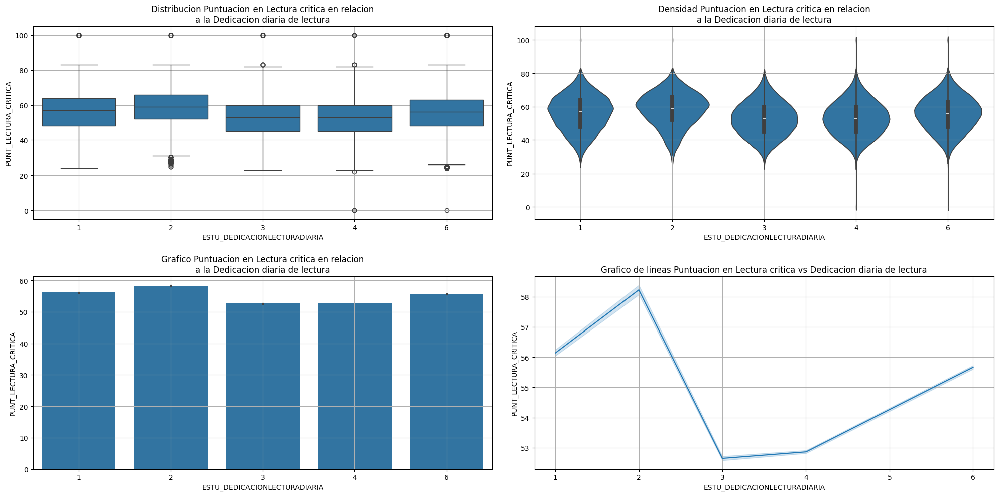

In [ ]:
pregunta_13()

Podemos señalar en este caso, que la dedicacion diaria de lectura en estudiantes de 30 minutos o más tiene una incidencia positiva en el desempeño de la lectura critica, ya que aquellos que lo hacen por 30 min a 2 horas o más tiempo tienden a elevar su puntuacion de lectura critica cuanto mayor cantidad de tiempo le dedican a la lectura por entretenimiento.

Aunque queda pendiente en análisis para complementar, que tipo de contenido es al cual enfocan su tiempo de lectura, para determinar su incidencia en el desempeño.

Podemos destacar estas conclusiones como muestra del paton que se reconoce a traves del estudio de estos graficos aplicados a la data

Como nota complementaria, el patron es erratico en cuanto a los que leen 30 minutos o menos diariamente por entretenimiento o no lo hacen en absoluto (aqui tambien podrriamos señalar cual es el contenido de la lectura como factor), esto cambia a partir de la lectura diaria de 30 minutos o mas donde se observa una tendencia a la alza constante y pronunciada

## Grafico rendimiento académico entre estudiantes que tienen acceso a internet y los que no

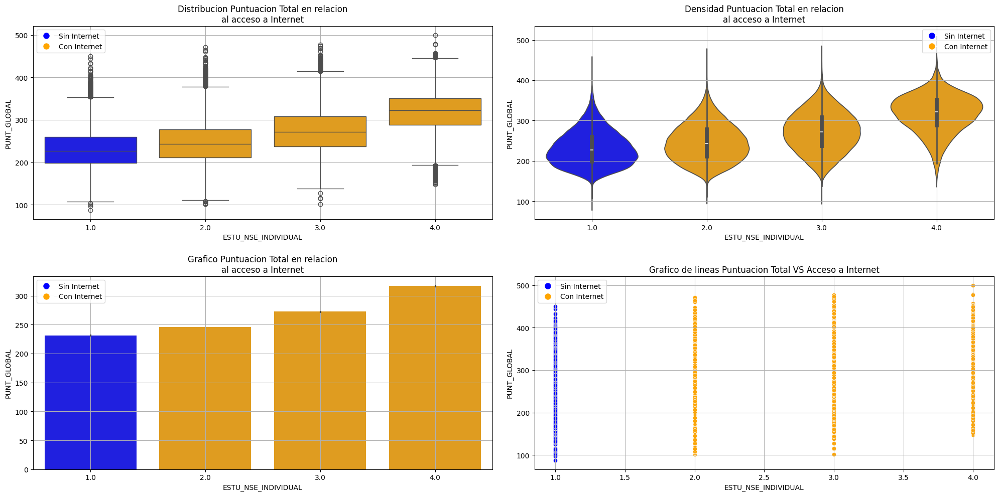

In [ ]:
pregunta_14()

El tema de tener acceso a internet (y por ende a un computador), repercute en el desempeño academico del examinado.
Esta es la conclusion a la que hemos llegado a partir del analisis de los graficos:

* En los graficos de caja y de violin podemos observar la distribucion de valores de la puntuacion total con respecto al acceso o no a internet, donde claramente se ve la diferencia entre el desempeño de aquellos examinados que no cuentan con acceso a internet con los que si (estos ultimos, tienden a tener mayor puntaje), incluso la densidad (cantidad/agrupacion de valores) de examinados con puntajes mas elevados es mayor.
* Por ultimo podemos verlo tanto en el valor de la mediana (en el caso de los primeros graficos) el cual es mas elevado en los casos con acceso a internet y tambien en el grafico de barras, donde se toma en cuenta el valor medio en el puntaje del grupo de examinados, segregados por nivel socioeconomico, pero haciendo foco en los que tienen aceso a internet (barras naranjas) y los que no lo tienen (barra azul), donde nuevamente se ve una clara diferencia de puntuacion

## Grafico de relacion número de libros en el hogar y el rendimiento académico

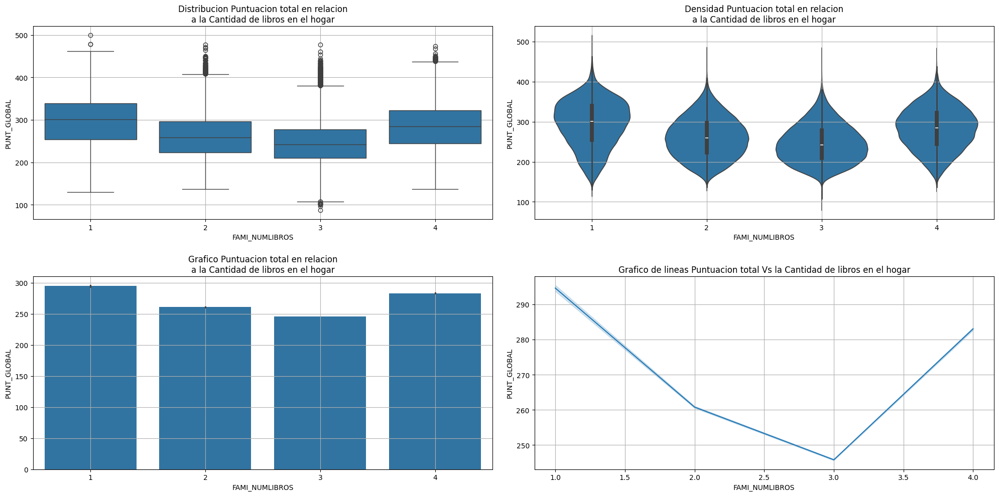

In [ ]:
pregunta_15()

El análisis de las variables en esta serie de graficos vemos, en principio, la tendencia en la cantidad de libros incide de manera inversamente proporcional en el puntaje total del examinado, revirtiendose esta tendencia a partir de los 26 libros o mas.

Hablando mas en especifico, vemos que no existe una gran diferencia en la distribucion de valores en la puntuacion total con respecto a la cantidad de libros, auqneu si existe una variacion de la mediana y la media, asi como en donde se ubica la mayor densidad en esa distribucion, que sigue la linea de la primera conclusion que sacamos.

vemos que la tendencia se presenta reflejada tambien si comparamos las medias de los conjuntos de valores para la variable que hace referencia al numero de libros que tiene el examinado

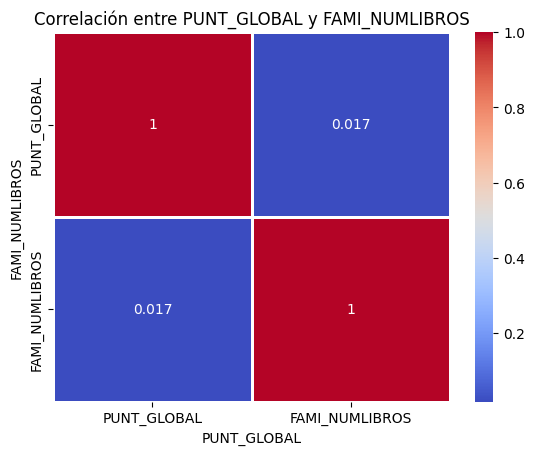

In [ ]:
correlaciones_pregunta_15()

Por lo que vemos en este mapa de correlaciones, no se vislumbra practicamente un grado de correlacion lineal entre las variables

## Grafico rendimiento académico según el nivel de educación de los padres en comparación con el nivel de educación del establecimiento educativo

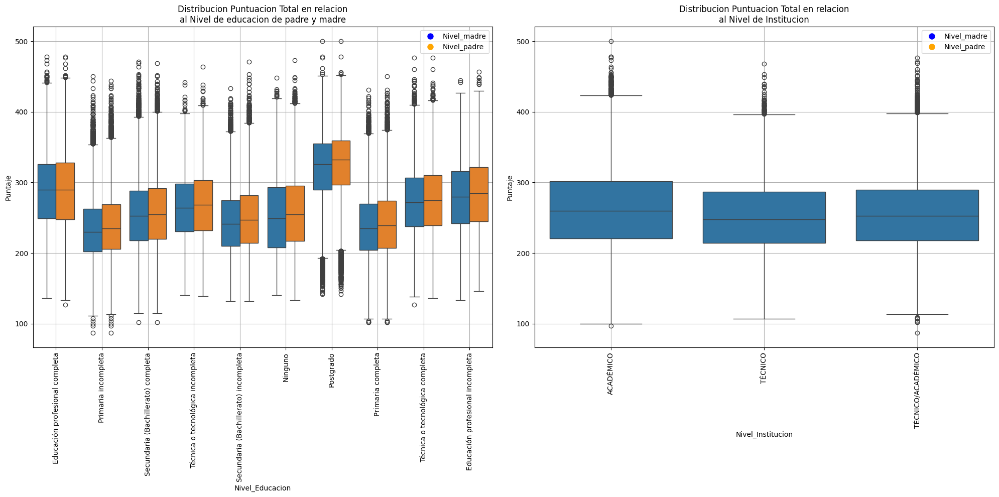

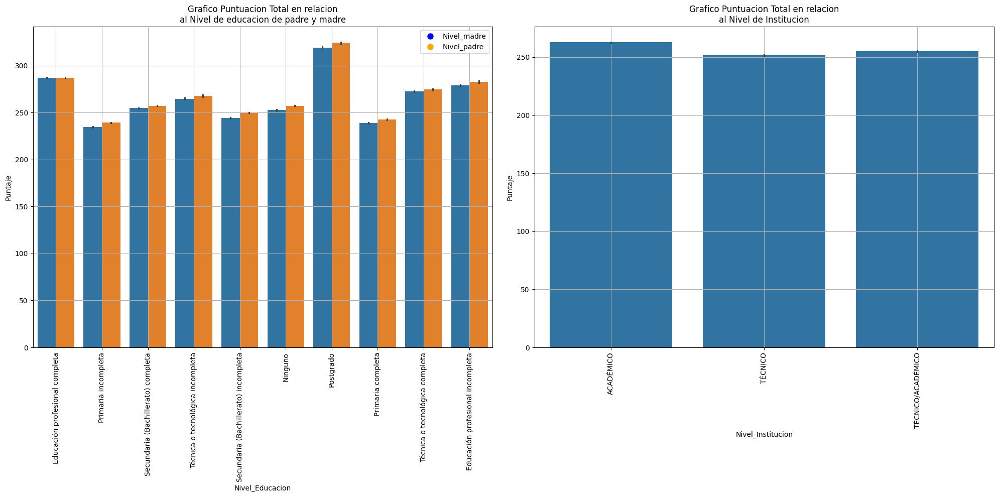

In [ ]:
pregunta_16()

Como vemos en el analisis realizado en los graficos, podemos concluir que el nivel de educacion de los padres tiene incidencia en la puntuacion total del examinado.

A mayor nivel de educacion de los padres, mayor puntaje total de los examinados

se observa que los alumnos con padres con nivel de educacion de posgrado tienen altos valores generales de puntuacion total

Por otra parte no existen grandes diferencias en principio en cuanto a la incidencia del tipo/nivel de insitucion en el puntaje total del examinado

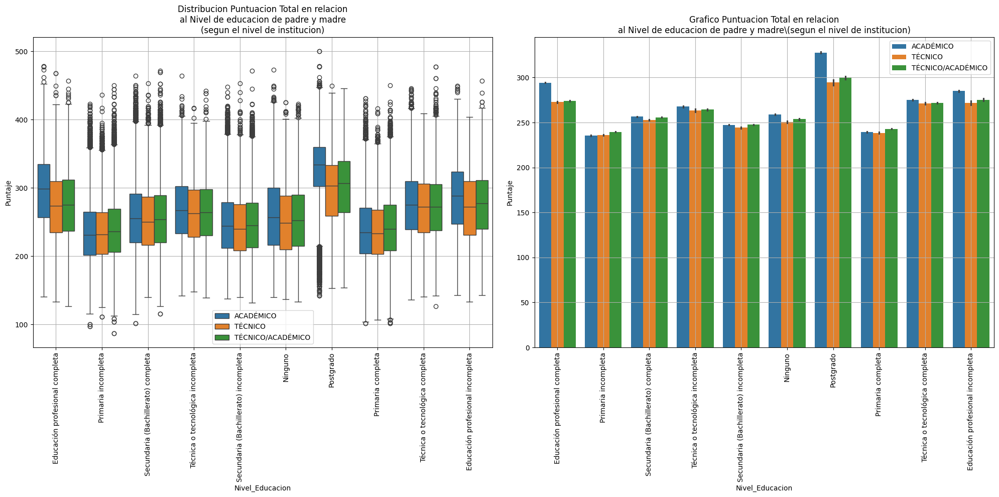

In [ ]:
pregunta_16_conjunta()

En este tipo de analisis conjunto, podemos soslayar que el nivel de correlacion positiva directa entre el nivel de educacion de los padres con respecto al puntaje total del examinado se corrobora y mantiene

En todo caso, se agrega a las conclusiones del analisis que el nivel de e¿isntitucion academico tiende a elevar el puntaje total de los examinados cuanto mayor es el nivel de estudio de los padres.

Algo similar sucede con el nivel tecnico/academico pero este tiene una relacion inversa: cuanto mas bajo es el nivel de educacion de los padres del examinado, el puntaje de los alumnos de instituciones tecnicas/academicas tiende a elevarse con respecto a los alumnos de los otros tipos de instituciones

Algo para señalar es que la incidencia del tipo de insitucion 'academica' tanto en su version pura como en su version conjunta con el tipo tecnico tiende a tener mayo influencia positiva en el puntaje del alumno independientemente del nivel de educacion de los padres con respecto al tipo de institucion puramente 'tecnica'.

## Grafico correlacion entre el rendimiento académico en inglés con el rendimiento global en el examen

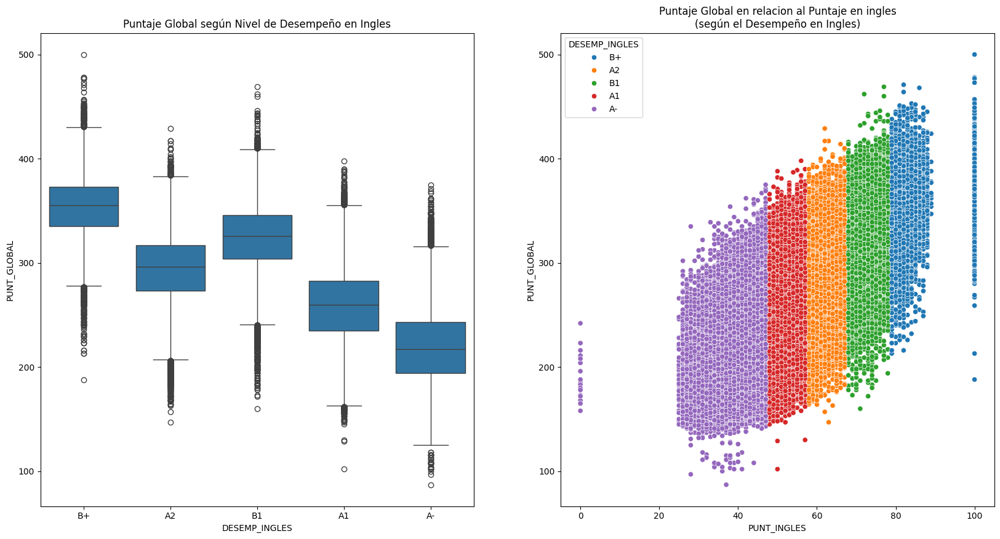

In [ ]:
pregunta_17()

Vemos que existe una clara correlacion lineal positiva y directa entre la puntuacion total y el puntaje en ingles y/o el desempeño en ingles que haya tenido el examinado.

Mientras el puntaje en ingles y/o el desempeño en ingles sea mas alto, mas alto sera el puntaje total del examinado.

En pocas palabras, los alumnos con buena nota y desempeño en ingles sacan puntajes totales altos, y viceversa, los alumnos con puntajes totales altos tienden a tener un buen desempeño en ingles.

## Grafico relacion rendimiento académico entre estudiantes que viven en áreas urbanas y aquellos que viven en áreas rurales en función de la estratificación socioeconómica

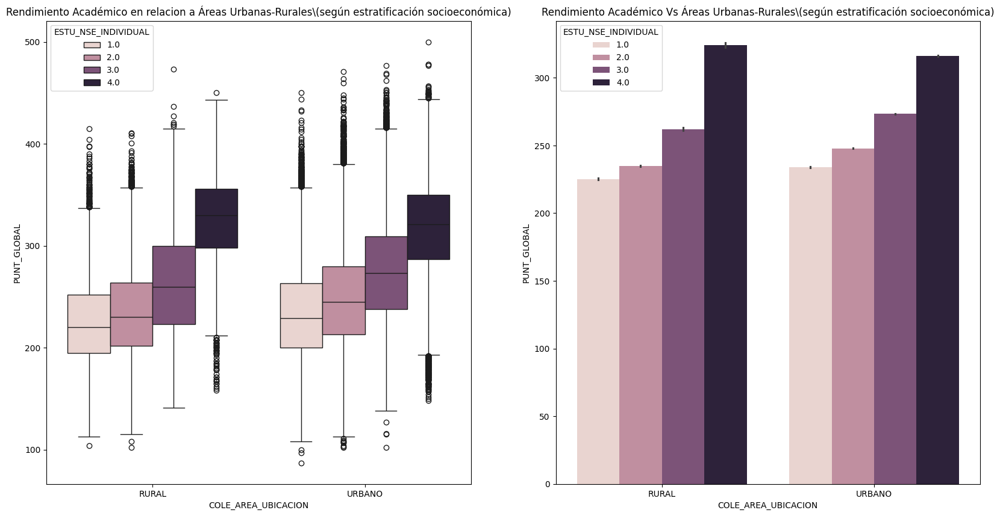

In [ ]:
pregunta_18()

Podemos ver que existe una distribucion muy similar en cuanto a desempeño y puntuacion en estudiantes que viven en areas urbanas o rurales (con una muy pequeña diferencia)

Si se puede señalar el hecho de que la diferencia entre puntuaciones aumenta cada vez mas en cuanto mas alto sea el estrato en comparacion con su inmediato anterior, tanto en estudiantes de areas urbanas como rurales

En este sentido, se ve una mayor diferencia entre el estrato NSE3 y el NSE4 en estudiantes de áreas rurales que en sus homólogos urbanos

## Grafico correlacion nivel socioeconómico individual de los estudiantes con el nivel socioeconómico promedio del establecimiento educativo

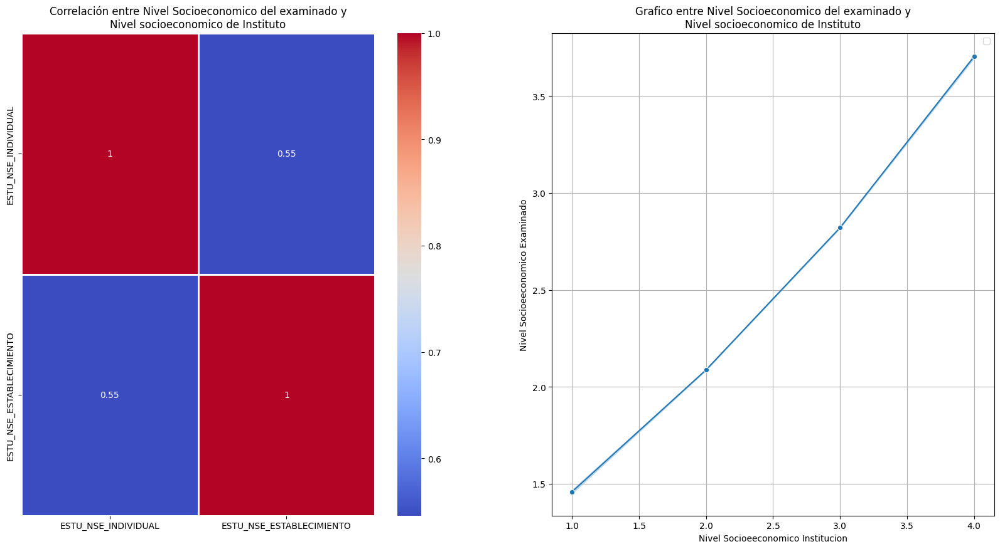

In [ ]:
pregunta_19()

En base al analisis de las features ploteadas en los graficos, podemos observar que existe una clara correlacion entre ambas variables.

La correlacion lineal es positiva y directa (cuando una variable aumenta la otra tambien) por lo que los estudiantes con mejor nivel socioeconomico tienden a ser de instituciones de alto nivel socioeconomico, y viceversa tambien... Las instituciones con un alto nivel socioeconomico tienden a tener alumnos de alto nivel socioeconomico.



# <h1 align= 'center'><u>**Conclusiones**</u></h1>